In [280]:
import os 
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from prettytable import PrettyTable


In [282]:
pd.set_option('display.max_rows',800)
pd.set_option('display.max_columns',900)
pd.options.display.max_colwidth  = 550

In [281]:
path = './data/home-credit-default-risk/'

In [4]:
print('Documentation of HomeCredit')
homecredit = pd.read_csv(path + 'HomeCredit_columns_description.csv',encoding='ISO-8859-1')
homecredit

Documentation of HomeCredit


,Unnamed: 0,Table,Row,Description,Special
0,1,application_{train|test}.csv,SK_ID_CURR,ID of loan in our sample,NaN
1,2,application_{train|test}.csv,TARGET,"Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)",NaN
2,5,application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,NaN
3,6,application_{train|test}.csv,CODE_GENDER,Gender of the client,NaN
4,7,application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,NaN
5,8,application_{train|test}.csv,FLAG_OWN_REALTY,Flag if client owns a house or flat,NaN
6,9,application_{train|test}.csv,CNT_CHILDREN,Number of children the client has,NaN
7,10,application_{train|test}.csv,AMT_INCOME_TOTAL,Income of the client,NaN
8,11,application_{train|test}.csv,AMT_CREDIT,Credit amount of the loan,NaN
9,12,application_{train|test}.csv,AMT_ANNUITY,Loan annuity,NaN


**Fonction**

In [283]:
def count_plot(df, col, title):
    total_entries = len(df[col])
    
    sns.set(style="whitegrid")
    sns.countplot(y=col, data=df)
    plt.title(title)
    
    for p in plt.gca().patches:
        percentage = '{:.1f}%'.format(100 * p.get_width() / total_entries)
        x = p.get_width()
        y = p.get_y() + p.get_height() / 2
        plt.text(x, y, percentage, ha='left', va='center', fontsize=10, fontweight='bold')

def visualize_df(df, col, title):
    sns.set(style="ticks", rc={'figure.figsize': (16, 4)})
    
    fig, axes = plt.subplots(1, 2)  
    plt.subplots_adjust(wspace=0.4)  
    
    df[col].value_counts().plot.pie(ax=axes[0])  
    axes[0].set_title('Distribution du pie chart')
    
    count_plot(df, col, title)  
    axes[1].set_title(title)
    
    plt.show()






In [284]:
def plot_hist(df,col, title):
    #plt.figure(figsize = (8,4))
    sns.set(style="ticks", rc = {'figure.figsize':(20, 4)})
   
    # histogram des variables continues:
    plt.subplot(1, 2, 1)
    sns.histplot(df[col], bins=30)
    plt.title('Histogram')

    # boxplot des variables continues:
    plt.subplot(1, 2, 2)
    sns.boxplot(y=df[col])
    plt.title('Boxplot')
    
    plt.suptitle(f"{title}",y=1.05)

    plt.show()

def plot_bar(df, col, title, size):
    "visualisation de sdonnées categorielles"
    fig, ax = plt.subplots(figsize= size)
    sns.set_palette("pastel") 
    sns.countplot(data=df, x=col, ax=ax, order=df[col].value_counts().index)
    plt.title(title, loc="center", fontsize=18)
    plt.xlabel(col)
    plt.ylabel('Count')
    #plt.xticks(rotation=45)
    plt.show()

### EDA pour les données application_train: 

### 1- Read data:

In [285]:
## read data application_train:
application_train = pd.read_csv(path + 'application_train.csv', encoding='ISO-8859-1') 

In [179]:
def data_describe(folder):
    '''Check the number of rows, columns, missing values and duplicates.
       Count type of columns.
       Memory indication'''

    data_dict = {}
    for file in folder:
        data = pd.read_csv(file,encoding='ISO-8859-1')
        data_dict[file] = [data.shape[0], 
                           data.shape[1],
                            round(data.isna().sum().sum()/data.size*100, 2),
                            round(data.duplicated().sum().sum()/data.size*100, 2),
                            data.select_dtypes(include=['object']).shape[1],
                            data.select_dtypes(include=['float']).shape[1],
                            data.select_dtypes(include=['int']).shape[1],
                            data.select_dtypes(include=['bool']).shape[1],
                            round(data.memory_usage().sum()/1024**2, 3)]

        comparative_table = pd.DataFrame.from_dict(data = data_dict, 
                                                   columns = ['Rows', 'Columns', '%NaN', '%Duplicate', 
                                                              'object_dtype','float_dtype', 'int_dtype', 
                                                              'bool_dtype', 'MB_Memory'], 
                                                   orient='index')
    print("SUMMARY FILES…")
    return(comparative_table)


#Data description
data_describe(folder = glob.glob('./data/home-credit-default-risk/*.csv'))



SUMMARY FILES…


,Rows,Columns,%NaN,%Duplicate,object_dtype,float_dtype,int_dtype,bool_dtype,MB_Memory
./data/home-credit-default-risk/bureau.csv,1716428,17,13.50,0.0,3,8,6,0,222.620
./data/home-credit-default-risk/POS_CASH_balance.csv,10001358,8,0.07,0.0,1,2,5,0,610.435
./data/home-credit-default-risk/application_test.csv,48744,121,23.81,0.0,16,65,40,0,44.998
./data/home-credit-default-risk/bureau_balance.csv,27299925,3,0.00,0.0,1,0,2,0,624.846
./data/home-credit-default-risk/HomeCredit_columns_description.csv,219,5,12.15,0.0,4,0,1,0,0.008
./data/home-credit-default-risk/application_train.csv,307511,122,24.40,0.0,16,65,41,0,286.227
./data/home-credit-default-risk/sample_submission.csv,48744,2,0.00,0.0,0,1,1,0,0.744
./data/home-credit-default-risk/installments_payments.csv,13605401,8,0.01,0.0,0,5,3,0,830.408
./data/home-credit-default-risk/previous_application.csv,1670214,37,17.98,0.0,16,15,6,0,471.481
./data/home-credit-default-risk/credit_card_balance.csv,3840312,23,6.65,0.0,1,15,7,0,673.883


In [286]:
application_train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [287]:
print('Training Features shape: ', application_train.shape)

Training Features shape:  (307511, 122)


In [288]:
application_train.dtypes.value_counts()

float64    65
int64      41
object     16
Name: count, dtype: int64

In [289]:
application_train.select_dtypes('object').nunique()

NAME_CONTRACT_TYPE             2
CODE_GENDER                    3
FLAG_OWN_CAR                   2
FLAG_OWN_REALTY                2
NAME_TYPE_SUITE                7
NAME_INCOME_TYPE               8
NAME_EDUCATION_TYPE            5
NAME_FAMILY_STATUS             6
NAME_HOUSING_TYPE              6
OCCUPATION_TYPE               18
WEEKDAY_APPR_PROCESS_START     7
ORGANIZATION_TYPE             58
FONDKAPREMONT_MODE             4
HOUSETYPE_MODE                 3
WALLSMATERIAL_MODE             7
EMERGENCYSTATE_MODE            2
dtype: int64

<Axes: >

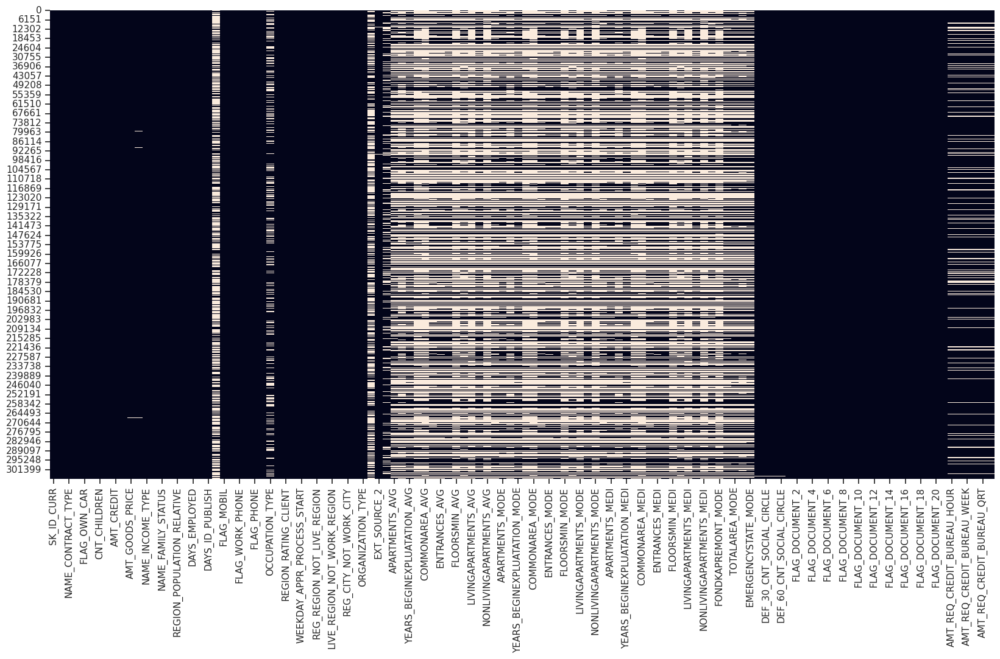

In [932]:
plt.figure(figsize=(20,10))
sns.heatmap(application_train.isna(), cbar=False)

In [290]:
messing_rate = (application_train.isna().sum()/application_train.shape[0]).sort_values(ascending = False)
messing_rate

COMMONAREA_MEDI                 0.698723
COMMONAREA_AVG                  0.698723
COMMONAREA_MODE                 0.698723
NONLIVINGAPARTMENTS_MODE        0.694330
NONLIVINGAPARTMENTS_AVG         0.694330
NONLIVINGAPARTMENTS_MEDI        0.694330
FONDKAPREMONT_MODE              0.683862
LIVINGAPARTMENTS_MODE           0.683550
LIVINGAPARTMENTS_AVG            0.683550
LIVINGAPARTMENTS_MEDI           0.683550
FLOORSMIN_AVG                   0.678486
FLOORSMIN_MODE                  0.678486
FLOORSMIN_MEDI                  0.678486
YEARS_BUILD_MEDI                0.664978
YEARS_BUILD_MODE                0.664978
YEARS_BUILD_AVG                 0.664978
OWN_CAR_AGE                     0.659908
LANDAREA_MEDI                   0.593767
LANDAREA_MODE                   0.593767
LANDAREA_AVG                    0.593767
BASEMENTAREA_MEDI               0.585160
BASEMENTAREA_AVG                0.585160
BASEMENTAREA_MODE               0.585160
EXT_SOURCE_1                    0.563811
NONLIVINGAREA_MO

## 2-Analyse univariée:

**1- Variables continues:**

/tmp/ipykernel_23963/3138141193.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(application_train[col])
/tmp/ipykernel_23963/3138141193.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(application_train[col])
/tmp/ipykernel_23963/3138141193.py:3: UserWarning: 

`distplot` is a deprecated 

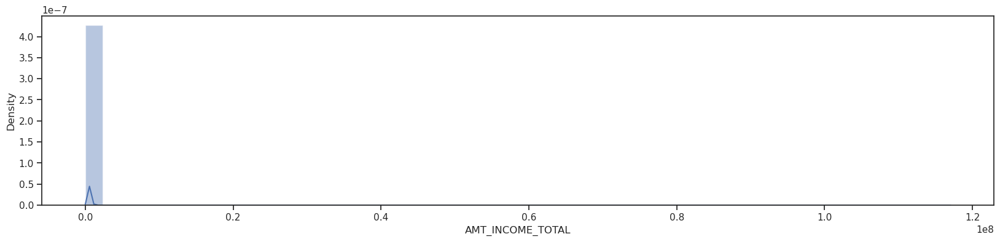

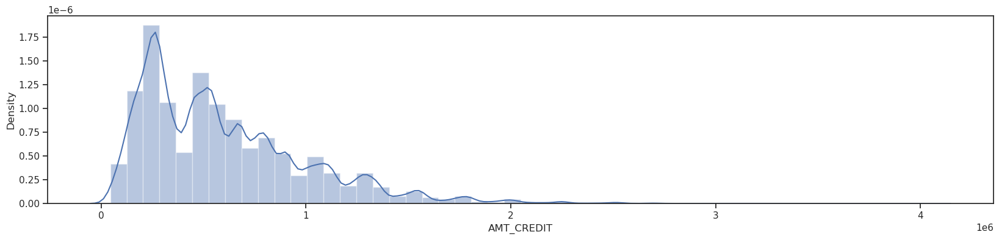

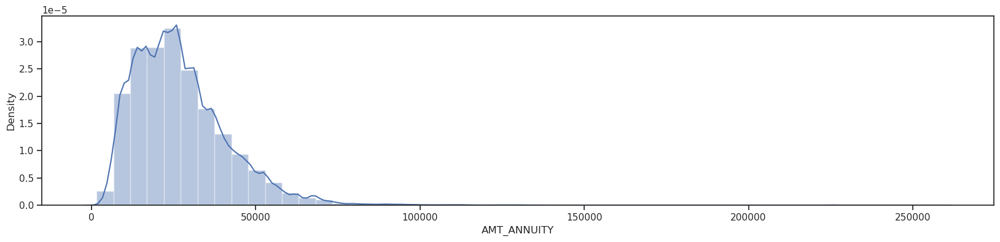

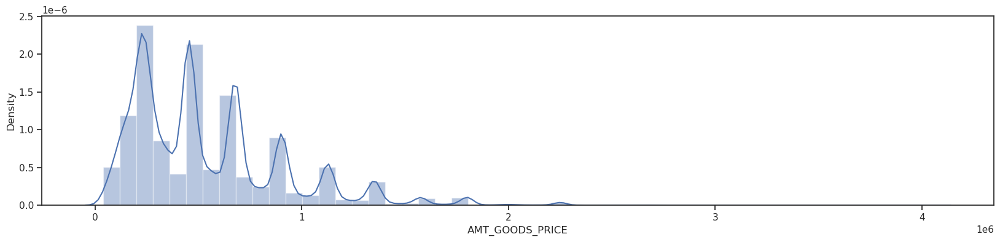

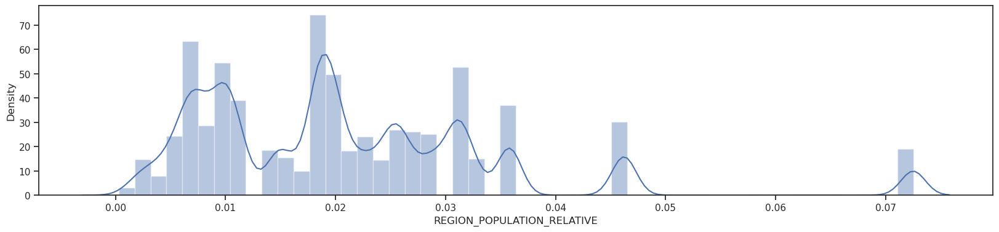

...

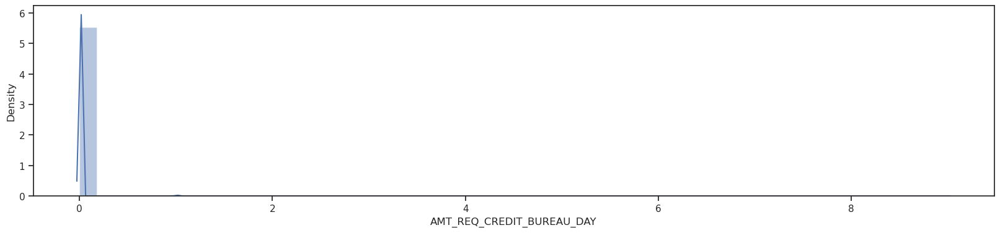

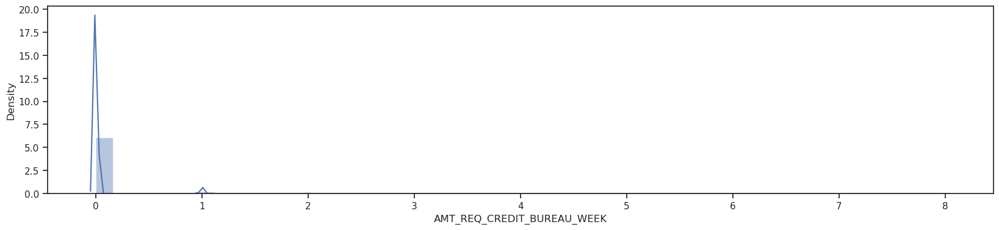

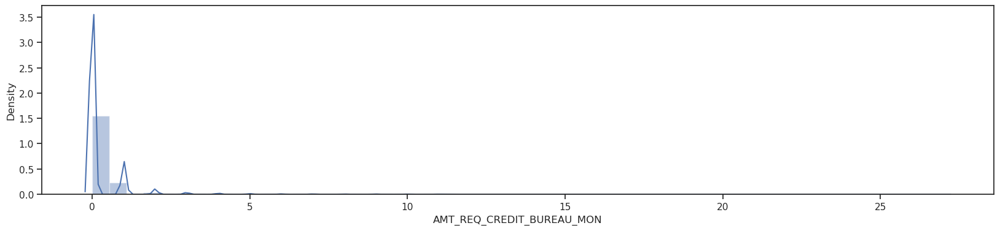

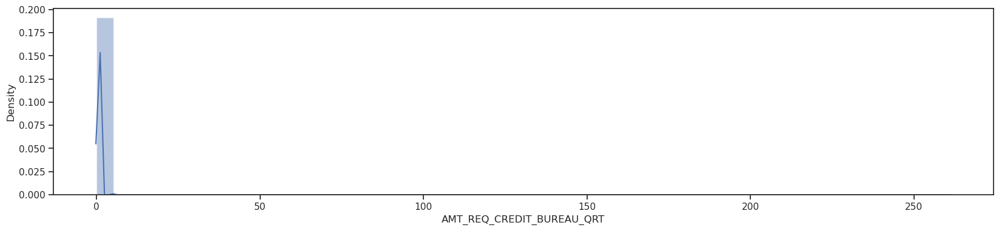

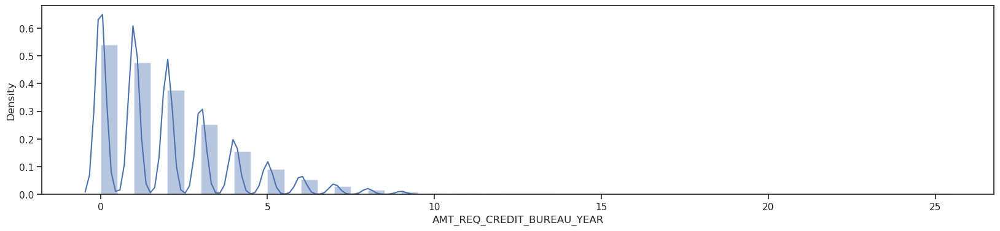

In [291]:
for col in application_train.select_dtypes('float64'):
    plt.figure()
    sns.distplot(application_train[col])

**1- variable qualitatives**

In [292]:
application_train['FLAG_MOBIL'].unique()

array([1, 0])

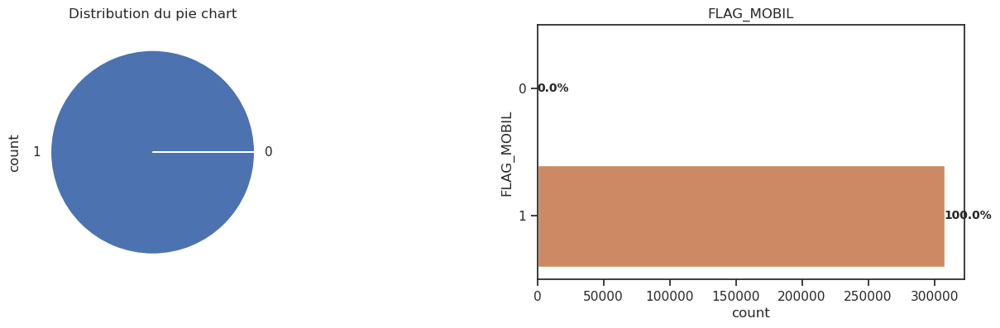

In [293]:
visualize_df(application_train,'FLAG_MOBIL','FLAG_MOBIL')

In [294]:
for col in application_train.select_dtypes('object'):

    print(f'{col :-<50} {application_train[col].unique()}')
    print()

NAME_CONTRACT_TYPE-------------------------------- ['Cash loans' 'Revolving loans']

CODE_GENDER--------------------------------------- ['M' 'F' 'XNA']

FLAG_OWN_CAR-------------------------------------- ['N' 'Y']

FLAG_OWN_REALTY----------------------------------- ['Y' 'N']

NAME_TYPE_SUITE----------------------------------- ['Unaccompanied' 'Family' 'Spouse, partner' 'Children' 'Other_A' nan
 'Other_B' 'Group of people']

NAME_INCOME_TYPE---------------------------------- ['Working' 'State servant' 'Commercial associate' 'Pensioner' 'Unemployed'
 'Student' 'Businessman' 'Maternity leave']

NAME_EDUCATION_TYPE------------------------------- ['Secondary / secondary special' 'Higher education' 'Incomplete higher'
 'Lower secondary' 'Academic degree']

NAME_FAMILY_STATUS-------------------------------- ['Single / not married' 'Married' 'Civil marriage' 'Widow' 'Separated'
 'Unknown']

NAME_HOUSING_TYPE--------------------------------- ['House / apartment' 'Rented apartment' 'With parents

**Target**

In [295]:
application_train['TARGET'].value_counts(normalize = True)*100

TARGET
0    91.927118
1     8.072882
Name: proportion, dtype: float64

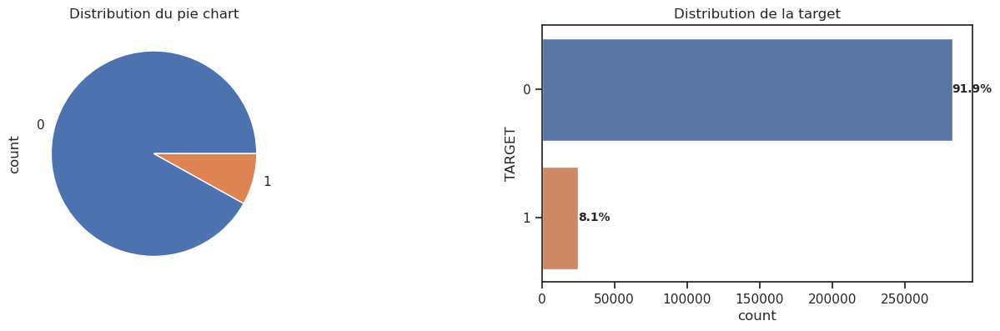

In [296]:
visualize_df(application_train, 'TARGET', 'Distribution de la target')

**code_gender**

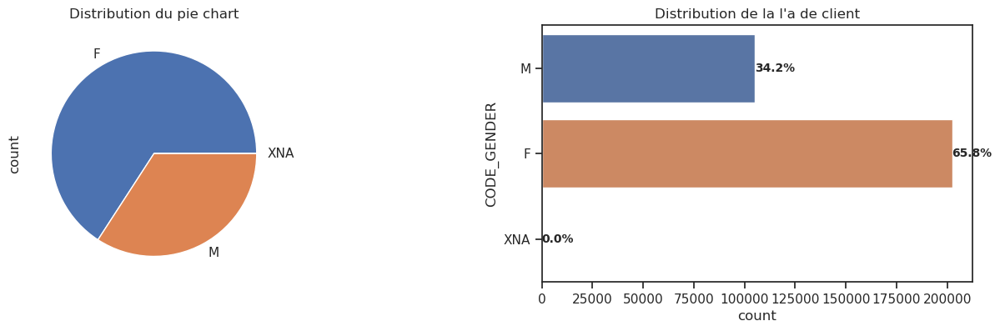

<Axes: xlabel='CODE_GENDER', ylabel='count'>

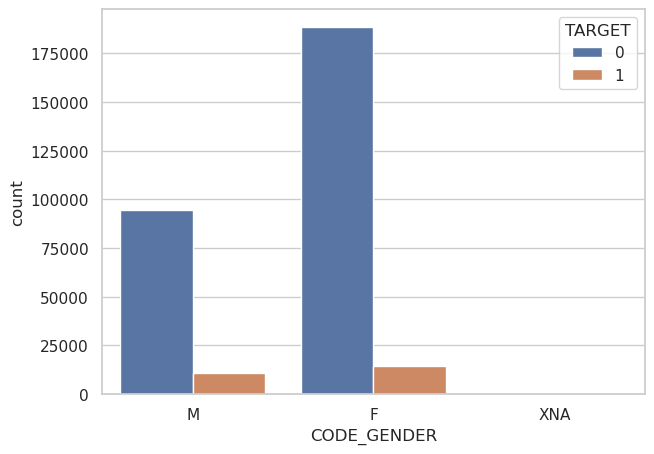

In [297]:
visualize_df(application_train, 'CODE_GENDER', "Distribution de la l'a de client")
plt.figure(figsize = (7,5))
sns.countplot(x = 'CODE_GENDER',hue = 'TARGET', data = application_train)

In [650]:
# pd.crosstab(application_train['TARGET'],application_train['CODE_GENDER'])
# sns.heatmap(pd.crosstab(application_train['TARGET'],application_train['CODE_GENDER']),annot = True,fmt = 'd')

In [298]:
# suppression de la catégories 'XNA':
indices_to_remove = application_train[application_train['CODE_GENDER'] == 'XNA'].index
application_train = application_train.drop(indices_to_remove)

**NAME_CONTRACT_TYPE**

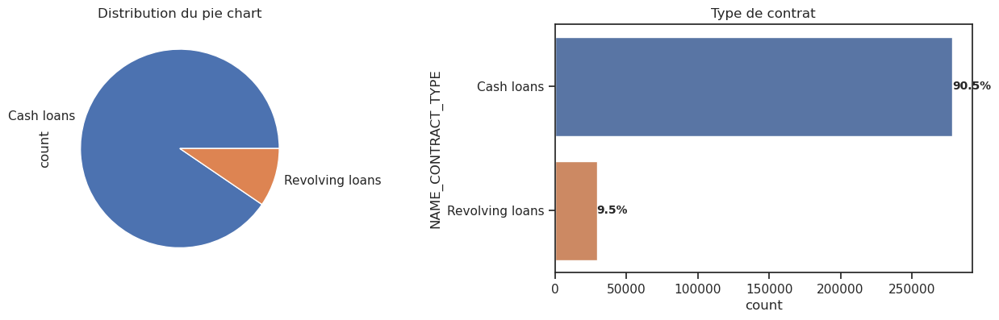

<Axes: xlabel='NAME_CONTRACT_TYPE', ylabel='count'>

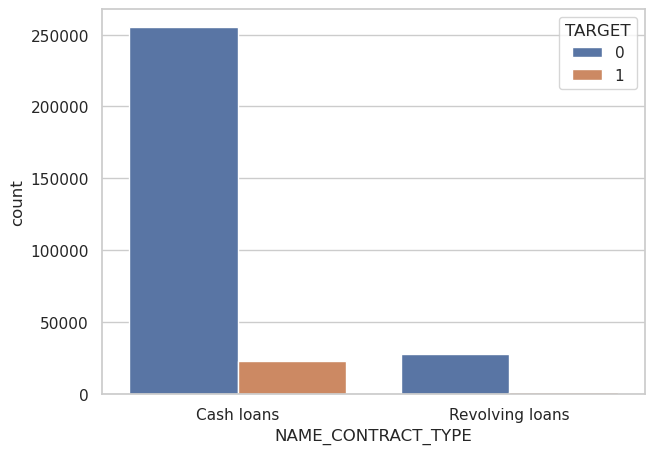

In [299]:
visualize_df(application_train, 'NAME_CONTRACT_TYPE', "Type de contrat")
plt.figure(figsize = (7,5))
sns.countplot(x = 'NAME_CONTRACT_TYPE',hue = 'TARGET', data = application_train)

**FLAG_OWN_CAR**

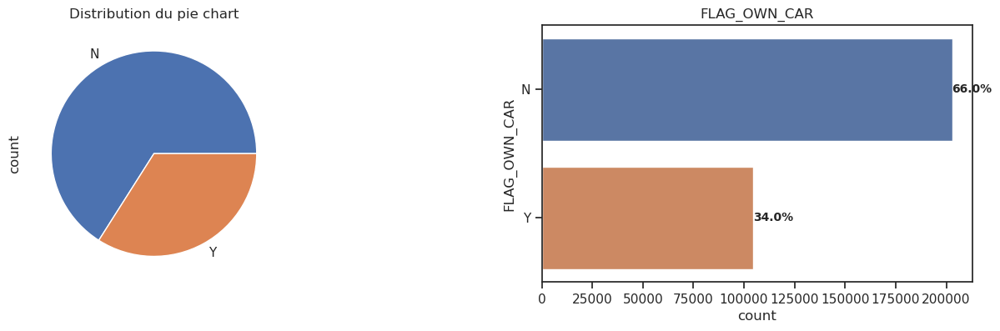

<Axes: xlabel='FLAG_OWN_CAR', ylabel='count'>

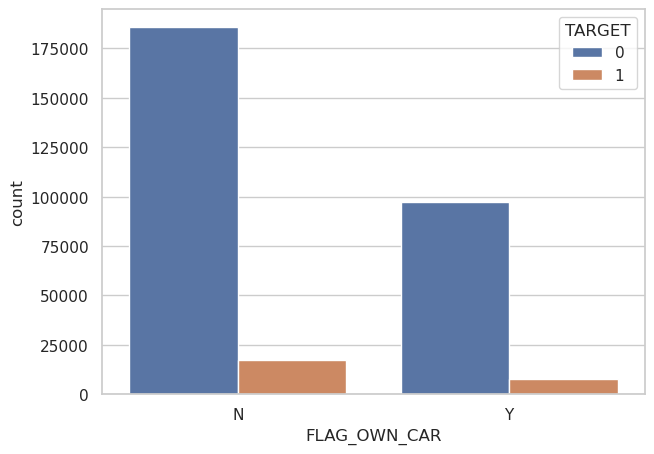

In [300]:
visualize_df(application_train, 'FLAG_OWN_CAR', "FLAG_OWN_CAR")
plt.figure(figsize = (7,5))
sns.countplot(x = 'FLAG_OWN_CAR',hue = 'TARGET', data = application_train)

**FLAG_OWN_REALTY**

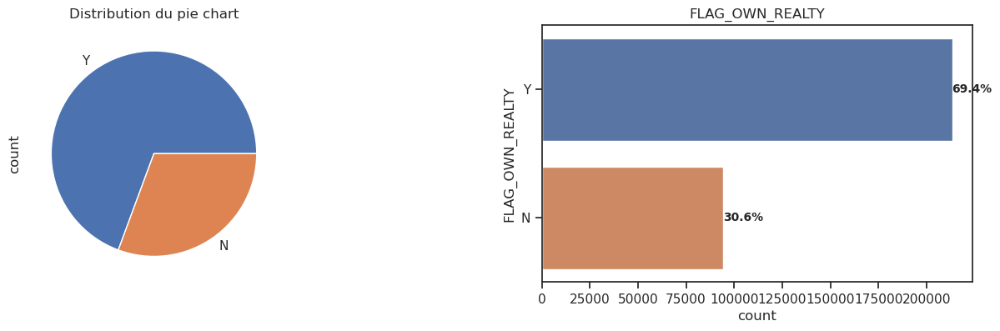

<Axes: xlabel='FLAG_OWN_REALTY', ylabel='count'>

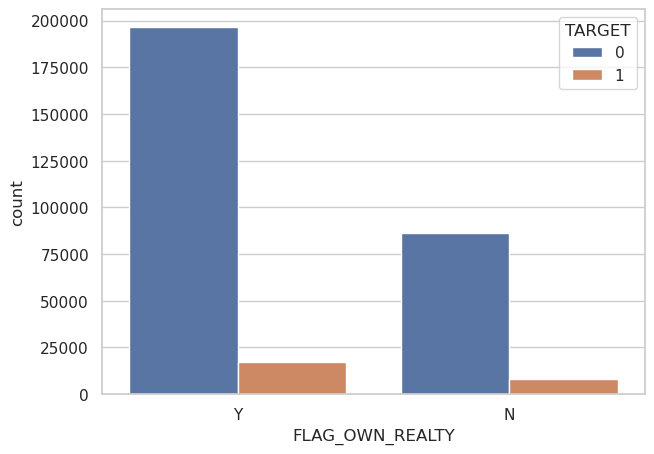

In [301]:
visualize_df(application_train, 'FLAG_OWN_REALTY', "FLAG_OWN_REALTY")
plt.figure(figsize = (7,5))
sns.countplot(x = 'FLAG_OWN_REALTY',hue = 'TARGET', data = application_train)

**NAME_TYPE_SUITE**

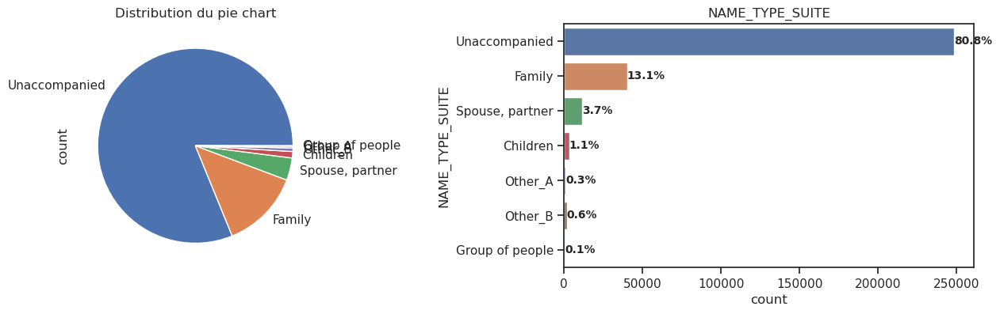

<Axes: xlabel='NAME_TYPE_SUITE', ylabel='count'>

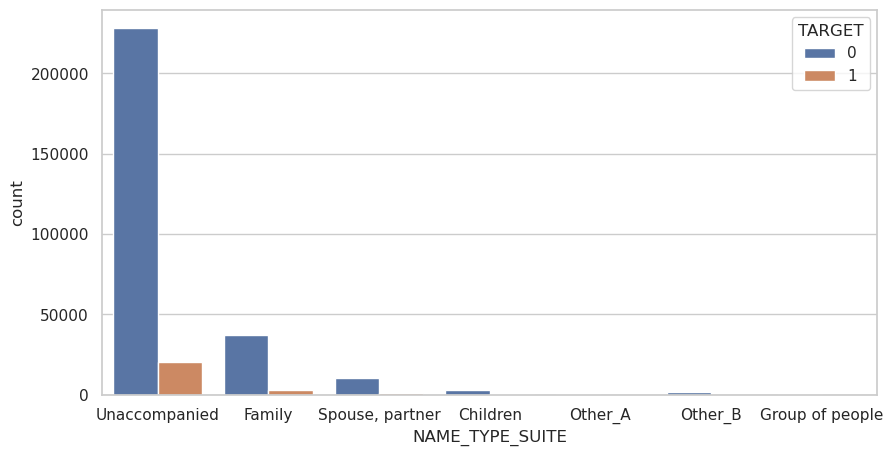

In [302]:
visualize_df(application_train,'NAME_TYPE_SUITE','NAME_TYPE_SUITE')
plt.figure(figsize = (10,5))
sns.countplot(x = 'NAME_TYPE_SUITE',hue = 'TARGET', data = application_train)

In [303]:
replacement_group = {
    'Unaccompanied':'Unaccompanied',
    'Family':'Family',
    'Spouse, partner': 'spouse_partner',
    'Children': 'Children',
    'Other_B': 'others',
    'Other_A': 'others',
    'Group of people': 'others'
     
}
application_train['NAME_TYPE_SUITE'].replace(replacement_group, inplace=True)

<Axes: xlabel='NAME_TYPE_SUITE', ylabel='count'>

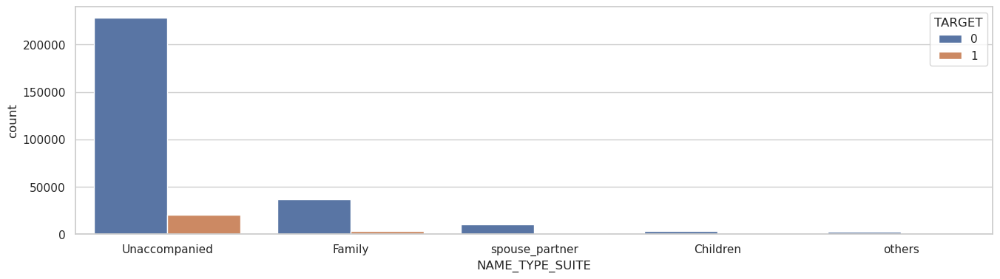

In [305]:
sns.countplot(x = 'NAME_TYPE_SUITE',hue = 'TARGET', data = application_train)

**NAME_INCOME_TYPE**

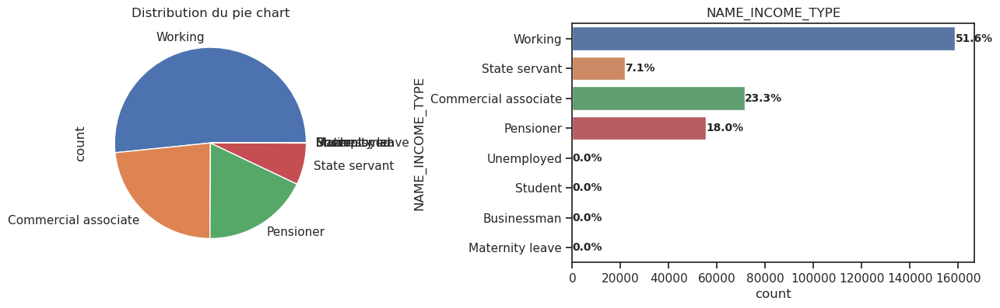

<Axes: xlabel='NAME_INCOME_TYPE', ylabel='count'>

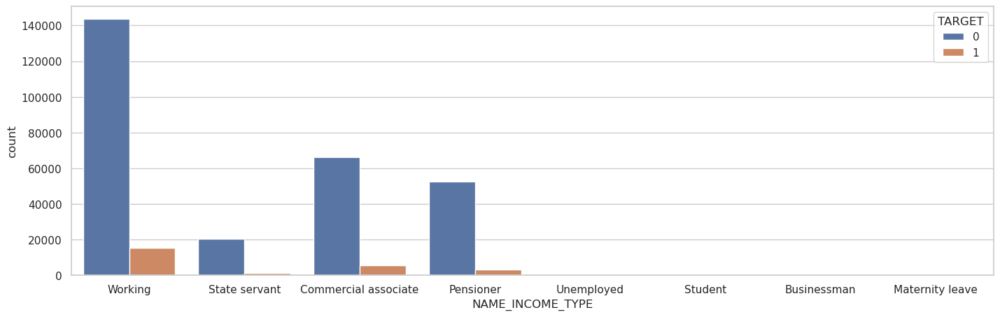

In [306]:
visualize_df(application_train,'NAME_INCOME_TYPE','NAME_INCOME_TYPE')
plt.figure(figsize = (17,5))
sns.countplot(x = 'NAME_INCOME_TYPE',hue = 'TARGET', data = application_train)

**NAME_EDUCATION_TYPE**

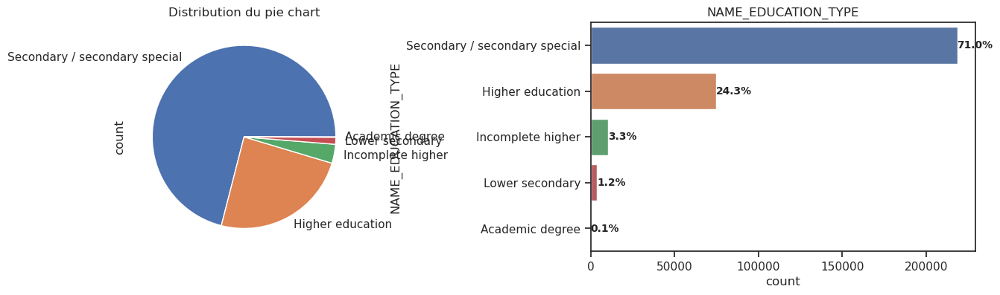

<Axes: xlabel='NAME_EDUCATION_TYPE', ylabel='count'>

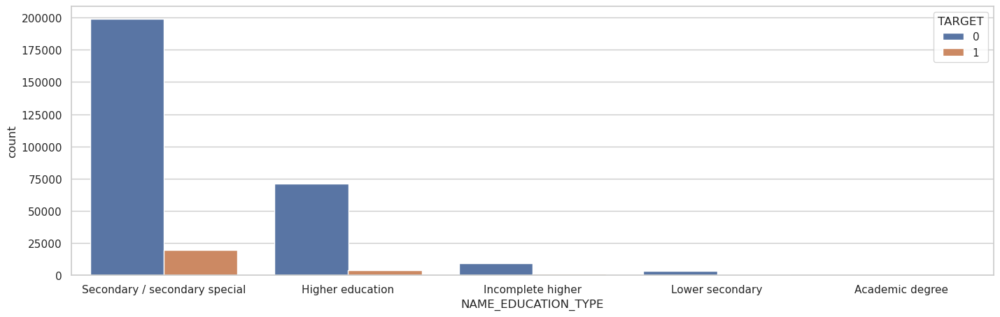

In [307]:
visualize_df(application_train,'NAME_EDUCATION_TYPE','NAME_EDUCATION_TYPE')
plt.figure(figsize = (17,5))
sns.countplot(x = 'NAME_EDUCATION_TYPE',hue = 'TARGET', data = application_train)

**NAME_FAMILY_STATUS**

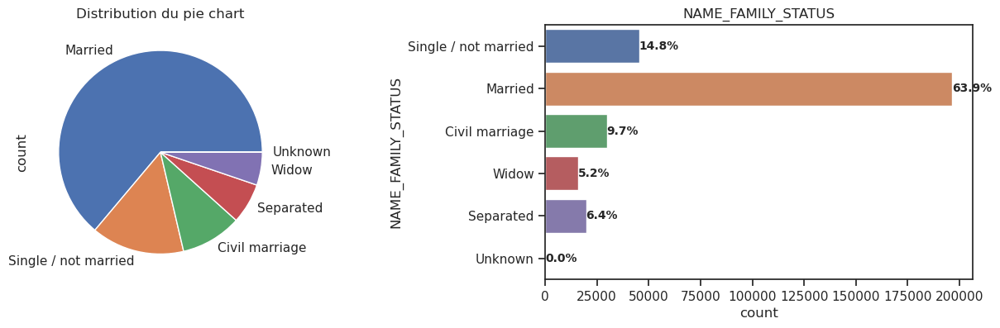

<Axes: xlabel='NAME_FAMILY_STATUS', ylabel='count'>

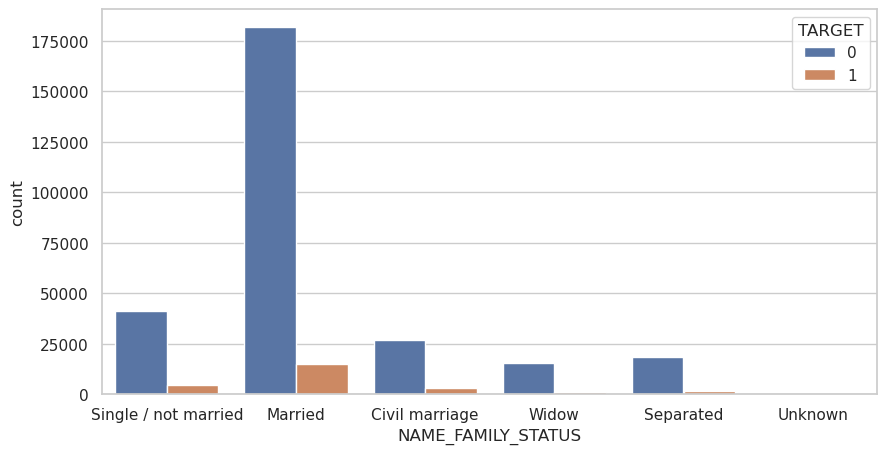

In [308]:
visualize_df(application_train,'NAME_FAMILY_STATUS','NAME_FAMILY_STATUS')
plt.figure(figsize = (10,5))
sns.countplot(x = 'NAME_FAMILY_STATUS',hue = 'TARGET', data = application_train)

In [309]:
# je supprime la categorie unknown,ça présente peu de données , ça peut etre une erreur:
indices_to_remove = application_train[application_train['NAME_FAMILY_STATUS'] == 'Unknown'].index
application_train = application_train.drop(indices_to_remove)


**NAME_HOUSING_TYPE**

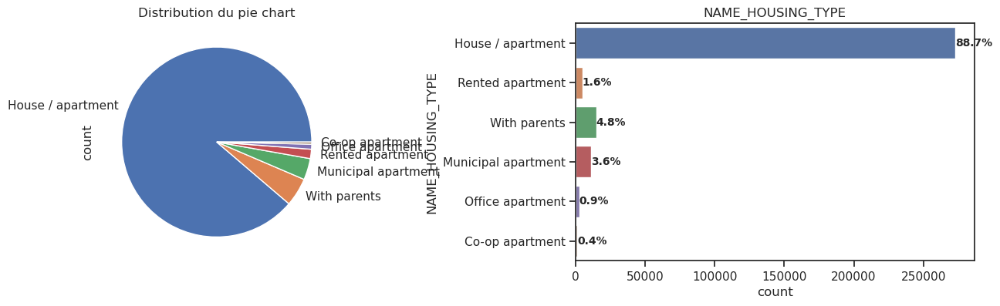

<Axes: xlabel='NAME_HOUSING_TYPE', ylabel='count'>

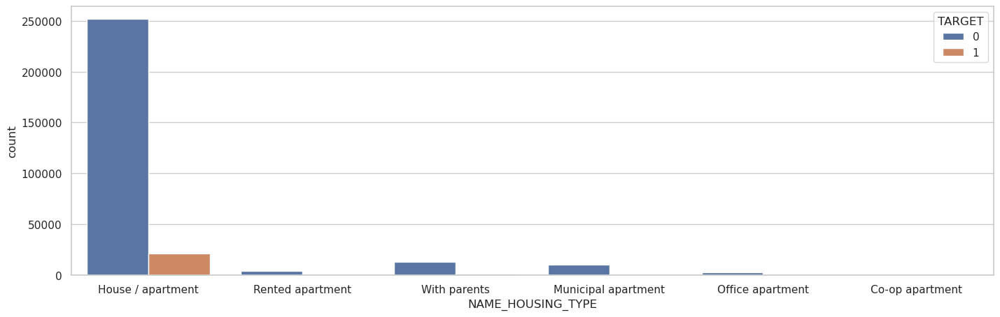

In [310]:
visualize_df(application_train,'NAME_HOUSING_TYPE','NAME_HOUSING_TYPE')
plt.figure(figsize = (17,5))
sns.countplot(x = 'NAME_HOUSING_TYPE',hue = 'TARGET', data = application_train)

**WEEKDAY_APPR_PROCESS_START**

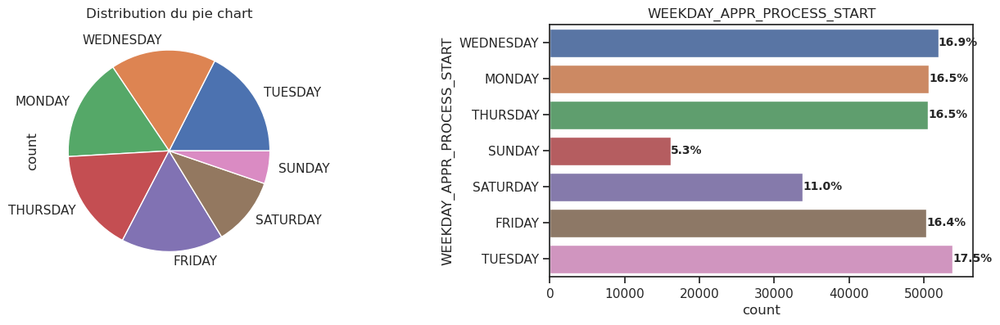

<Axes: xlabel='WEEKDAY_APPR_PROCESS_START', ylabel='count'>

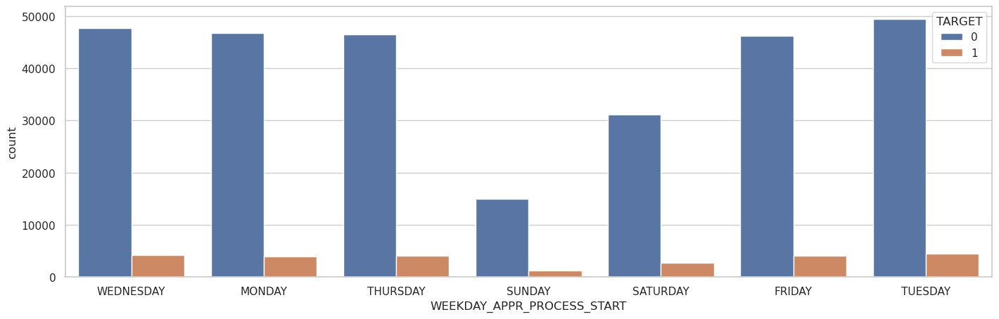

In [311]:
visualize_df(application_train,'WEEKDAY_APPR_PROCESS_START','WEEKDAY_APPR_PROCESS_START')
plt.figure(figsize = (17,5))
sns.countplot(x = 'WEEKDAY_APPR_PROCESS_START',hue = 'TARGET', data = application_train)

**ORGANIZATION_TYPE**

In [312]:
#application_train['OCCUPATION_TYPE']
application_train[application_train['TARGET']==0]['ORGANIZATION_TYPE'].mode(),application_train[application_train['TARGET']==1]['ORGANIZATION_TYPE'].mode()

(0    Business Entity Type 3
 Name: ORGANIZATION_TYPE, dtype: object,
 0    Business Entity Type 3
 Name: ORGANIZATION_TYPE, dtype: object)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57]),
 [Text(0, 0, 'Business Entity Type 3'),
  Text(1, 0, 'School'),
  Text(2, 0, 'Government'),
  Text(3, 0, 'Religion'),
  Text(4, 0, 'Other'),
  Text(5, 0, 'XNA'),
  Text(6, 0, 'Electricity'),
  Text(7, 0, 'Medicine'),
  Text(8, 0, 'Business Entity Type 2'),
  Text(9, 0, 'Self-employed'),
  Text(10, 0, 'Transport: type 2'),
  Text(11, 0, 'Construction'),
  Text(12, 0, 'Housing'),
  Text(13, 0, 'Kindergarten'),
  Text(14, 0, 'Trade: type 7'),
  Text(15, 0, 'Industry: type 11'),
  Text(16, 0, 'Military'),
  Text(17, 0, 'Services'),
  Text(18, 0, 'Security Ministries'),
  Text(19, 0, 'Transport: type 4'),
  Text(20, 0, 'Industry: type 1'),
  Text(21, 0, 'Emergency'),
  Text(22, 0, 'Security'),
  Text(23, 0, 'Trade: type 2'),
  Te

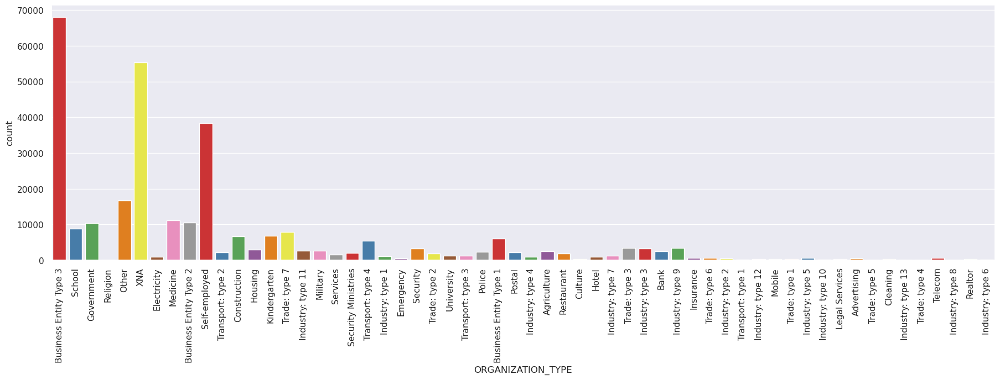

In [313]:
sns.set(style="darkgrid")  # Définissez le style du graphique
plt.figure(figsize=(22, 6))  # Réglez la taille de la figure

# Créez le graphique à barres pour la colonne 'Genre'
sns.countplot(x='ORGANIZATION_TYPE', data= application_train, palette="Set1")
plt.xticks(rotation= 90)


In [314]:
application_train['ORGANIZATION_TYPE'] = application_train['ORGANIZATION_TYPE'].replace({'XNA':application_train['ORGANIZATION_TYPE'].mode()[0]})

**OCCUPATION_TYPE**

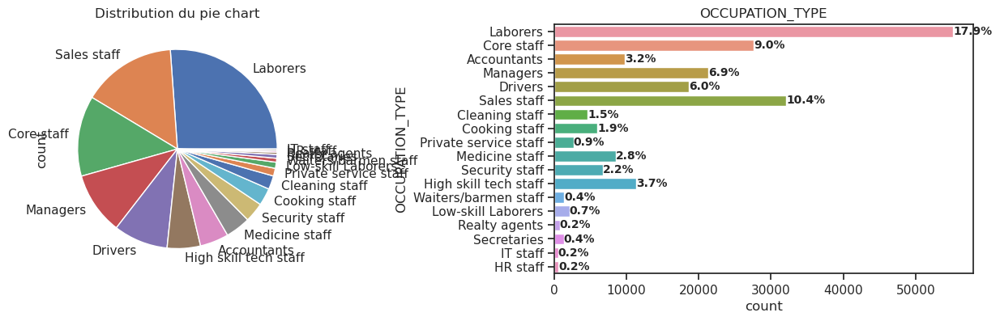

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17]),
 [Text(0, 0, 'Laborers'),
  Text(1, 0, 'Core staff'),
  Text(2, 0, 'Accountants'),
  Text(3, 0, 'Managers'),
  Text(4, 0, 'Drivers'),
  Text(5, 0, 'Sales staff'),
  Text(6, 0, 'Cleaning staff'),
  Text(7, 0, 'Cooking staff'),
  Text(8, 0, 'Private service staff'),
  Text(9, 0, 'Medicine staff'),
  Text(10, 0, 'Security staff'),
  Text(11, 0, 'High skill tech staff'),
  Text(12, 0, 'Waiters/barmen staff'),
  Text(13, 0, 'Low-skill Laborers'),
  Text(14, 0, 'Realty agents'),
  Text(15, 0, 'Secretaries'),
  Text(16, 0, 'IT staff'),
  Text(17, 0, 'HR staff')])

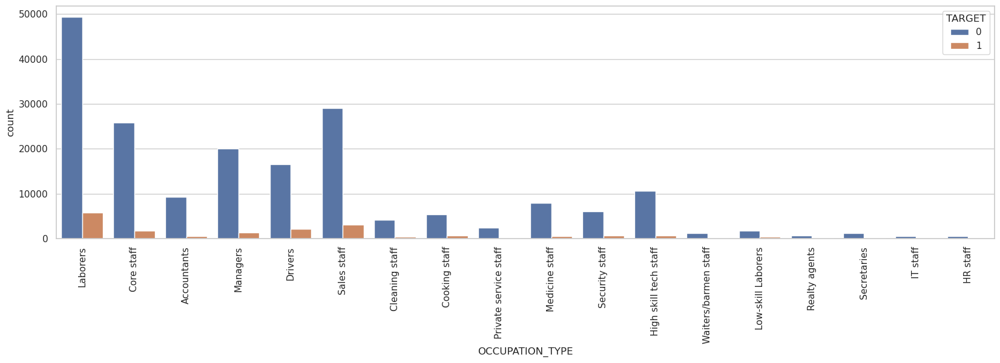

In [315]:
visualize_df(application_train,'OCCUPATION_TYPE','OCCUPATION_TYPE')
plt.figure(figsize = (20,5))
sns.countplot(x = 'OCCUPATION_TYPE',hue = 'TARGET', data = application_train)
plt.xticks(rotation = 90)

In [316]:
application_train[application_train['TARGET']==0]['OCCUPATION_TYPE'].mode(),application_train[application_train['TARGET']==1]['OCCUPATION_TYPE'].mode()

(0    Laborers
 Name: OCCUPATION_TYPE, dtype: object,
 0    Laborers
 Name: OCCUPATION_TYPE, dtype: object)

**EMERGENCYSTATE_MODE**

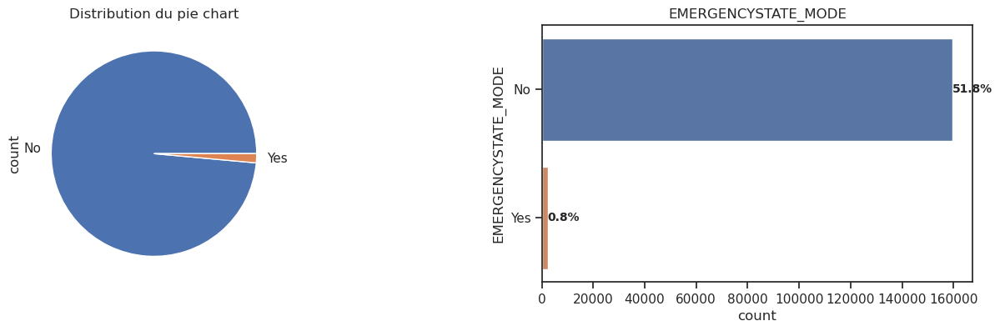

(array([0, 1]), [Text(0, 0, 'No'), Text(1, 0, 'Yes')])

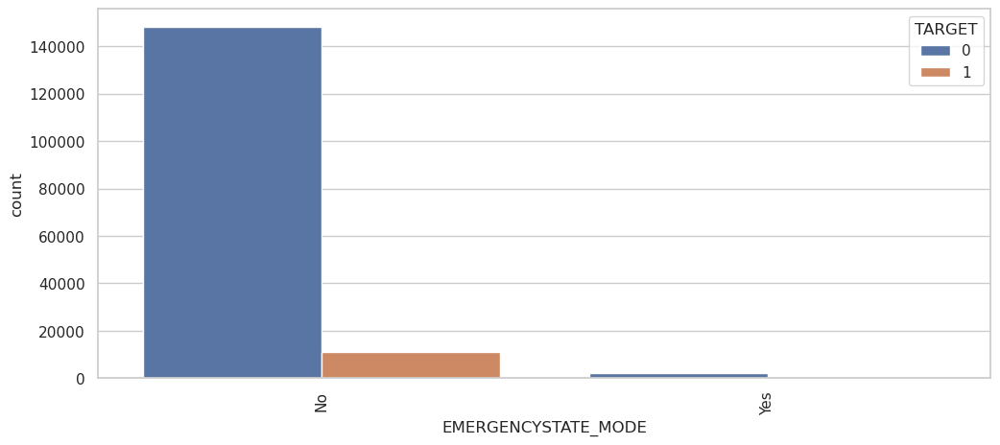

In [317]:
visualize_df(application_train,'EMERGENCYSTATE_MODE','EMERGENCYSTATE_MODE')
plt.figure(figsize = (12,5))
sns.countplot(x = 'EMERGENCYSTATE_MODE',hue = 'TARGET', data = application_train)
plt.xticks(rotation = 90)

In [318]:
#application_train['OCCUPATION_TYPE']
application_train[application_train['TARGET']==0]['EMERGENCYSTATE_MODE'].mode(),application_train[application_train['TARGET']==1]['EMERGENCYSTATE_MODE'].mode()

(0    No
 Name: EMERGENCYSTATE_MODE, dtype: object,
 0    No
 Name: EMERGENCYSTATE_MODE, dtype: object)

**WALLSMATERIAL_MODE**

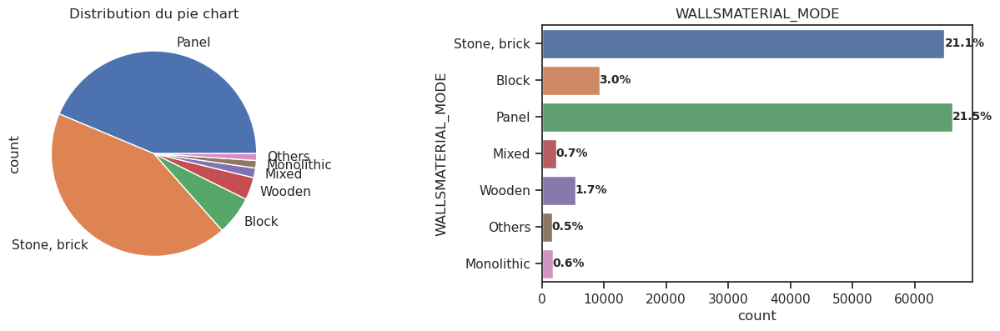

(array([0, 1, 2, 3, 4, 5, 6]),
 [Text(0, 0, 'Stone, brick'),
  Text(1, 0, 'Block'),
  Text(2, 0, 'Panel'),
  Text(3, 0, 'Mixed'),
  Text(4, 0, 'Wooden'),
  Text(5, 0, 'Others'),
  Text(6, 0, 'Monolithic')])

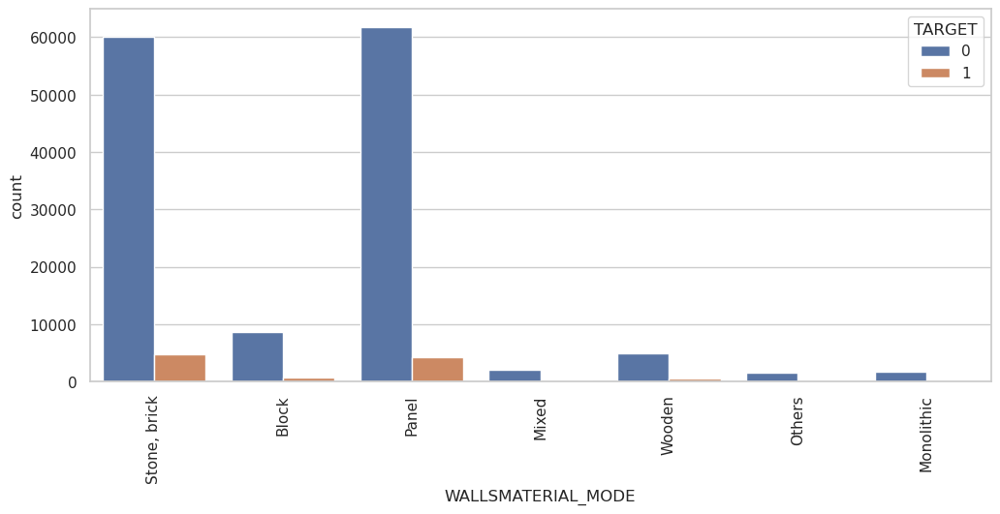

In [319]:
visualize_df(application_train,'WALLSMATERIAL_MODE','WALLSMATERIAL_MODE')
plt.figure(figsize = (12,5))
sns.countplot(x = 'WALLSMATERIAL_MODE',hue = 'TARGET', data = application_train)
plt.xticks(rotation = 90)

In [320]:
application_train[application_train['TARGET']==0]['WALLSMATERIAL_MODE'].mode(),application_train[application_train['TARGET']==1]['WALLSMATERIAL_MODE'].mode()

(0    Panel
 Name: WALLSMATERIAL_MODE, dtype: object,
 0    Stone, brick
 Name: WALLSMATERIAL_MODE, dtype: object)

**FONDKAPREMONT_MODE**

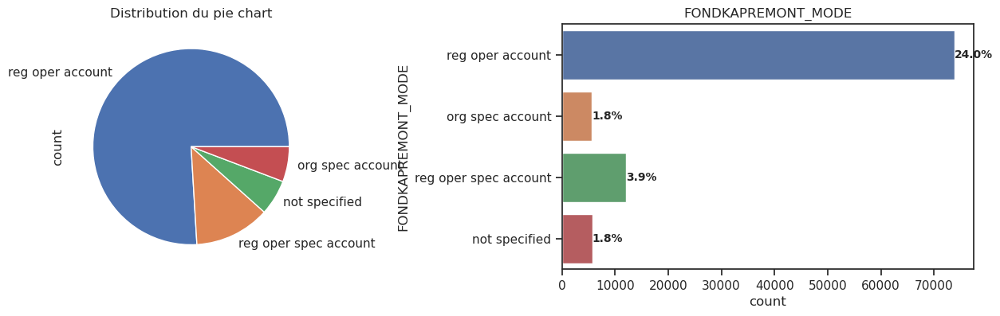

(array([0, 1, 2, 3]),
 [Text(0, 0, 'reg oper account'),
  Text(1, 0, 'org spec account'),
  Text(2, 0, 'reg oper spec account'),
  Text(3, 0, 'not specified')])

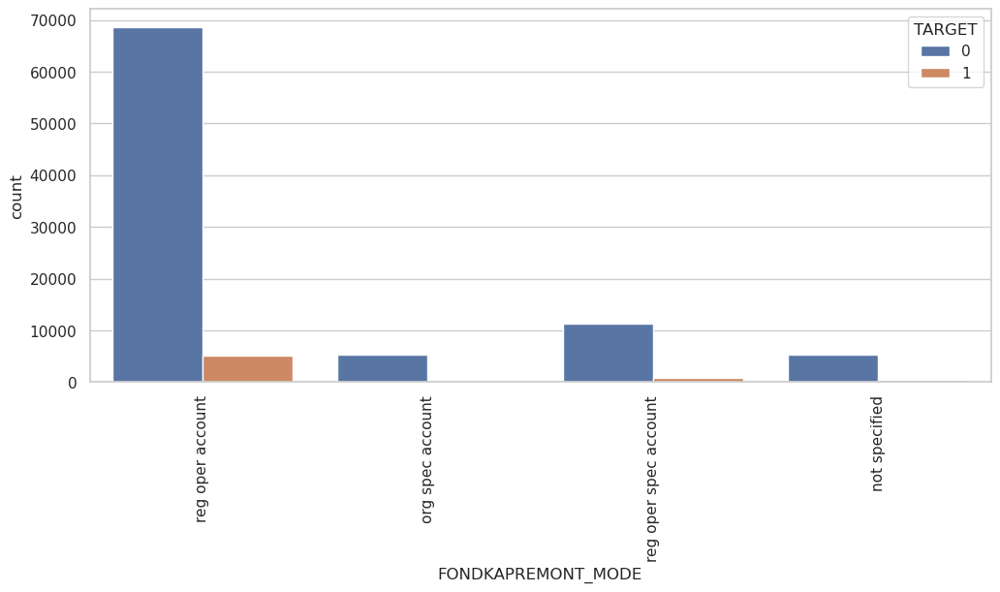

In [321]:
visualize_df(application_train,'FONDKAPREMONT_MODE','FONDKAPREMONT_MODE')
plt.figure(figsize = (12,5))
sns.countplot(x = 'FONDKAPREMONT_MODE',hue = 'TARGET', data = application_train)
plt.xticks(rotation = 90)

* je remplace egalement par la médiane

In [322]:
#application_train['OCCUPATION_TYPE']
application_train[application_train['TARGET']==0]['FONDKAPREMONT_MODE'].mode(),application_train[application_train['TARGET']==1]['FONDKAPREMONT_MODE'].mode()

(0    reg oper account
 Name: FONDKAPREMONT_MODE, dtype: object,
 0    reg oper account
 Name: FONDKAPREMONT_MODE, dtype: object)

**HOUSETYPE_MODE**

In [323]:
application_train['HOUSETYPE_MODE'].unique()

array(['block of flats', nan, 'terraced house', 'specific housing'],
      dtype=object)

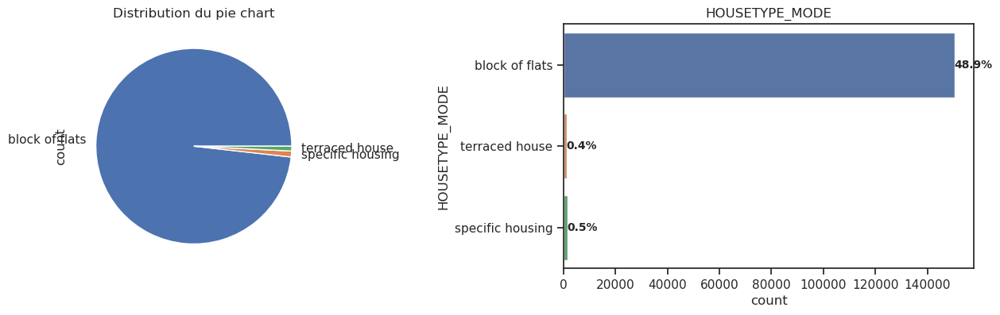

(array([0, 1, 2]),
 [Text(0, 0, 'block of flats'),
  Text(1, 0, 'terraced house'),
  Text(2, 0, 'specific housing')])

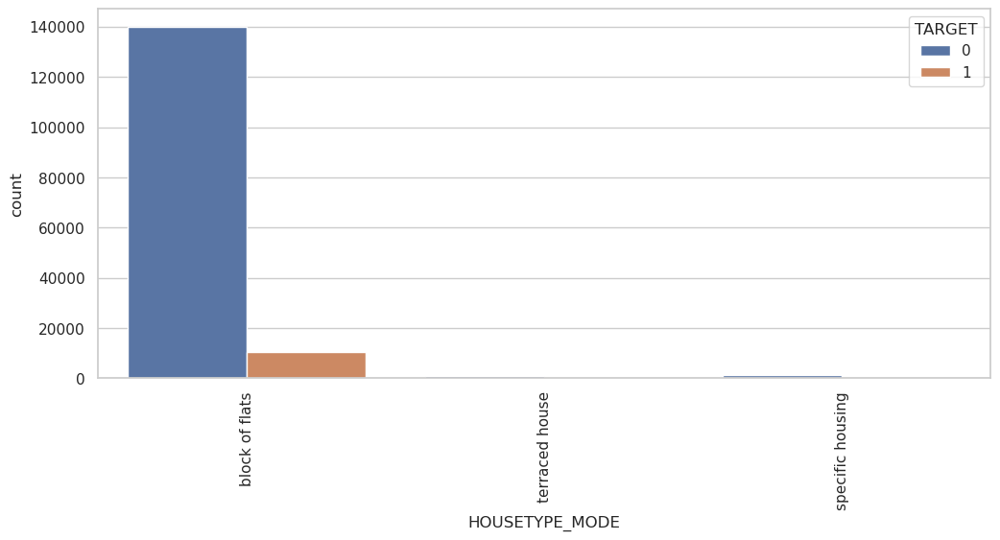

In [324]:
visualize_df(application_train,'HOUSETYPE_MODE','HOUSETYPE_MODE')
plt.figure(figsize = (12,5))
sns.countplot(x = 'HOUSETYPE_MODE',hue = 'TARGET', data = application_train)
plt.xticks(rotation = 90)

In [325]:
#application_train['OCCUPATION_TYPE']
application_train[application_train['TARGET']==0]['HOUSETYPE_MODE'].mode(),application_train[application_train['TARGET']==1]['HOUSETYPE_MODE'].mode()

(0    block of flats
 Name: HOUSETYPE_MODE, dtype: object,
 0    block of flats
 Name: HOUSETYPE_MODE, dtype: object)

**2-Variables Enirières(type int)**

In [326]:
for col in application_train.select_dtypes('int64'):

    print(f'{col :-<50} {application_train[col].unique()}')
    print()

SK_ID_CURR---------------------------------------- [100002 100003 100004 ... 456253 456254 456255]

TARGET-------------------------------------------- [1 0]

CNT_CHILDREN-------------------------------------- [ 0  1  2  3  4  7  5  6  8  9 11 12 10 19 14]

DAYS_BIRTH---------------------------------------- [ -9461 -16765 -19046 ...  -7951  -7857 -25061]

DAYS_EMPLOYED------------------------------------- [  -637  -1188   -225 ... -12971 -11084  -8694]

DAYS_ID_PUBLISH----------------------------------- [-2120  -291 -2531 ... -6194 -5854 -6211]

FLAG_MOBIL---------------------------------------- [1 0]

FLAG_EMP_PHONE------------------------------------ [1 0]

FLAG_WORK_PHONE----------------------------------- [0 1]

FLAG_CONT_MOBILE---------------------------------- [1 0]

FLAG_PHONE---------------------------------------- [1 0]

FLAG_EMAIL---------------------------------------- [0 1]

REGION_RATING_CLIENT------------------------------ [2 1 3]

REGION_RATING_CLIENT_W_CITY--------------

In [327]:
application_train.select_dtypes('int64').columns

Index(['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_ID_PUBLISH', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE',
       'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'FLAG_DOCUMENT_2',
       'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5',
       'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8',
       'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11',
       'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14',
       'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17',
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21'],
      dtype='object')

In [328]:
liste = ['REGION_RATING_CLIENT','REGION_RATING_CLIENT_W_CITY']
application_train[liste] = application_train[liste].replace({1:'Note_1',2:'Note_2',3:'Note_3'})


In [329]:
# 1 different at city live , 0 same at city live:
liste = ['REG_REGION_NOT_WORK_REGION','REG_REGION_NOT_LIVE_REGION','LIVE_REGION_NOT_WORK_REGION','REG_CITY_NOT_LIVE_CITY',
         'REG_CITY_NOT_WORK_CITY','LIVE_CITY_NOT_WORK_CITY']
application_train[liste] = application_train[liste].replace({1:'Different',0:'Same'})

In [331]:
# je change 1 par yes et 0 par No comme indiquée sur la documentation:
liste = ['FLAG_MOBIL','FLAG_EMP_PHONE','FLAG_WORK_PHONE','FLAG_CONT_MOBILE','FLAG_PHONE', 'FLAG_EMAIL',
         'FLAG_DOCUMENT_2','FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5','FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8',
       'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11','FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14',
       'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20','FLAG_DOCUMENT_21']

application_train[liste] = application_train[liste].replace({1:'Yes',0:'No'})


In [332]:
application_train['REG_REGION_NOT_LIVE_REGION'].unique()

array(['Same', 'Different'], dtype=object)

In [333]:
len(application_train['SK_ID_CURR'].unique())

307505

In [334]:
def count_per_df(df, col, title,size):
    plt.figure(figsize= size)

    # Premier sous-graphique
    plt.subplot(1, 2, 1)
    count_plot(df, col, title)

    # Deuxième sous-graphique
    plt.subplot(1, 2, 2)
    sns.countplot(x=col, hue='TARGET', data= df)
    plt.xticks(rotation=90)


    plt.tight_layout()


    plt.show()


**CNT_CHILDREN**

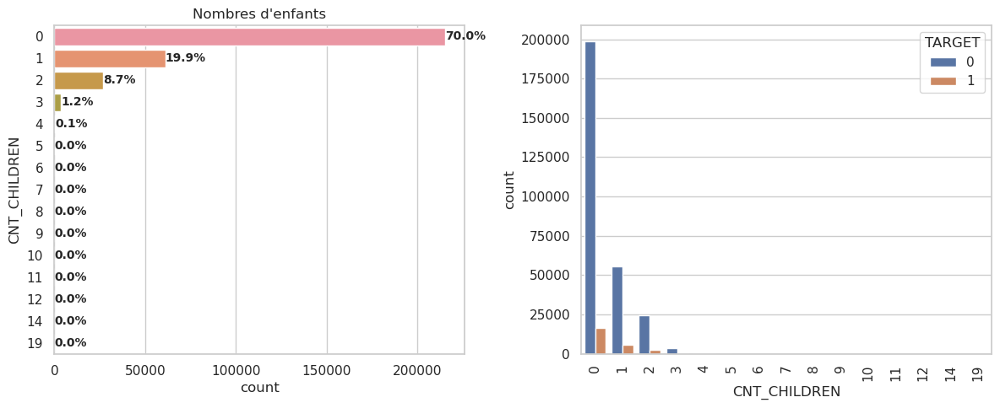

In [335]:
count_per_df(application_train, 'CNT_CHILDREN', "Nombres d'enfants",(12,5))

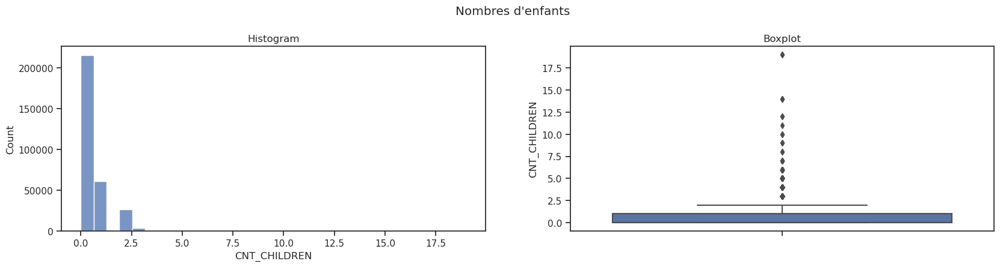

In [336]:
plot_hist(application_train, 'CNT_CHILDREN', "Nombres d'enfants")

In [337]:
def categorize_children(count):
    "cette fonction permet de regrouper le nombre d'enfants en categories"
    if count == 0:
        return 'No_children'
    elif count == 1:
        return 'one_child'
    
    else:
        return 'two_or_more'

# Appliquer la fonction pour créer une nouvelle colonne catégorisée
application_train['CNT_CHILDREN'] = application_train['CNT_CHILDREN'].apply(categorize_children)


**CNT_FAM_MEMBERS**

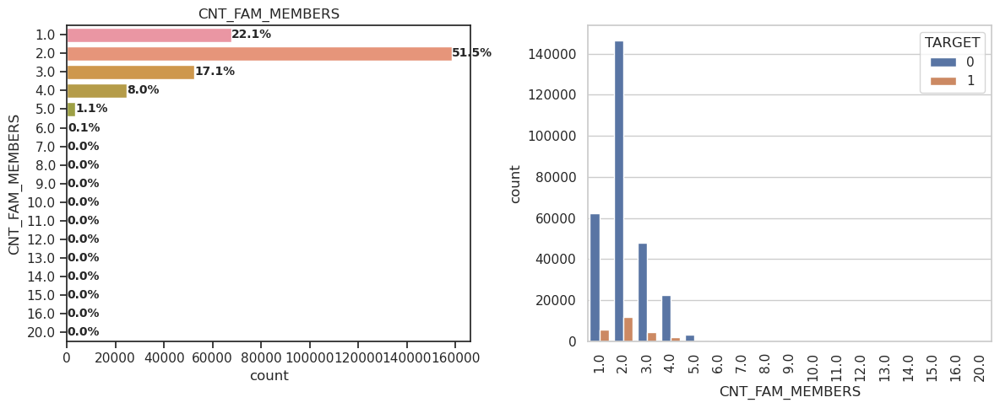

In [338]:
count_per_df(application_train, 'CNT_FAM_MEMBERS', "CNT_FAM_MEMBERS",(12,5))

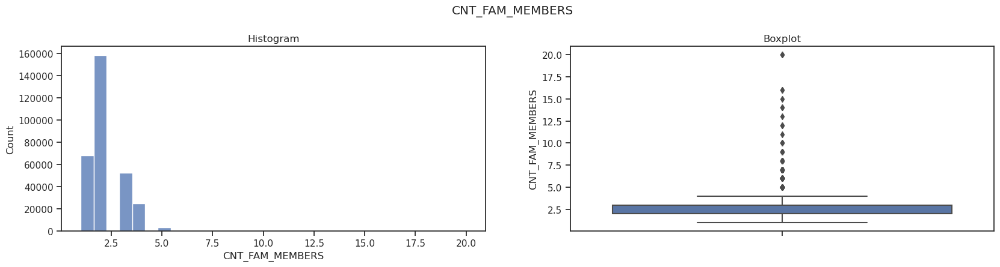

In [339]:
plot_hist(application_train, 'CNT_FAM_MEMBERS', "CNT_FAM_MEMBERS")

In [340]:
def categorize_family_members(count):
    "Function to categorize family members"

    if count == 1.0:
        return 'Single_person'
    elif count <= 4.0:
        return 'Small_family'
    elif count <= 6.0:
        return 'Medium_family'
    else:
        return 'Large_family'
# Apply the function to create a new categorized column
application_train['CNT_FAM_MEMBERS'] = application_train['CNT_FAM_MEMBERS'].apply(categorize_family_members)




* Flag mobile et autre varibles:

Text(0.5, 1.0, 'FLAG_EMAIL')

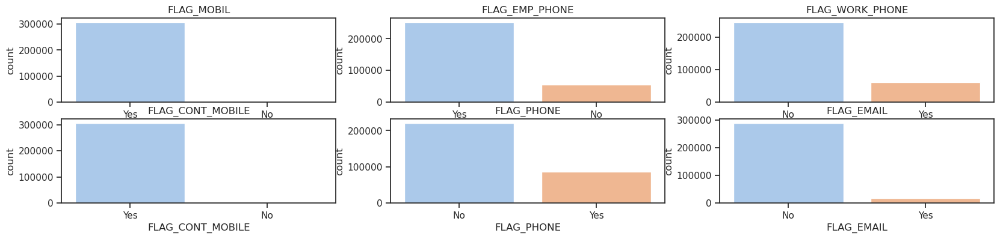

In [341]:

sns.set(style="ticks", rc = {'figure.figsize':(20, 4)})
   
plt.subplot(2, 3, 1)
sns.set_palette("pastel")
sns.countplot(data = application_train, x = 'FLAG_MOBIL', order=application_train['FLAG_MOBIL'].value_counts().index)
plt.title('FLAG_MOBIL')
 

plt.subplot(2, 3, 2)
sns.countplot(data = application_train, x = 'FLAG_EMP_PHONE',order=application_train['FLAG_EMP_PHONE'].value_counts().index)
plt.title('FLAG_EMP_PHONE')


plt.subplot(2, 3, 3)
sns.countplot(data = application_train, x = 'FLAG_WORK_PHONE', order=application_train['FLAG_WORK_PHONE'].value_counts().index)
plt.title('FLAG_WORK_PHONE')

plt.subplot(2, 3, 4)
sns.countplot(data = application_train, x = 'FLAG_CONT_MOBILE', order=application_train['FLAG_CONT_MOBILE'].value_counts().index)
plt.title('FLAG_CONT_MOBILE')


plt.subplot(2, 3, 5)
sns.countplot(data = application_train, x = 'FLAG_PHONE', order=application_train['FLAG_PHONE'].value_counts().index)
plt.title('FLAG_PHONE')


plt.subplot(2, 3, 6)
sns.countplot(data = application_train, x = 'FLAG_EMAIL', order=application_train['FLAG_EMAIL'].value_counts().index)
plt.title('FLAG_EMAIL')


**Flag documents**

Text(0.5, 1.0, 'FLAG_DOCUMENT_21')

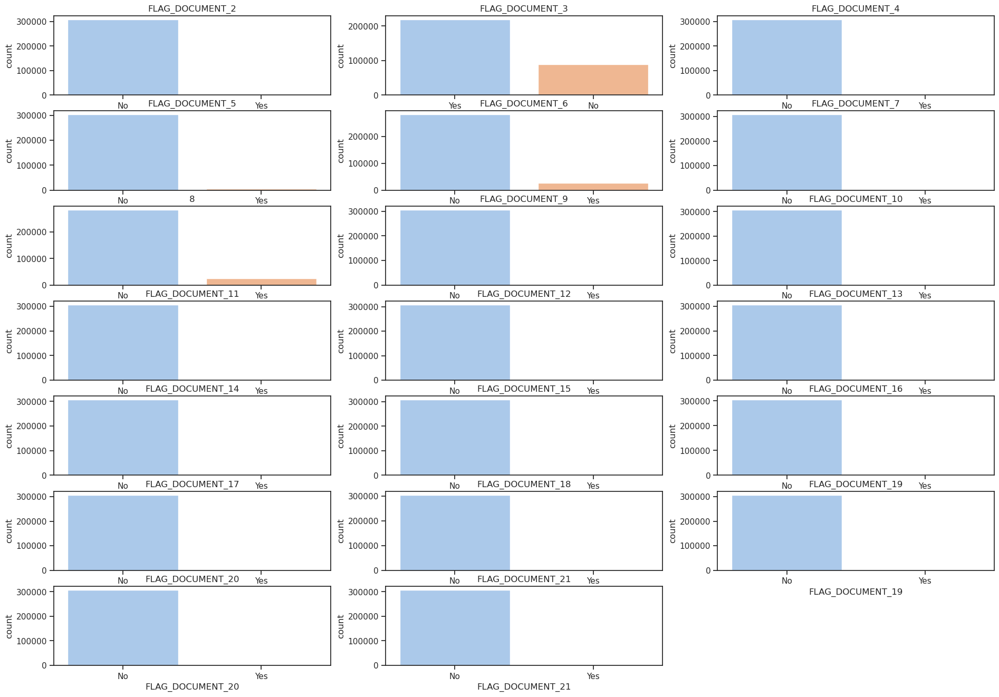

In [342]:
sns.set(style="ticks", rc = {'figure.figsize':(23,16 )})
   
plt.subplot(7, 3, 1)
sns.set_palette("pastel")
sns.countplot(data = application_train, x = 'FLAG_DOCUMENT_2', order=application_train['FLAG_DOCUMENT_2'].value_counts().index)
plt.title('FLAG_DOCUMENT_2')
 

plt.subplot(7, 3, 2)
sns.countplot(data = application_train, x = 'FLAG_DOCUMENT_3', order=application_train['FLAG_DOCUMENT_3'].value_counts().index)
plt.title('FLAG_DOCUMENT_3')


plt.subplot(7, 3, 3)
sns.countplot(data = application_train, x = 'FLAG_DOCUMENT_4', order=application_train['FLAG_DOCUMENT_4'].value_counts().index)
plt.title('FLAG_DOCUMENT_4')

plt.subplot(7, 3, 4)
sns.countplot(data = application_train, x = 'FLAG_DOCUMENT_5', order=application_train['FLAG_DOCUMENT_5'].value_counts().index)
plt.title('FLAG_DOCUMENT_5')


plt.subplot(7, 3, 5)
sns.countplot(data = application_train, x = 'FLAG_DOCUMENT_6', order=application_train['FLAG_DOCUMENT_6'].value_counts().index)
plt.title('FLAG_DOCUMENT_6')


plt.subplot(7, 3, 6)
sns.countplot(data = application_train, x = 'FLAG_DOCUMENT_7', order=application_train['FLAG_DOCUMENT_7'].value_counts().index)
plt.title('FLAG_DOCUMENT_7')

plt.subplot(7, 3, 7)
sns.countplot(data = application_train, x = 'FLAG_DOCUMENT_8', order=application_train['FLAG_DOCUMENT_8'].value_counts().index)
plt.title('8')

plt.subplot(7, 3, 8)
sns.countplot(data = application_train, x = 'FLAG_DOCUMENT_9', order=application_train['FLAG_DOCUMENT_9'].value_counts().index)
plt.title('FLAG_DOCUMENT_9')

plt.subplot(7, 3, 9)
sns.countplot(data = application_train, x = 'FLAG_DOCUMENT_10', order=application_train['FLAG_DOCUMENT_10'].value_counts().index)
plt.title('FLAG_DOCUMENT_10')

plt.subplot(7, 3, 10)
sns.countplot(data = application_train, x = 'FLAG_DOCUMENT_11', order=application_train['FLAG_DOCUMENT_11'].value_counts().index)
plt.title('FLAG_DOCUMENT_11')

plt.subplot(7, 3, 11)
sns.countplot(data = application_train, x = 'FLAG_DOCUMENT_12', order=application_train['FLAG_DOCUMENT_12'].value_counts().index)
plt.title('FLAG_DOCUMENT_12')

plt.subplot(7, 3, 12)
sns.countplot(data = application_train, x = 'FLAG_DOCUMENT_13', order=application_train['FLAG_DOCUMENT_13'].value_counts().index)
plt.title('FLAG_DOCUMENT_13')

plt.subplot(7, 3, 13)
sns.countplot(data = application_train, x = 'FLAG_DOCUMENT_14', order=application_train['FLAG_DOCUMENT_14'].value_counts().index)
plt.title('FLAG_DOCUMENT_14')

plt.subplot(7, 3, 14)
sns.countplot(data = application_train, x = 'FLAG_DOCUMENT_15', order=application_train['FLAG_DOCUMENT_15'].value_counts().index)
plt.title('FLAG_DOCUMENT_15')

plt.subplot(7, 3, 15)
sns.countplot(data = application_train, x = 'FLAG_DOCUMENT_16', order=application_train['FLAG_DOCUMENT_16'].value_counts().index)
plt.title('FLAG_DOCUMENT_16')

plt.subplot(7, 3, 16)
sns.countplot(data = application_train, x = 'FLAG_DOCUMENT_17', order=application_train['FLAG_DOCUMENT_17'].value_counts().index)
plt.title('FLAG_DOCUMENT_17')

plt.subplot(7, 3, 17)
sns.countplot(data = application_train, x = 'FLAG_DOCUMENT_18', order=application_train['FLAG_DOCUMENT_18'].value_counts().index)
plt.title('FLAG_DOCUMENT_18')

plt.subplot(7, 3, 18)
sns.countplot(data = application_train, x = 'FLAG_DOCUMENT_19', order=application_train['FLAG_DOCUMENT_19'].value_counts().index)
plt.title('FLAG_DOCUMENT_19')

plt.subplot(7, 3, 19)
sns.countplot(data = application_train, x = 'FLAG_DOCUMENT_20', order=application_train['FLAG_DOCUMENT_20'].value_counts().index)
plt.title('FLAG_DOCUMENT_20')

plt.subplot(7, 3, 20)
sns.countplot(data = application_train, x = 'FLAG_DOCUMENT_21', order=application_train['FLAG_DOCUMENT_21'].value_counts().index)
plt.title('FLAG_DOCUMENT_21')


In [343]:
list_to_drop = ['FLAG_DOCUMENT_10','FLAG_DOCUMENT_2','FLAG_DOCUMENT_12','FLAG_DOCUMENT_13','FLAG_DOCUMENT_14','FLAG_DOCUMENT_15',
 'FLAG_DOCUMENT_16','FLAG_DOCUMENT_17','FLAG_DOCUMENT_19','FLAG_DOCUMENT_20','FLAG_DOCUMENT_21','FLAG_MOBIL']

application_train.drop(columns = list_to_drop, inplace  = True , axis = 1)

**AMT_INCOME_TOTAL**

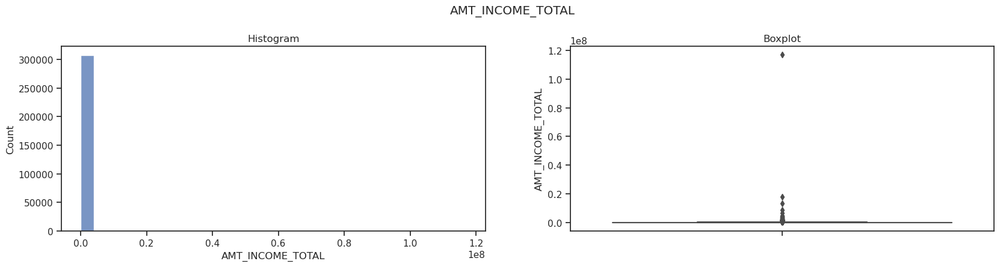

In [344]:
plot_hist(application_train, 'AMT_INCOME_TOTAL', "AMT_INCOME_TOTAL")

**DAYS_BIRTH**

In [345]:
application_train['DAYS_BIRTH'].describe()

count    307505.000000
mean     -16037.049495
std        4363.987877
min      -25229.000000
25%      -19682.000000
50%      -15750.000000
75%      -12413.000000
max       -7489.000000
Name: DAYS_BIRTH, dtype: float64

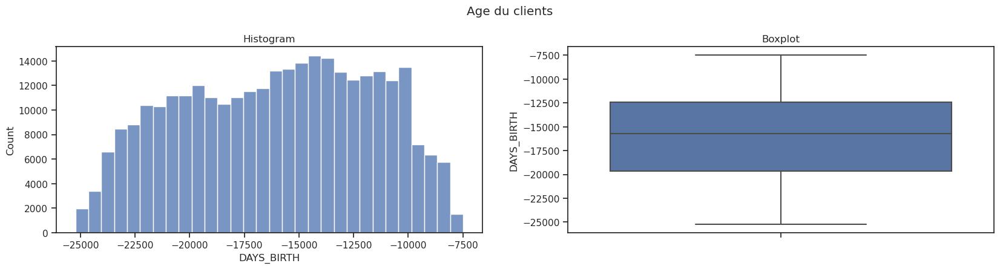

In [346]:
plot_hist(application_train,'DAYS_BIRTH',"Age du clients")


In [347]:
# calcul de l'age en année:
application_train['DAYS_BIRTH'] = abs(round(application_train['DAYS_BIRTH']/365,0))


In [66]:
# application_train['age_client'] = pd.cut(application_train['DAYS_BIRTH'], bins= np.linspace(20 ,70 , num=6))
# application_train['age_client'].head(20)


**REGION_RATING_CLIENT**

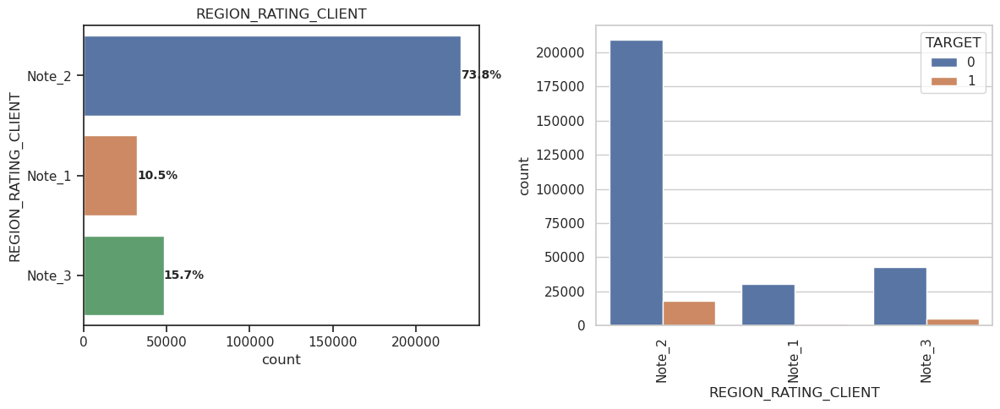

In [348]:
# application_train['REGION_RATING_CLIENT']
count_per_df(application_train, 'REGION_RATING_CLIENT', "REGION_RATING_CLIENT",(12,5))

 **REGION_RATING_CLIENT_W_CITY**


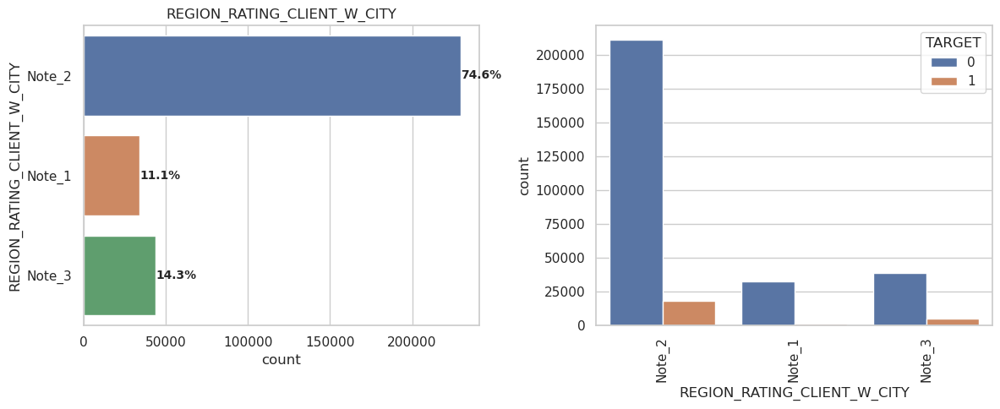

In [349]:
# application_train['REGION_RATING_CLIENT']
count_per_df(application_train, 'REGION_RATING_CLIENT_W_CITY', "REGION_RATING_CLIENT_W_CITY",(12,5))

**DAYS_EMPLOYED**

In [350]:
application_train['DAYS_EMPLOYED'].describe()

count    307505.000000
mean      63816.348794
std      141276.836143
min      -17912.000000
25%       -2760.000000
50%       -1213.000000
75%        -289.000000
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64

In [351]:
application_train['DAYS_EMPLOYED'].value_counts()

DAYS_EMPLOYED
 365243    55374
-200         156
-224         152
-199         151
-230         151
           ...  
-12588         1
-8229          1
-12794         1
-11823         1
-8694          1
Name: count, Length: 12574, dtype: int64

In [352]:
# on cherche a savoir depuis combiens d'année le client est il employé dans son entreprise:
application_train['DAYS_EMPLOYED'] = abs(round(application_train['DAYS_EMPLOYED']/365,0))

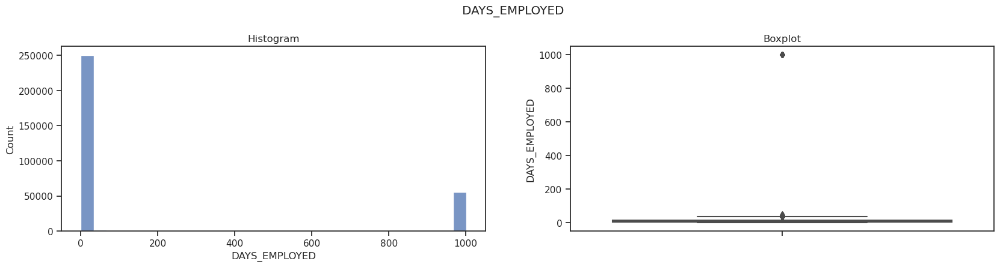

In [353]:
plot_hist(application_train,'DAYS_EMPLOYED','DAYS_EMPLOYED')

**DAYS_PUBLISHED**

In [354]:
# on cherche a savoir depuis combiens d'année le client est il employé dans son entreprise:
application_train['DAYS_ID_PUBLISH'] = abs(round(application_train['DAYS_ID_PUBLISH']/365,0))

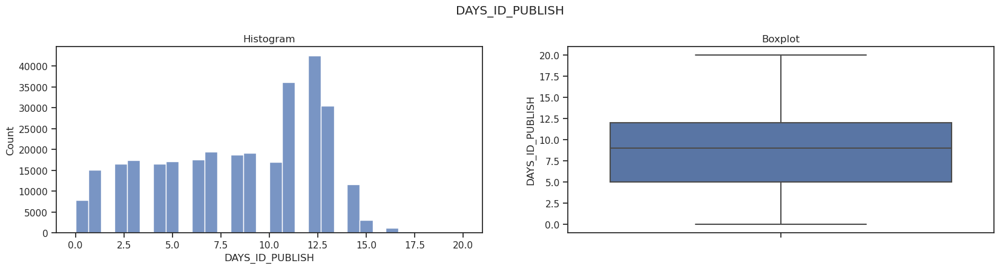

In [355]:
plot_hist(application_train,'DAYS_ID_PUBLISH','DAYS_ID_PUBLISH')

**DAYS_LAST_PHONE_CHANGE**

In [356]:
application_train['DAYS_LAST_PHONE_CHANGE'].describe()

count    307504.000000
mean       -962.861833
std         826.813977
min       -4292.000000
25%       -1570.000000
50%        -757.000000
75%        -274.000000
max           0.000000
Name: DAYS_LAST_PHONE_CHANGE, dtype: float64

In [357]:
application_train['DAYS_LAST_PHONE_CHANGE'] = abs(application_train['DAYS_LAST_PHONE_CHANGE'] / 12)

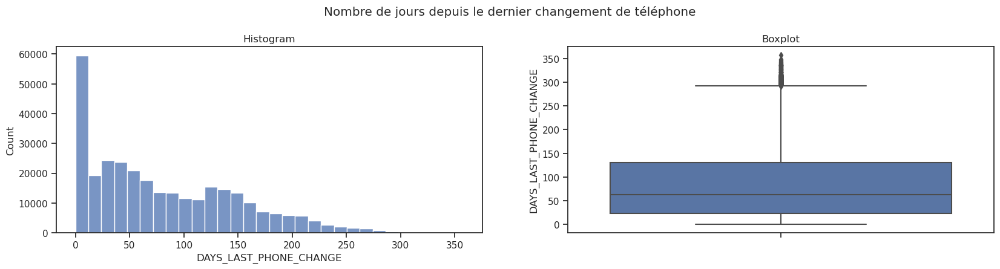

In [358]:
plot_hist(application_train,'DAYS_LAST_PHONE_CHANGE',"Nombre de jours depuis le dernier changement de téléphone")

In [86]:
# pd.qcut(application_train['DAYS_LAST_PHONE_CHANGE'], q=5).head(7)

0     (88.333, 143.333]
1        (45.5, 88.333]
2        (45.5, 88.333]
3        (45.5, 88.333]
4     (88.333, 143.333]
5    (143.333, 357.667]
6     (88.333, 143.333]
Name: DAYS_LAST_PHONE_CHANGE, dtype: category
Categories (5, interval[float64, right]): [(-0.001, 13.417] < (13.417, 45.5] < (45.5, 88.333] < (88.333, 143.333] < (143.333, 357.667]]

In [87]:
# labels = ["13 mois_et_demi", "14_a_45_mois", "46_a_88_mois", "89_a_143_mois", "144_a_358_mois"]
# application_train['periode_phone_change'] = pd.qcut(application_train['DAYS_LAST_PHONE_CHANGE'],q= 5, labels=labels)
# application_train['periode_phone_change'].unique()

['89_a_143_mois', '46_a_88_mois', '144_a_358_mois', '13 mois_et_demi', '14_a_45_mois', NaN]
Categories (5, object): ['13 mois_et_demi' < '14_a_45_mois' < '46_a_88_mois' < '89_a_143_mois' < '144_a_358_mois']

In [88]:
# # suppression de la colonneDAYS_LAST_PHONE_CHANGE:
# application_train.drop(columns = ['DAYS_LAST_PHONE_CHANGE'],axis = 1,inplace = True)
# application_train.dropna(subset = ['periode_phone_change'],inplace = True)

**DAYS_REGISTRATION**

In [359]:
application_train['DAYS_REGISTRATION'].describe()

count    307505.000000
mean      -4986.147994
std        3522.887818
min      -24672.000000
25%       -7480.000000
50%       -4504.000000
75%       -2010.000000
max           0.000000
Name: DAYS_REGISTRATION, dtype: float64

In [360]:
application_train['DAYS_REGISTRATION'] = abs(application_train['DAYS_REGISTRATION'] / 365)

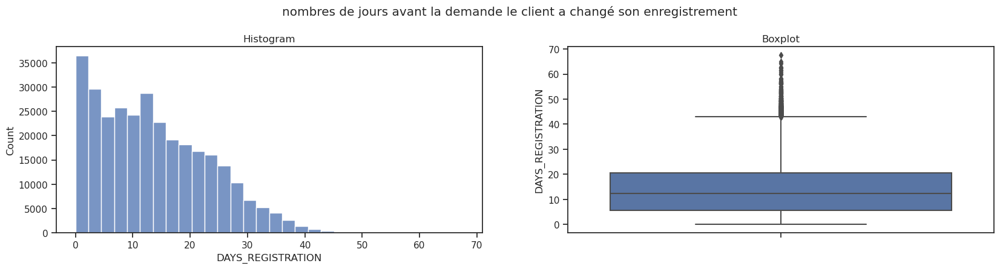

In [361]:
plot_hist(application_train,'DAYS_REGISTRATION',"nombres de jours avant la demande le client a changé son enregistrement")


In [145]:
# pd.qcut(application_train['DAYS_REGISTRATION'],q = 5).head(8)

In [92]:
# pd.qcut(application_train['DAYS_REGISTRATION'],q = 5).head(8)
# labels = ["moins_5_ans", "5_a_9_ans", "10_a_14_ans","15_a_22_ans", "23_au_plus"]
# application_train['years_REGISTRATION'] = pd.cut(application_train['DAYS_REGISTRATION'],bins = 5,  labels=labels)
# application_train['years_REGISTRATION'].unique()
# application_train.drop(columns = ['DAYS_REGISTRATION'],inplace = True,axis = 1)

**HOUR_APPR_PROCESS_START**

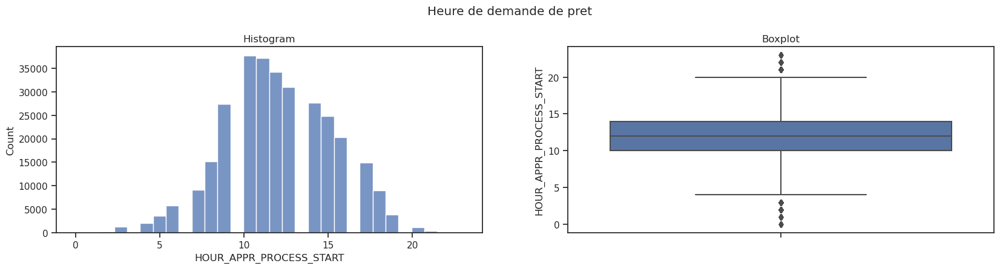

In [362]:
plot_hist(application_train,'HOUR_APPR_PROCESS_START',"Heure de demande de pret")

In [253]:
# # Définition des bin edges et des labels en fonction des fréquences
# bins = [0, 8, 16, 24]  # Plages horaires 
# labels = ['Matin', 'Après-midi', 'Soirée']
# application_train['Hour_Category'] = pd.cut(application_train['HOUR_APPR_PROCESS_START'], bins=bins, labels=labels)
# # supprimer la colonne'HOUR_APPR_PROCESS_START':
# application_train.drop(columns = ['HOUR_APPR_PROCESS_START'],inplace = True,axis = 1)

In [254]:
# application_train = application_train.dropna(subset = ['Hour_Category'])

**OBS_30_CNT_SOCIAL_CIRCLE**

In [363]:
application_train['OBS_30_CNT_SOCIAL_CIRCLE'].describe()

count    306484.000000
mean          1.422205
std           2.400937
min           0.000000
25%           0.000000
50%           0.000000
75%           2.000000
max         348.000000
Name: OBS_30_CNT_SOCIAL_CIRCLE, dtype: float64

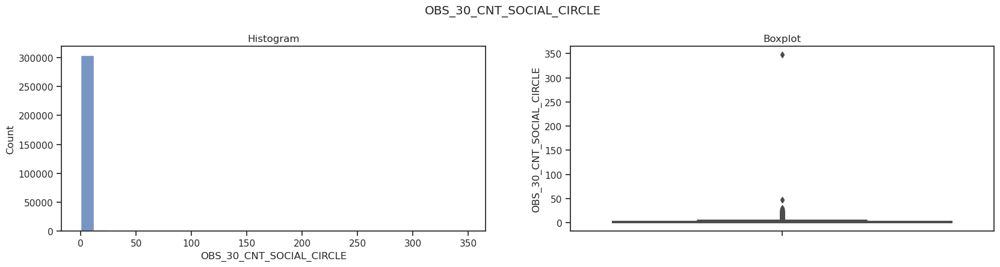

In [364]:
plot_hist(application_train,'OBS_30_CNT_SOCIAL_CIRCLE','OBS_30_CNT_SOCIAL_CIRCLE')

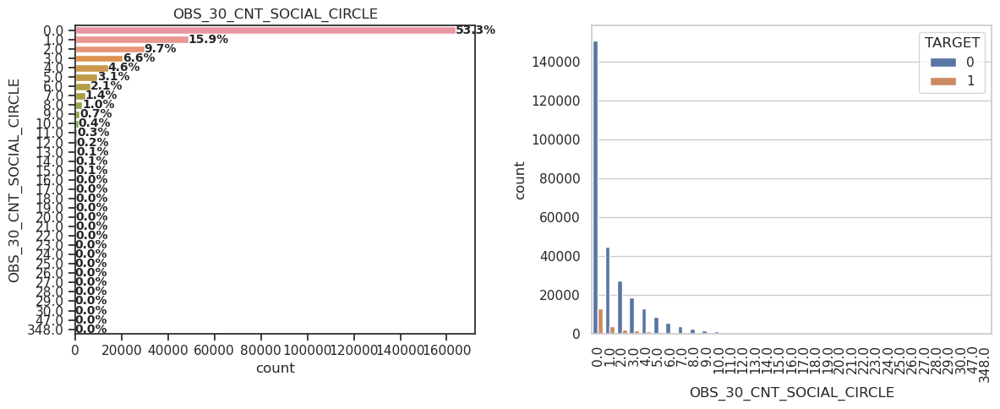

In [365]:
count_per_df(application_train, 'OBS_30_CNT_SOCIAL_CIRCLE', "OBS_30_CNT_SOCIAL_CIRCLE",(12,5))

**REGION_POPULATION_RELATIVE**

In [366]:
application_train['REGION_POPULATION_RELATIVE'].describe()

count    307505.000000
mean          0.020868
std           0.013831
min           0.000290
25%           0.010006
50%           0.018850
75%           0.028663
max           0.072508
Name: REGION_POPULATION_RELATIVE, dtype: float64

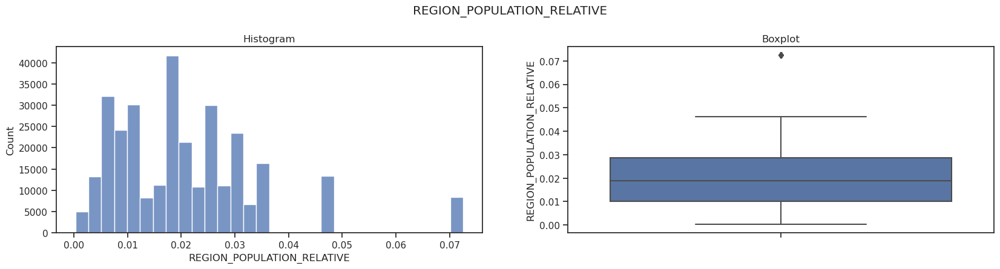

In [367]:
plot_hist(application_train,'REGION_POPULATION_RELATIVE','REGION_POPULATION_RELATIVE')

In [368]:
labels = ['F_Densité', 'M_Densité', 'H_Densité', 'Très_Haute_Densité']
quartiles = [0, 0.010006, 0.018850, 0.028663, 0.072508]
application_train['Population_Density'] = pd.cut(application_train['REGION_POPULATION_RELATIVE'], bins=quartiles, labels=labels)

In [369]:
application_train['Population_Density'].value_counts()

Population_Density
H_Densité             81970
M_Densité             79032
F_Densité             78124
Très_Haute_Densité    68379
Name: count, dtype: int64

In [370]:
# suppresion la colonne 'REGION_POPULATION_RELATIVE':
application_train.drop(columns = ['REGION_POPULATION_RELATIVE'],inplace = True,axis = 1)

**AMT_INCOME_TOTAL**

In [371]:
application_train['AMT_INCOME_TOTAL'].describe()

count    3.075050e+05
mean     1.687967e+05
std      2.371248e+05
min      2.565000e+04
25%      1.125000e+05
50%      1.471500e+05
75%      2.025000e+05
max      1.170000e+08
Name: AMT_INCOME_TOTAL, dtype: float64

/tmp/ipykernel_23963/1296765921.py:6: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


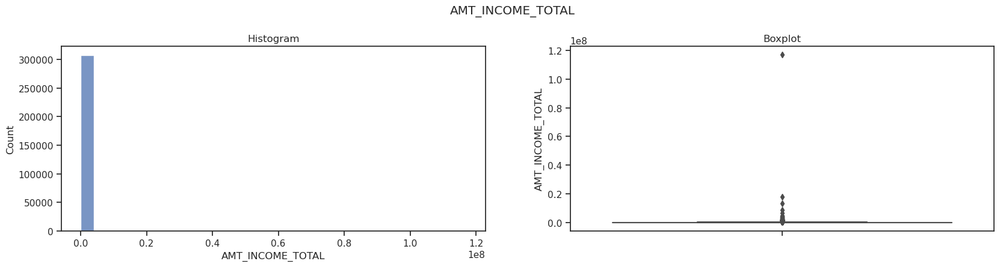

/tmp/ipykernel_23963/1296765921.py:6: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


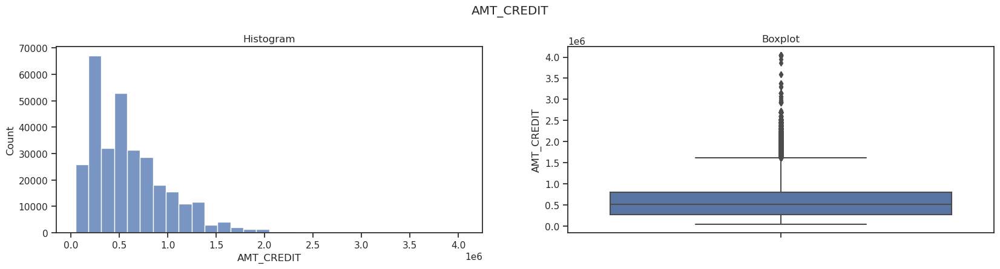

/tmp/ipykernel_23963/1296765921.py:11: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 2)


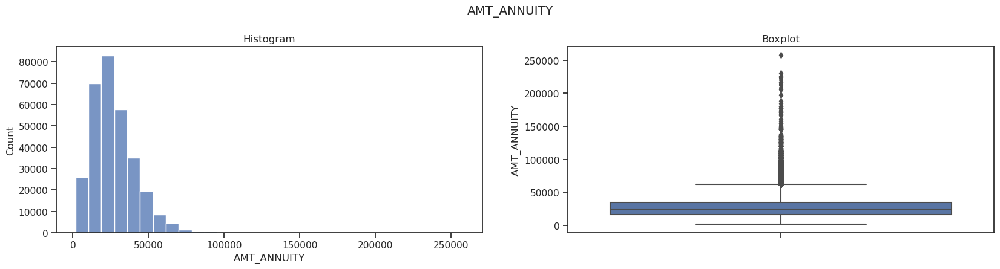

/tmp/ipykernel_23963/1296765921.py:6: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


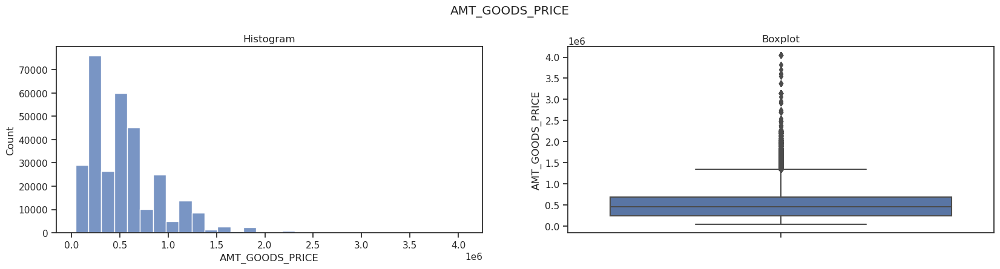

/tmp/ipykernel_23963/1296765921.py:6: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


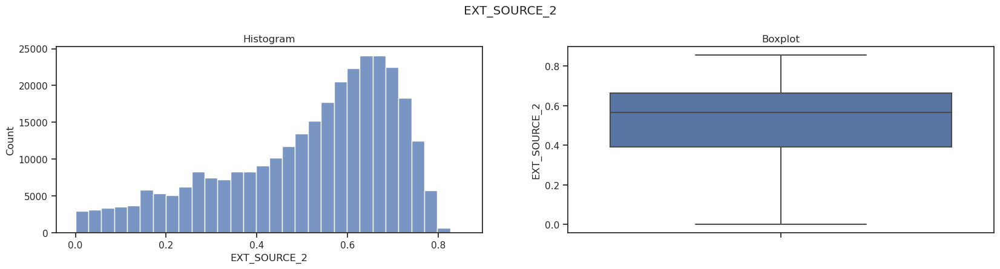

In [372]:

plt.subplot(3,2,1)
plot_hist(application_train,'AMT_INCOME_TOTAL','AMT_INCOME_TOTAL')
plt.subplot(3,3,2)
plot_hist(application_train,'AMT_CREDIT','AMT_CREDIT')
plt.subplot(3,3,3)
plot_hist(application_train,'AMT_ANNUITY','AMT_ANNUITY')
plt.subplot(3,3,4)
plot_hist(application_train,'AMT_GOODS_PRICE','AMT_GOODS_PRICE')
plt.subplot(3,3,5)
plot_hist(application_train,'EXT_SOURCE_2','EXT_SOURCE_2')


### 3-Nettoyages de données 

* Type categoriels:

* d'apres la visualisation des données , pour les données categorielles , je remplace les nan par le mode en fct de la target , d'autre faetures le modes est differents et d'autre le mode est le meme , du coup je rempalce que avec le meme mode et pour lemode differents je supprme la variable

In [373]:
application_train.drop(columns = ['WALLSMATERIAL_MODE'], axis = 1,inplace = True)

In [374]:
# je remplace les valeurs manquantes pour occupation_type par le mode:
list_nan_cat = ['NAME_TYPE_SUITE','OCCUPATION_TYPE','EMERGENCYSTATE_MODE','HOUSETYPE_MODE','FONDKAPREMONT_MODE']

application_train[list_nan_cat] = application_train[list_nan_cat].fillna(application_train[list_nan_cat].mode().iloc[0])


In [375]:
cat_columns = application_train.select_dtypes('object').columns.to_list()
application_train[cat_columns].isna().sum()

NAME_CONTRACT_TYPE             0
CODE_GENDER                    0
FLAG_OWN_CAR                   0
FLAG_OWN_REALTY                0
CNT_CHILDREN                   0
NAME_TYPE_SUITE                0
NAME_INCOME_TYPE               0
NAME_EDUCATION_TYPE            0
NAME_FAMILY_STATUS             0
NAME_HOUSING_TYPE              0
FLAG_EMP_PHONE                 0
FLAG_WORK_PHONE                0
FLAG_CONT_MOBILE               0
FLAG_PHONE                     0
FLAG_EMAIL                     0
OCCUPATION_TYPE                0
CNT_FAM_MEMBERS                0
REGION_RATING_CLIENT           0
REGION_RATING_CLIENT_W_CITY    0
WEEKDAY_APPR_PROCESS_START     0
REG_REGION_NOT_LIVE_REGION     0
REG_REGION_NOT_WORK_REGION     0
LIVE_REGION_NOT_WORK_REGION    0
REG_CITY_NOT_LIVE_CITY         0
REG_CITY_NOT_WORK_CITY         0
LIVE_CITY_NOT_WORK_CITY        0
ORGANIZATION_TYPE              0
FONDKAPREMONT_MODE             0
HOUSETYPE_MODE                 0
EMERGENCYSTATE_MODE            0
FLAG_DOCUM

**Type numeriques:**

In [376]:
# je tente a remplacer les valeurs manquantes par la moyenne:pour les valeurs avec de nanW>60
messing_rate = application_train.columns[(application_train.isna().sum() / application_train.shape[0] >0.6)]
messing_rate


Index(['OWN_CAR_AGE', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'FLOORSMIN_AVG',
       'LIVINGAPARTMENTS_AVG', 'NONLIVINGAPARTMENTS_AVG', 'YEARS_BUILD_MODE',
       'COMMONAREA_MODE', 'FLOORSMIN_MODE', 'LIVINGAPARTMENTS_MODE',
       'NONLIVINGAPARTMENTS_MODE', 'YEARS_BUILD_MEDI', 'COMMONAREA_MEDI',
       'FLOORSMIN_MEDI', 'LIVINGAPARTMENTS_MEDI', 'NONLIVINGAPARTMENTS_MEDI'],
      dtype='object')

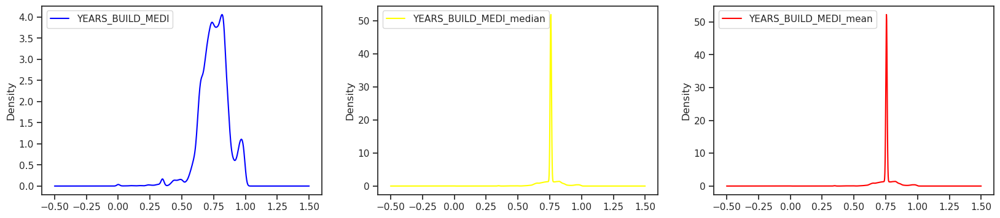

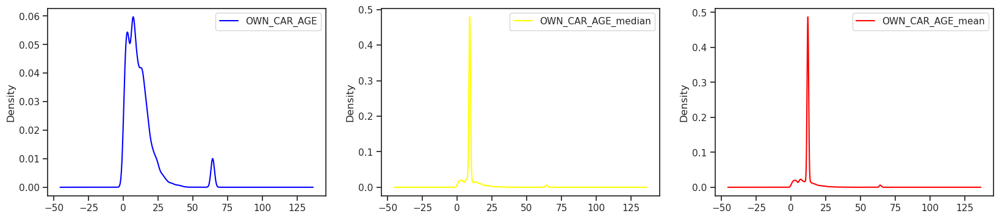

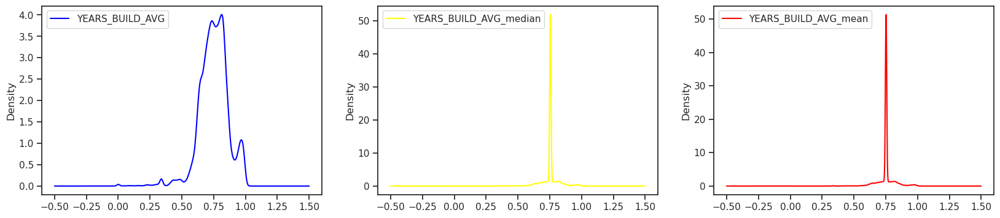

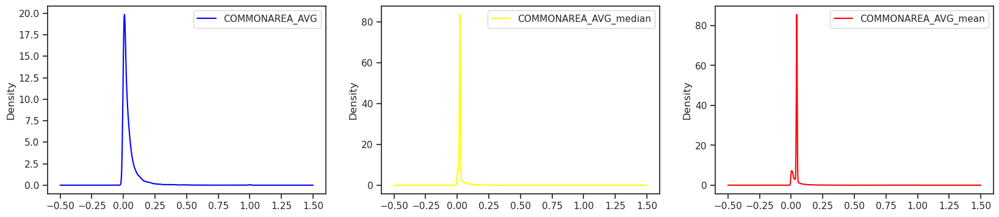

In [1024]:

# impultation par median
application_train['YEARS_BUILD_MEDI_median'] = application_train['YEARS_BUILD_MEDI'].fillna(application_train['YEARS_BUILD_MEDI'].median())
# impulation par mean
application_train['YEARS_BUILD_MEDI_mean'] = application_train['YEARS_BUILD_MEDI'].fillna(application_train['YEARS_BUILD_MEDI'].mean())

sns.set(style="ticks", rc = {'figure.figsize':(20, 4)})
# visualisation
plt.subplot(1, 3, 1)
application_train["YEARS_BUILD_MEDI"].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['YEARS_BUILD_MEDI_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['YEARS_BUILD_MEDI_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#--------------------------------------------------------
# impulation par mean
application_train['OWN_CAR_AGE_median'] = application_train['OWN_CAR_AGE'].fillna(application_train['OWN_CAR_AGE'].median())
# impulation par mean
application_train['OWN_CAR_AGE_mean'] = application_train['OWN_CAR_AGE'].fillna(application_train['OWN_CAR_AGE'].mean())

plt.subplot(1, 3, 1)
application_train['OWN_CAR_AGE'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['OWN_CAR_AGE_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['OWN_CAR_AGE_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#-------------------------------------------------------------

# impulation par mean
application_train['YEARS_BUILD_AVG_median'] = application_train['YEARS_BUILD_AVG'].fillna(application_train['YEARS_BUILD_AVG'].median())
# impulation par mean
application_train['YEARS_BUILD_AVG_mean'] = application_train['YEARS_BUILD_AVG'].fillna(application_train['YEARS_BUILD_AVG'].mean())

plt.subplot(1, 3, 1)
application_train['YEARS_BUILD_AVG'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['YEARS_BUILD_AVG_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['YEARS_BUILD_AVG_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()

#-------------------------------------------------------------------------
application_train['COMMONAREA_AVG_median'] = application_train['COMMONAREA_AVG'].fillna(application_train['COMMONAREA_AVG'].median())
# impulation par mean
application_train['COMMONAREA_AVG_mean'] = application_train['COMMONAREA_AVG'].fillna(application_train['COMMONAREA_AVG'].mean())

plt.subplot(1, 3, 1)
application_train['COMMONAREA_AVG'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['COMMONAREA_AVG_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['COMMONAREA_AVG_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()

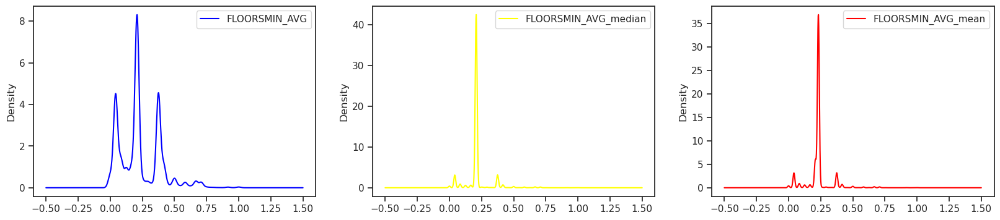

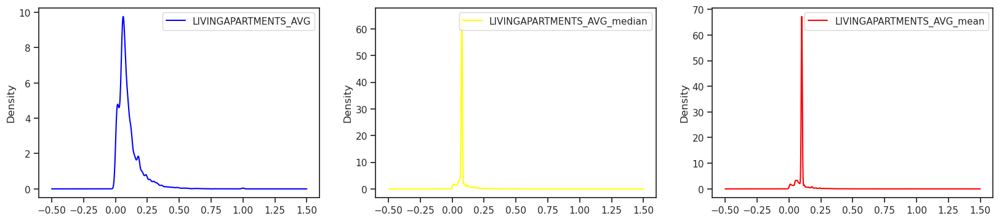

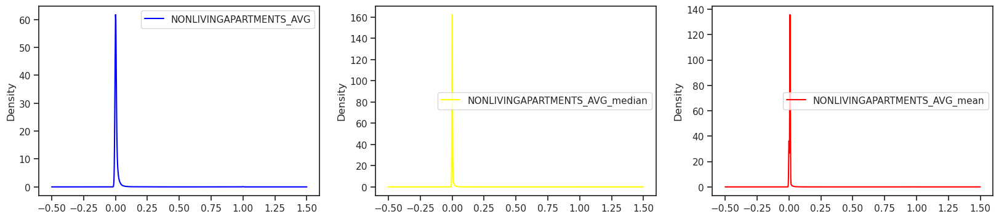

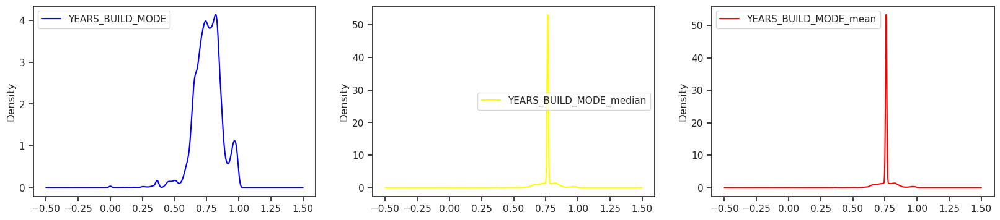

In [1025]:
# impultation par median
application_train['FLOORSMIN_AVG_median'] = application_train['FLOORSMIN_AVG'].fillna(application_train['FLOORSMIN_AVG'].median())
# impulation par mean
application_train['FLOORSMIN_AVG_mean'] = application_train['FLOORSMIN_AVG'].fillna(application_train['FLOORSMIN_AVG'].mean())

sns.set(style="ticks", rc = {'figure.figsize':(20, 4)})
# visualisation
plt.subplot(1, 3, 1)
application_train["FLOORSMIN_AVG"].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['FLOORSMIN_AVG_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['FLOORSMIN_AVG_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#--------------------------------------------------------
# impulation par mean
application_train['LIVINGAPARTMENTS_AVG_median'] = application_train['LIVINGAPARTMENTS_AVG'].fillna(application_train['LIVINGAPARTMENTS_AVG'].median())
# impulation par mean
application_train['LIVINGAPARTMENTS_AVG_mean'] = application_train['LIVINGAPARTMENTS_AVG'].fillna(application_train['LIVINGAPARTMENTS_AVG'].mean())

plt.subplot(1, 3, 1)
application_train['LIVINGAPARTMENTS_AVG'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['LIVINGAPARTMENTS_AVG_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['LIVINGAPARTMENTS_AVG_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#-------------------------------------------------------------

# impulation par mean
application_train['NONLIVINGAPARTMENTS_AVG_median'] = application_train['NONLIVINGAPARTMENTS_AVG'].fillna(application_train['NONLIVINGAPARTMENTS_AVG'].median())
# impulation par mean
application_train['NONLIVINGAPARTMENTS_AVG_mean'] = application_train['NONLIVINGAPARTMENTS_AVG'].fillna(application_train['NONLIVINGAPARTMENTS_AVG'].mean())

plt.subplot(1, 3, 1)
application_train['NONLIVINGAPARTMENTS_AVG'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['NONLIVINGAPARTMENTS_AVG_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['NONLIVINGAPARTMENTS_AVG_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()

#-------------------------------------------------------------------------
application_train['YEARS_BUILD_MODE_median'] = application_train['YEARS_BUILD_MODE'].fillna(application_train['YEARS_BUILD_MODE'].median())
# impulation par mean
application_train['YEARS_BUILD_MODE_mean'] = application_train['YEARS_BUILD_MODE'].fillna(application_train['YEARS_BUILD_MODE'].mean())

plt.subplot(1, 3, 1)
application_train['YEARS_BUILD_MODE'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['YEARS_BUILD_MODE_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['YEARS_BUILD_MODE_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()

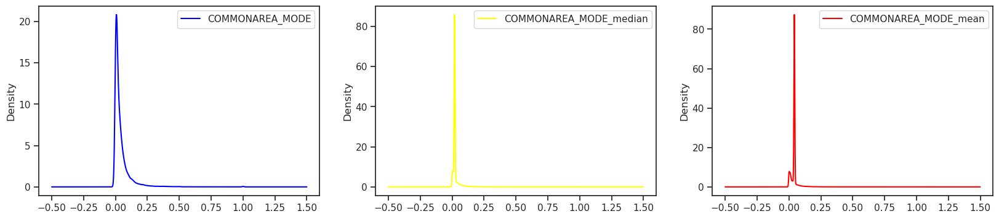

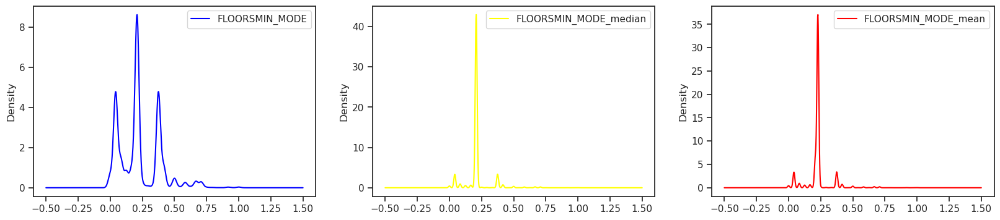

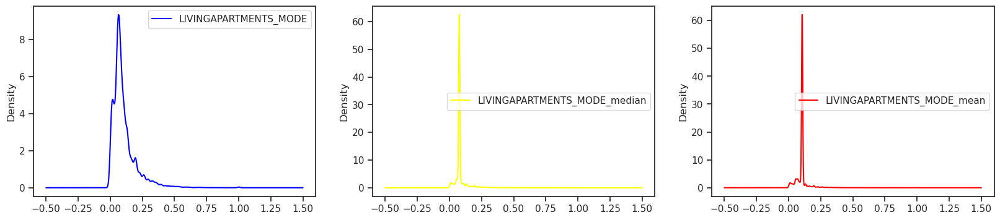

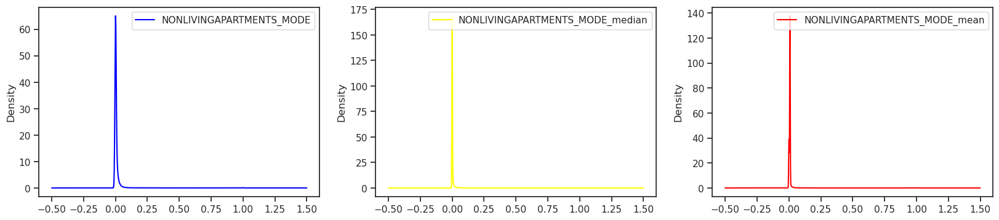

In [737]:
# impultation par median
application_train['COMMONAREA_MODE_median'] = application_train['COMMONAREA_MODE'].fillna(application_train['COMMONAREA_MODE'].median())
# impulation par mean
application_train['COMMONAREA_MODE_mean'] = application_train['COMMONAREA_MODE'].fillna(application_train['COMMONAREA_MODE'].mean())

sns.set(style="ticks", rc = {'figure.figsize':(20, 4)})
# visualisation
plt.subplot(1, 3, 1)
application_train["COMMONAREA_MODE"].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['COMMONAREA_MODE_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['COMMONAREA_MODE_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#--------------------------------------------------------
# impulation par mean
application_train['FLOORSMIN_MODE_median'] = application_train['FLOORSMIN_MODE'].fillna(application_train['FLOORSMIN_MODE'].median())
# impulation par mean
application_train['FLOORSMIN_MODE_mean'] = application_train['FLOORSMIN_MODE'].fillna(application_train['FLOORSMIN_MODE'].mean())

plt.subplot(1, 3, 1)
application_train['FLOORSMIN_MODE'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['FLOORSMIN_MODE_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['FLOORSMIN_MODE_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#-------------------------------------------------------------

# impulation par mean
application_train['LIVINGAPARTMENTS_MODE_median'] = application_train['LIVINGAPARTMENTS_MODE'].fillna(application_train['LIVINGAPARTMENTS_MODE'].median())
# impulation par mean
application_train['LIVINGAPARTMENTS_MODE_mean'] = application_train['LIVINGAPARTMENTS_MODE'].fillna(application_train['LIVINGAPARTMENTS_MODE'].mean())

plt.subplot(1, 3, 1)
application_train['LIVINGAPARTMENTS_MODE'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['LIVINGAPARTMENTS_MODE_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['LIVINGAPARTMENTS_MODE_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#-------------------------------------------------------------------------
application_train['NONLIVINGAPARTMENTS_MODE_median'] = application_train['NONLIVINGAPARTMENTS_MODE'].fillna(application_train['NONLIVINGAPARTMENTS_MODE'].median())
# impulation par mean
application_train['NONLIVINGAPARTMENTS_MODE_mean'] = application_train['NONLIVINGAPARTMENTS_MODE'].fillna(application_train['NONLIVINGAPARTMENTS_MODE'].mean())

plt.subplot(1, 3, 1)
application_train['NONLIVINGAPARTMENTS_MODE'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['NONLIVINGAPARTMENTS_MODE_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['NONLIVINGAPARTMENTS_MODE_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()

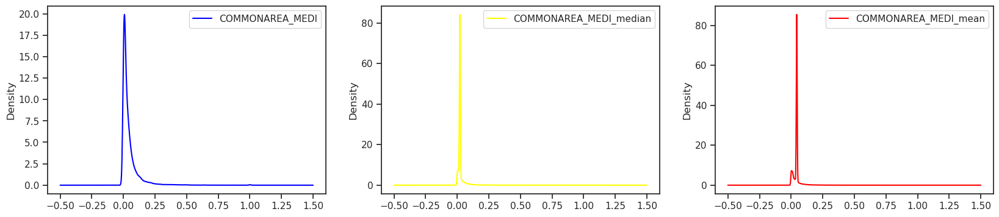

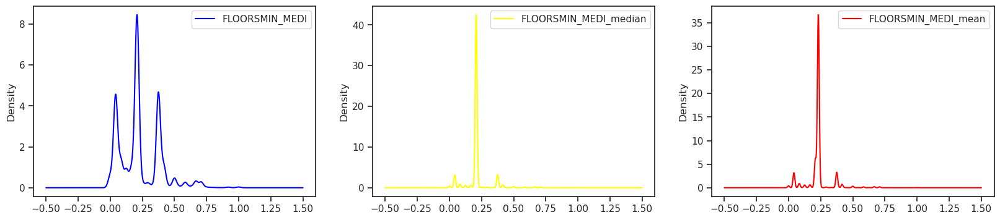

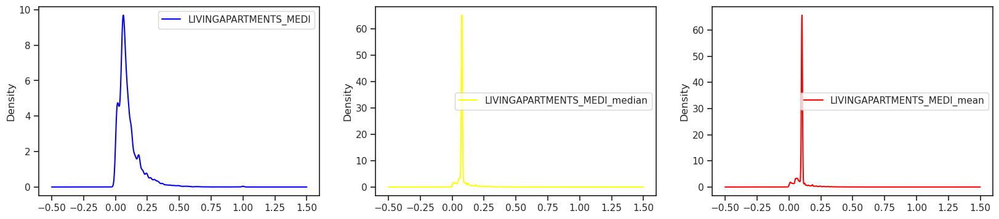

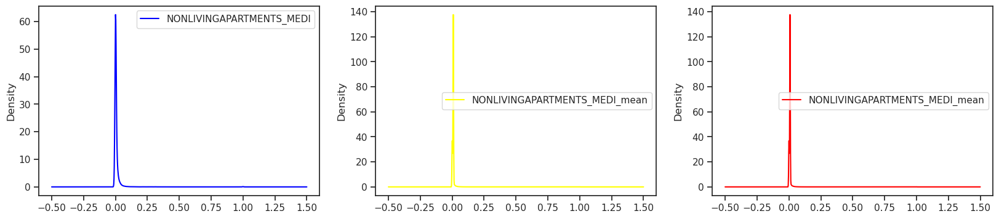

In [738]:
# impultation par median
application_train['COMMONAREA_MEDI_median'] = application_train['COMMONAREA_MEDI'].fillna(application_train['COMMONAREA_MEDI'].median())
# impulation par mean
application_train['COMMONAREA_MEDI_mean'] = application_train['COMMONAREA_MEDI'].fillna(application_train['COMMONAREA_MEDI'].mean())

sns.set(style="ticks", rc = {'figure.figsize':(20, 4)})
# visualisation
plt.subplot(1, 3, 1)
application_train["COMMONAREA_MEDI"].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['COMMONAREA_MEDI_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['COMMONAREA_MEDI_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#--------------------------------------------------------
# impulation par mean
application_train['FLOORSMIN_MEDI_median'] = application_train['FLOORSMIN_MEDI'].fillna(application_train['FLOORSMIN_MEDI'].median())
# impulation par mean
application_train['FLOORSMIN_MEDI_mean'] = application_train['FLOORSMIN_MEDI'].fillna(application_train['FLOORSMIN_MEDI'].mean())

plt.subplot(1, 3, 1)
application_train['FLOORSMIN_MEDI'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['FLOORSMIN_MEDI_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['FLOORSMIN_MEDI_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#-------------------------------------------------------------

# impulation par mean
application_train['LIVINGAPARTMENTS_MEDI_median'] = application_train['LIVINGAPARTMENTS_MEDI'].fillna(application_train['LIVINGAPARTMENTS_MEDI'].median())
# impulation par mean
application_train['LIVINGAPARTMENTS_MEDI_mean'] = application_train['LIVINGAPARTMENTS_MEDI'].fillna(application_train['LIVINGAPARTMENTS_MEDI'].mean())

plt.subplot(1, 3, 1)
application_train['LIVINGAPARTMENTS_MEDI'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['LIVINGAPARTMENTS_MEDI_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['LIVINGAPARTMENTS_MEDI_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()

#-------------------------------------------------------------------------
application_train['NONLIVINGAPARTMENTS_MEDI_median'] = application_train['NONLIVINGAPARTMENTS_MEDI'].fillna(application_train['NONLIVINGAPARTMENTS_MEDI'].median())
# impulation par mean
application_train['NONLIVINGAPARTMENTS_MEDI_mean'] = application_train['NONLIVINGAPARTMENTS_MEDI'].fillna(application_train['NONLIVINGAPARTMENTS_MEDI'].mean())

plt.subplot(1, 3, 1)
application_train['NONLIVINGAPARTMENTS_MEDI'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['NONLIVINGAPARTMENTS_MEDI_mean'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['NONLIVINGAPARTMENTS_MEDI_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()

In [377]:
# je tente a remplacer les valeurs manquantes par la moyenne:pour les valeurs avec de nan>60
messing_rate = application_train.columns[(application_train.isna().sum() / application_train.shape[0] >0.4)&(application_train.isna().sum() / application_train.shape[0] <0.6)]
messing_rate

Index(['EXT_SOURCE_1', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG',
       'YEARS_BEGINEXPLUATATION_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG',
       'FLOORSMAX_AVG', 'LANDAREA_AVG', 'LIVINGAREA_AVG', 'NONLIVINGAREA_AVG',
       'APARTMENTS_MODE', 'BASEMENTAREA_MODE', 'YEARS_BEGINEXPLUATATION_MODE',
       'ELEVATORS_MODE', 'ENTRANCES_MODE', 'FLOORSMAX_MODE', 'LANDAREA_MODE',
       'LIVINGAREA_MODE', 'NONLIVINGAREA_MODE', 'APARTMENTS_MEDI',
       'BASEMENTAREA_MEDI', 'YEARS_BEGINEXPLUATATION_MEDI', 'ELEVATORS_MEDI',
       'ENTRANCES_MEDI', 'FLOORSMAX_MEDI', 'LANDAREA_MEDI', 'LIVINGAREA_MEDI',
       'NONLIVINGAREA_MEDI', 'TOTALAREA_MODE'],
      dtype='object')

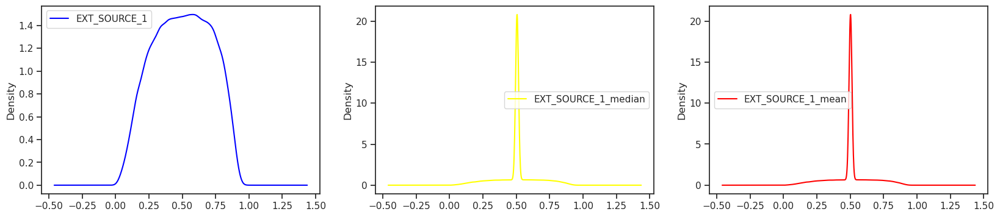

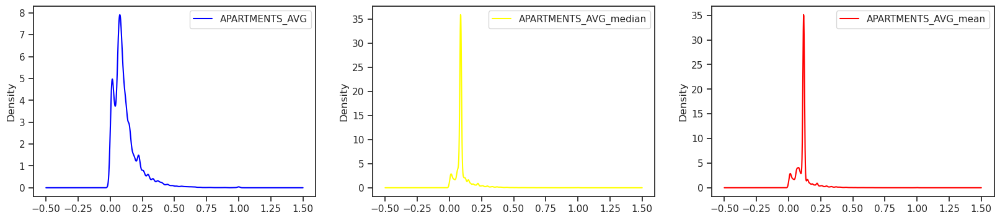

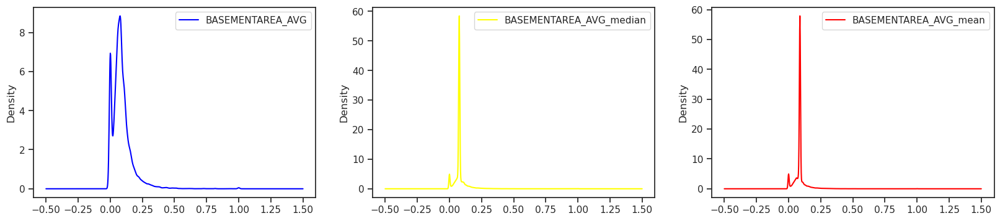

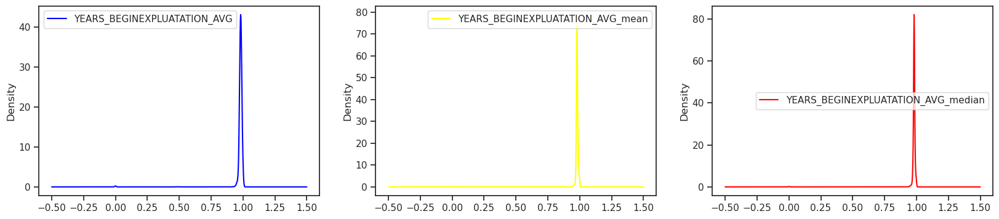

In [740]:
# impultation par median
application_train['EXT_SOURCE_1_median'] = application_train['EXT_SOURCE_1'].fillna(application_train['EXT_SOURCE_1'].median())
# impulation par mean
application_train['EXT_SOURCE_1_mean'] = application_train['EXT_SOURCE_1'].fillna(application_train['EXT_SOURCE_1'].mean())

sns.set(style="ticks", rc = {'figure.figsize':(20, 4)})
# visualisation
plt.subplot(1, 3, 1)
application_train["EXT_SOURCE_1"].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['EXT_SOURCE_1_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['EXT_SOURCE_1_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#--------------------------------------------------------
# impulation par mean
application_train['APARTMENTS_AVG_median'] = application_train['APARTMENTS_AVG'].fillna(application_train['APARTMENTS_AVG'].median())
# impulation par mean
application_train['APARTMENTS_AVG_mean'] = application_train['APARTMENTS_AVG'].fillna(application_train['APARTMENTS_AVG'].mean())

plt.subplot(1, 3, 1)
application_train['APARTMENTS_AVG'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['APARTMENTS_AVG_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['APARTMENTS_AVG_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#-------------------------------------------------------------

# impulation par mean
application_train['BASEMENTAREA_AVG_median'] = application_train['BASEMENTAREA_AVG'].fillna(application_train['BASEMENTAREA_AVG'].median())
# impulation par mean
application_train['BASEMENTAREA_AVG_mean'] = application_train['BASEMENTAREA_AVG'].fillna(application_train['BASEMENTAREA_AVG'].mean())

plt.subplot(1, 3, 1)
application_train['BASEMENTAREA_AVG'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['BASEMENTAREA_AVG_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['BASEMENTAREA_AVG_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()

#-------------------------------------------------------------------------
application_train['YEARS_BEGINEXPLUATATION_AVG_median'] = application_train['YEARS_BEGINEXPLUATATION_AVG'].fillna(application_train['YEARS_BEGINEXPLUATATION_AVG'].median())
# impulation par mean
application_train['YEARS_BEGINEXPLUATATION_AVG_mean'] = application_train['YEARS_BEGINEXPLUATATION_AVG'].fillna(application_train['YEARS_BEGINEXPLUATATION_AVG'].mean())

plt.subplot(1, 3, 1)
application_train['YEARS_BEGINEXPLUATATION_AVG'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['YEARS_BEGINEXPLUATATION_AVG_mean'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['YEARS_BEGINEXPLUATATION_AVG_median'].plot(kind='kde',color='red')
plt.legend()
plt.show()

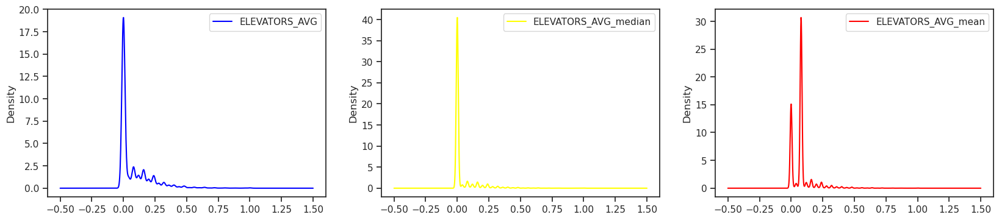

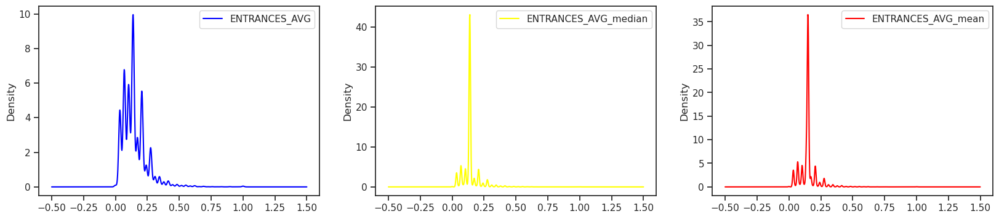

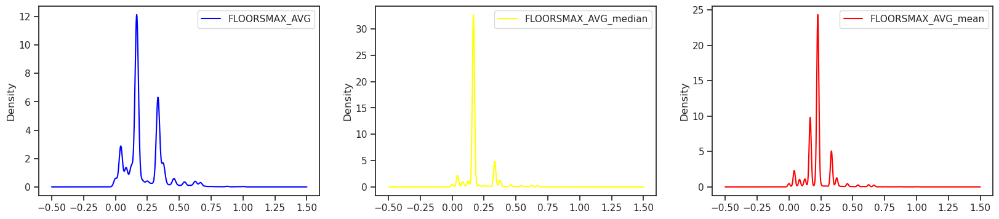

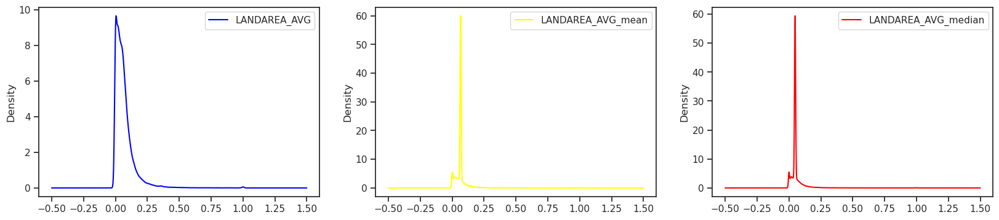

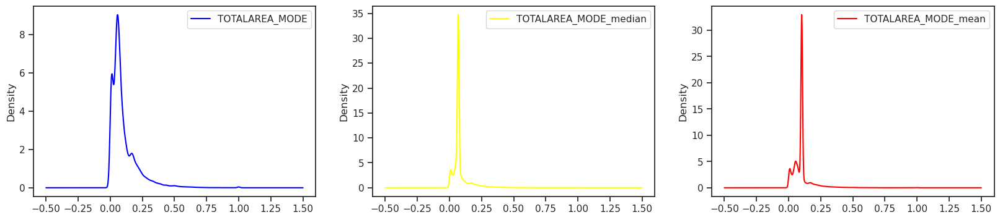

In [741]:
# impultation par median
application_train['ELEVATORS_AVG_median'] = application_train['ELEVATORS_AVG'].fillna(application_train['ELEVATORS_AVG'].median())
# impulation par mean
application_train['ELEVATORS_AVG_mean'] = application_train['ELEVATORS_AVG'].fillna(application_train['ELEVATORS_AVG'].mean())

sns.set(style="ticks", rc = {'figure.figsize':(20, 4)})
# visualisation
plt.subplot(1, 3, 1)
application_train["ELEVATORS_AVG"].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['ELEVATORS_AVG_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['ELEVATORS_AVG_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#--------------------------------------------------------
# impulation par mean
application_train['ENTRANCES_AVG_median'] = application_train['ENTRANCES_AVG'].fillna(application_train['ENTRANCES_AVG'].median())
# impulation par mean
application_train['ENTRANCES_AVG_mean'] = application_train['ENTRANCES_AVG'].fillna(application_train['ENTRANCES_AVG'].mean())

plt.subplot(1, 3, 1)
application_train['ENTRANCES_AVG'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['ENTRANCES_AVG_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['ENTRANCES_AVG_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#-------------------------------------------------------------

# impulation par mean
application_train['FLOORSMAX_AVG_median'] = application_train['FLOORSMAX_AVG'].fillna(application_train['FLOORSMAX_AVG'].median())
# impulation par mean
application_train['FLOORSMAX_AVG_mean'] = application_train['FLOORSMAX_AVG'].fillna(application_train['FLOORSMAX_AVG'].mean())

plt.subplot(1, 3, 1)
application_train['FLOORSMAX_AVG'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['FLOORSMAX_AVG_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['FLOORSMAX_AVG_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()

#-------------------------------------------------------------------------
application_train['LANDAREA_AVG_median'] = application_train['LANDAREA_AVG'].fillna(application_train['LANDAREA_AVG'].median())
# impulation par mean
application_train['LANDAREA_AVG_mean'] = application_train['LANDAREA_AVG'].fillna(application_train['LANDAREA_AVG'].mean())

plt.subplot(1, 3, 1)
application_train['LANDAREA_AVG'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['LANDAREA_AVG_mean'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['LANDAREA_AVG_median'].plot(kind='kde',color='red')
plt.legend()
plt.show()

#--------------------------------------------------
# impultation par median
application_train['TOTALAREA_MODE_median'] = application_train['TOTALAREA_MODE'].fillna(application_train['TOTALAREA_MODE'].median())
# impulation par mean
application_train['TOTALAREA_MODE_mean'] = application_train['TOTALAREA_MODE'].fillna(application_train['TOTALAREA_MODE'].mean())

sns.set(style="ticks", rc = {'figure.figsize':(20, 4)})
# visualisation
plt.subplot(1, 3, 1)
application_train["TOTALAREA_MODE"].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['TOTALAREA_MODE_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['TOTALAREA_MODE_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()


In [378]:
# je supprime les colonne avec un sieul>0.4 de valeurs manquantes:
col_to_drop = application_train.columns[(application_train.isna().sum() / application_train.shape[0] >0.4)]
application_train.drop(columns = col_to_drop,axis = 1, inplace = True)
# je supprime egalement les colonne apres l'essaies de l'impultation par mean et mediane:
columns_to_remove = [col for col in application_train.columns if col.endswith('_mean') or col.endswith('_median')]
application_train = application_train.drop(columns=columns_to_remove, axis=1)

In [379]:
messing_val = application_train.columns[(application_train.isna().sum() / application_train.shape[0] >0)]
len(messing_val)

15

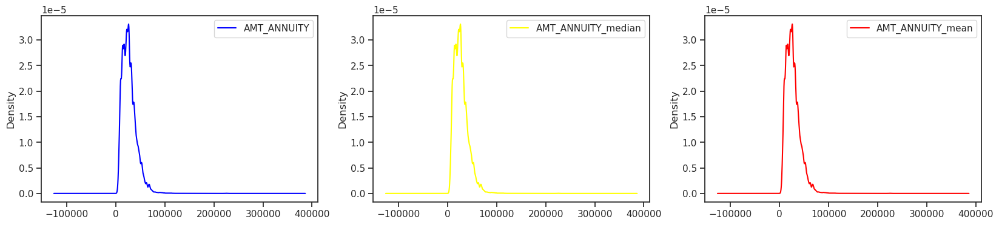

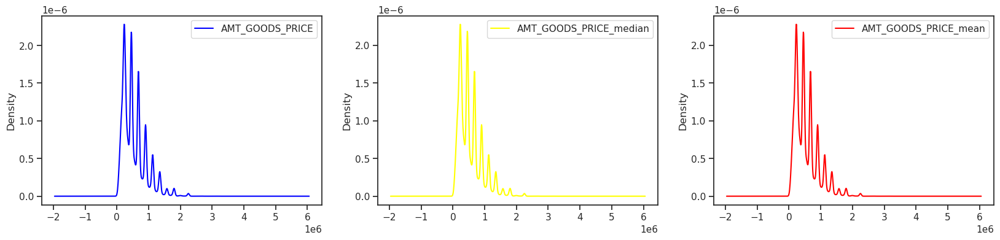

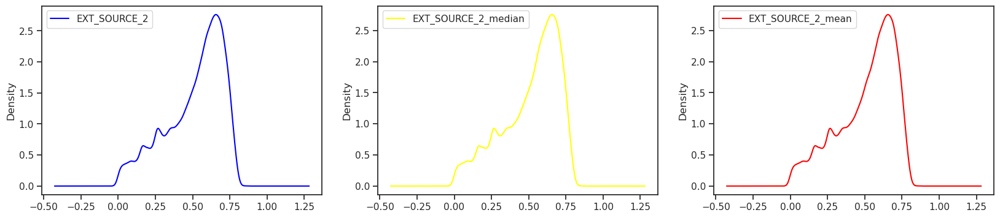

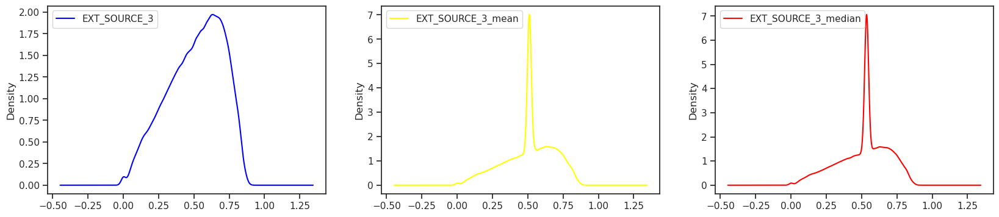

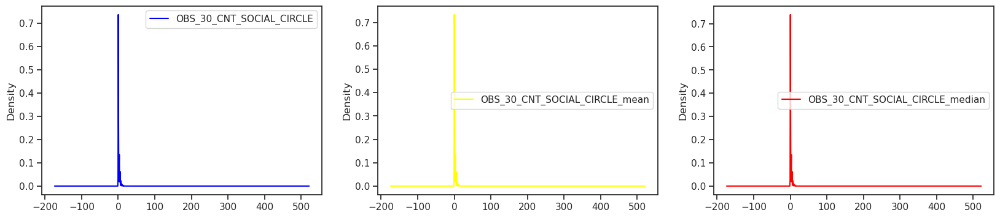

...

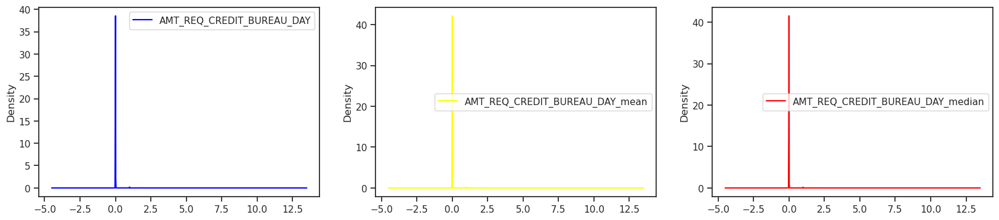

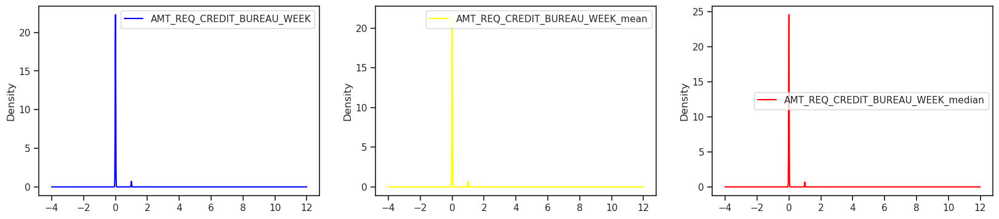

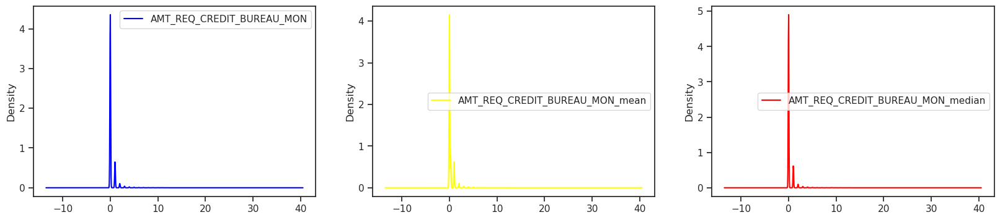

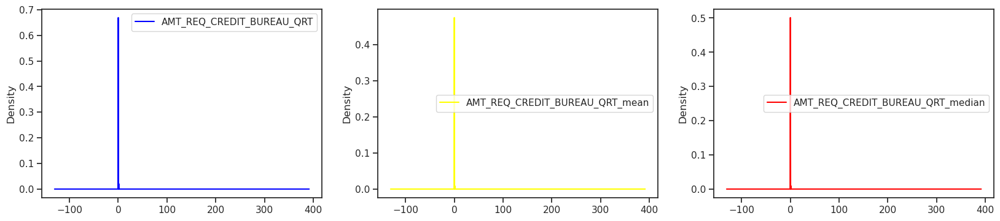

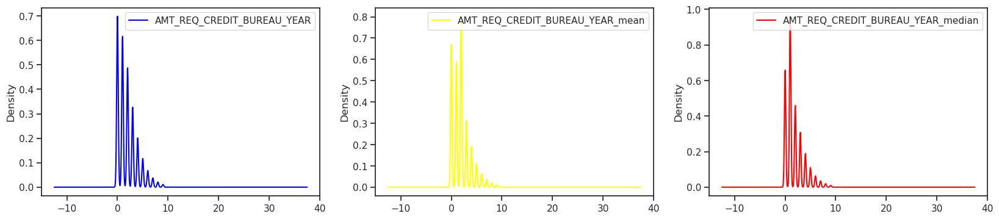

In [744]:
# impultation par median
application_train['AMT_ANNUITY_median'] = application_train['AMT_ANNUITY'].fillna(application_train['AMT_ANNUITY'].median())
# impulation par mean
application_train['AMT_ANNUITY_mean'] = application_train['AMT_ANNUITY'].fillna(application_train['AMT_ANNUITY'].mean())

sns.set(style="ticks", rc = {'figure.figsize':(20, 4)})
# visualisation
plt.subplot(1, 3, 1)
application_train["AMT_ANNUITY"].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['AMT_ANNUITY_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['AMT_ANNUITY_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#--------------------------------------------------------
# impulation par mean
application_train['AMT_GOODS_PRICE_median'] = application_train['AMT_GOODS_PRICE'].fillna(application_train['AMT_GOODS_PRICE'].median())
# impulation par mean
application_train['AMT_GOODS_PRICE_mean'] = application_train['AMT_GOODS_PRICE'].fillna(application_train['AMT_GOODS_PRICE'].mean())

plt.subplot(1, 3, 1)
application_train['AMT_GOODS_PRICE'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['AMT_GOODS_PRICE_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['AMT_GOODS_PRICE_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#-------------------------------------------------------------

# impulation par mean
application_train['EXT_SOURCE_2_median'] = application_train['EXT_SOURCE_2'].fillna(application_train['EXT_SOURCE_2'].median())
# impulation par mean
application_train['EXT_SOURCE_2_mean'] = application_train['EXT_SOURCE_2'].fillna(application_train['EXT_SOURCE_2'].mean())

plt.subplot(1, 3, 1)
application_train['EXT_SOURCE_2'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['EXT_SOURCE_2_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['EXT_SOURCE_2_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()

#-------------------------------------------------------------------------
application_train['EXT_SOURCE_3_median'] = application_train['EXT_SOURCE_3'].fillna(application_train['EXT_SOURCE_3'].median())
# impulation par mean
application_train['EXT_SOURCE_3_mean'] = application_train['EXT_SOURCE_3'].fillna(application_train['EXT_SOURCE_3'].mean())

plt.subplot(1, 3, 1)
application_train['EXT_SOURCE_3'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['EXT_SOURCE_3_mean'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['EXT_SOURCE_3_median'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#---------------------------------------------------------------------------------
application_train['OBS_30_CNT_SOCIAL_CIRCLE_median'] = application_train['OBS_30_CNT_SOCIAL_CIRCLE'].fillna(application_train['OBS_30_CNT_SOCIAL_CIRCLE'].median())
# impulation par mean
application_train['OBS_30_CNT_SOCIAL_CIRCLE_mean'] = application_train['OBS_30_CNT_SOCIAL_CIRCLE'].fillna(application_train['OBS_30_CNT_SOCIAL_CIRCLE'].mean())

plt.subplot(1, 3, 1)
application_train['OBS_30_CNT_SOCIAL_CIRCLE'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['OBS_30_CNT_SOCIAL_CIRCLE_mean'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['OBS_30_CNT_SOCIAL_CIRCLE_median'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#-----------------------------------------------------------------
application_train['DEF_30_CNT_SOCIAL_CIRCLE_median'] = application_train['DEF_30_CNT_SOCIAL_CIRCLE'].fillna(application_train['DEF_30_CNT_SOCIAL_CIRCLE'].median())
# impulation par mean
application_train['DEF_30_CNT_SOCIAL_CIRCLE_mean'] = application_train['DEF_30_CNT_SOCIAL_CIRCLE'].fillna(application_train['DEF_30_CNT_SOCIAL_CIRCLE'].mean())

plt.subplot(1, 3, 1)
application_train['DEF_30_CNT_SOCIAL_CIRCLE'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['DEF_30_CNT_SOCIAL_CIRCLE_mean'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['DEF_30_CNT_SOCIAL_CIRCLE_median'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#--------------------------------------------------------
application_train['OBS_60_CNT_SOCIAL_CIRCLE_median'] = application_train['OBS_60_CNT_SOCIAL_CIRCLE'].fillna(application_train['OBS_60_CNT_SOCIAL_CIRCLE'].median())
# impulation par mean
application_train['OBS_60_CNT_SOCIAL_CIRCLE_mean'] = application_train['OBS_60_CNT_SOCIAL_CIRCLE'].fillna(application_train['OBS_60_CNT_SOCIAL_CIRCLE'].mean())

plt.subplot(1, 3, 1)
application_train['OBS_60_CNT_SOCIAL_CIRCLE'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['OBS_60_CNT_SOCIAL_CIRCLE_mean'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['OBS_60_CNT_SOCIAL_CIRCLE_median'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#----------------------------------------------------------------
application_train['AMT_REQ_CREDIT_BUREAU_HOUR_median'] = application_train['AMT_REQ_CREDIT_BUREAU_HOUR'].fillna(application_train['AMT_REQ_CREDIT_BUREAU_HOUR'].median())
# impulation par mean
application_train['AMT_REQ_CREDIT_BUREAU_HOUR_mean'] = application_train['AMT_REQ_CREDIT_BUREAU_HOUR'].fillna(application_train['AMT_REQ_CREDIT_BUREAU_HOUR'].mean())

plt.subplot(1, 3, 1)
application_train['AMT_REQ_CREDIT_BUREAU_HOUR'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['AMT_REQ_CREDIT_BUREAU_HOUR_mean'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['AMT_REQ_CREDIT_BUREAU_HOUR_median'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#-------------------------------------------------------
application_train['DEF_60_CNT_SOCIAL_CIRCLE_median'] = application_train['DEF_60_CNT_SOCIAL_CIRCLE'].fillna(application_train['DEF_60_CNT_SOCIAL_CIRCLE'].median())
# impulation par mean
application_train['DEF_60_CNT_SOCIAL_CIRCLE_mean'] = application_train['DEF_60_CNT_SOCIAL_CIRCLE'].fillna(application_train['DEF_60_CNT_SOCIAL_CIRCLE'].mean())

plt.subplot(1, 3, 1)
application_train['DEF_60_CNT_SOCIAL_CIRCLE'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['DEF_60_CNT_SOCIAL_CIRCLE_mean'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['DEF_60_CNT_SOCIAL_CIRCLE_median'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#----------------------------------------------------------------
application_train['AMT_REQ_CREDIT_BUREAU_DAY_median'] = application_train['AMT_REQ_CREDIT_BUREAU_DAY'].fillna(application_train['AMT_REQ_CREDIT_BUREAU_DAY'].median())
# impulation par mean
application_train['AMT_REQ_CREDIT_BUREAU_DAY_mean'] = application_train['AMT_REQ_CREDIT_BUREAU_DAY'].fillna(application_train['AMT_REQ_CREDIT_BUREAU_DAY'].mean())

plt.subplot(1, 3, 1)
application_train['AMT_REQ_CREDIT_BUREAU_DAY'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['AMT_REQ_CREDIT_BUREAU_DAY_mean'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['AMT_REQ_CREDIT_BUREAU_DAY_median'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#---------------------------------------------------------------------------
application_train['AMT_REQ_CREDIT_BUREAU_WEEK_median'] = application_train['AMT_REQ_CREDIT_BUREAU_WEEK'].fillna(application_train['AMT_REQ_CREDIT_BUREAU_WEEK'].median())
# impulation par mean
application_train['AMT_REQ_CREDIT_BUREAU_WEEK_mean'] = application_train['AMT_REQ_CREDIT_BUREAU_WEEK'].fillna(application_train['AMT_REQ_CREDIT_BUREAU_WEEK'].mean())

plt.subplot(1, 3, 1)
application_train['AMT_REQ_CREDIT_BUREAU_WEEK'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['AMT_REQ_CREDIT_BUREAU_WEEK_mean'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['AMT_REQ_CREDIT_BUREAU_WEEK_median'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#---------------------------------------------------------------------------
application_train['AMT_REQ_CREDIT_BUREAU_MON_median'] = application_train['AMT_REQ_CREDIT_BUREAU_MON'].fillna(application_train['AMT_REQ_CREDIT_BUREAU_MON'].median())
# impulation par mean
application_train['AMT_REQ_CREDIT_BUREAU_MON_mean'] = application_train['AMT_REQ_CREDIT_BUREAU_MON'].fillna(application_train['AMT_REQ_CREDIT_BUREAU_MON'].mean())

plt.subplot(1, 3, 1)
application_train['AMT_REQ_CREDIT_BUREAU_MON'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['AMT_REQ_CREDIT_BUREAU_MON_mean'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['AMT_REQ_CREDIT_BUREAU_MON_median'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#------------------------------------------------
application_train['AMT_REQ_CREDIT_BUREAU_QRT_median'] = application_train['AMT_REQ_CREDIT_BUREAU_QRT'].fillna(application_train['AMT_REQ_CREDIT_BUREAU_QRT'].median())
# impulation par mean
application_train['AMT_REQ_CREDIT_BUREAU_QRT_mean'] = application_train['AMT_REQ_CREDIT_BUREAU_QRT'].fillna(application_train['AMT_REQ_CREDIT_BUREAU_QRT'].mean())

plt.subplot(1, 3, 1)
application_train['AMT_REQ_CREDIT_BUREAU_QRT'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['AMT_REQ_CREDIT_BUREAU_QRT_mean'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['AMT_REQ_CREDIT_BUREAU_QRT_median'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#-------------------------------------------------
application_train['AMT_REQ_CREDIT_BUREAU_YEAR_median'] = application_train['AMT_REQ_CREDIT_BUREAU_YEAR'].fillna(application_train['AMT_REQ_CREDIT_BUREAU_YEAR'].median())
# impulation par mean
application_train['AMT_REQ_CREDIT_BUREAU_YEAR_mean'] = application_train['AMT_REQ_CREDIT_BUREAU_YEAR'].fillna(application_train['AMT_REQ_CREDIT_BUREAU_YEAR'].mean())

plt.subplot(1, 3, 1)
application_train['AMT_REQ_CREDIT_BUREAU_YEAR'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_train['AMT_REQ_CREDIT_BUREAU_YEAR_mean'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_train['AMT_REQ_CREDIT_BUREAU_YEAR_median'].plot(kind='kde',color='red')
plt.legend()
plt.show()

* Impultation des données manquantes avec le seuil< 0.4

In [380]:
columns = ['EXT_SOURCE_3','AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY',
                     'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON','AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR']
                     
# pour les autre features dans la liste col je vais supprimer les lignes vide vu que l'ipultation par la mediane est imposible:
application_train = application_train.dropna(subset = columns)

list_col = ['AMT_ANNUITY','AMT_GOODS_PRICE','EXT_SOURCE_2','OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
                                   'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE']

# je fais l'impultation pour les colonne de la liste col_to_impute:
application_train[list_col] = application_train[list_col].fillna(application_train[list_col].median())



In [381]:
# Suppression des colonne apres l'essaie de l'impultation
columns_to_remove = [col for col in application_train.columns if col.endswith('_mean') or col.endswith('_median')]
application_train = application_train.drop(columns=columns_to_remove, axis=1)

### 4-Analyse multivariée:

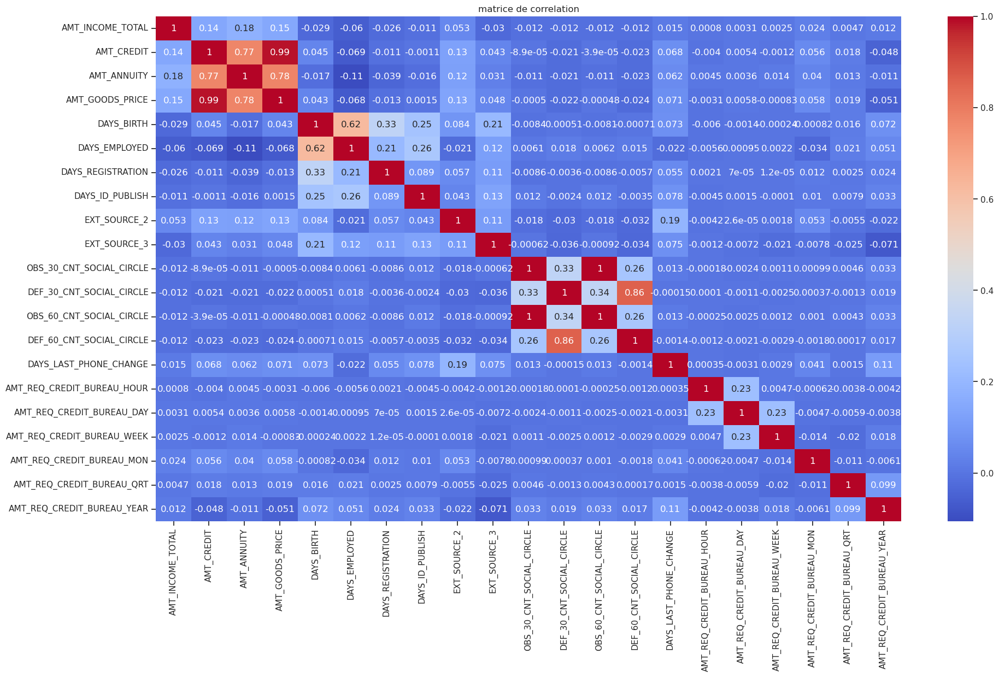

In [168]:
float_columns = application_train.select_dtypes(include=['float64', 'float32']).columns
#float_columns
df = application_train[float_columns]
matrix = df.corr(method = 'pearson')
plt.figure(figsize = (22,12))
sns.heatmap(matrix, annot = True,cmap = 'coolwarm')
plt.title('matrice de correlation')
plt.show()


**d'apres la matrice de correlation:**

- correlation entre 'AMT_CREDIT' ET 'AMT_GOODS_PRICE'.  À 99%.
- OBS_30_CNT_SOCIAL_CIRCLE et OBS_60_CNT_SOCIAL_CIRCLE.à 100%.
* je supprime l'un de deux colonnes plus correle.

In [382]:
application_train.drop(columns = ['OBS_60_CNT_SOCIAL_CIRCLE','AMT_GOODS_PRICE'], inplace  = True, axis = 1)

* Creation des colonnes engenniring:

In [383]:
#" creation des colonnes engenniring"
application_train['CREDIT_INCOME_PERCENT'] = application_train['AMT_CREDIT'] / application_train['AMT_INCOME_TOTAL']
application_train['ANNUITY_INCOME_PERCENT'] = application_train['AMT_ANNUITY'] / application_train['AMT_INCOME_TOTAL']
application_train['CREDIT_TERM'] = application_train['AMT_ANNUITY'] / application_train['AMT_CREDIT']

In [384]:
application_train.shape

(246541, 65)

In [385]:
application_train.dtypes

SK_ID_CURR                        int64
TARGET                            int64
NAME_CONTRACT_TYPE               object
CODE_GENDER                      object
FLAG_OWN_CAR                     object
FLAG_OWN_REALTY                  object
CNT_CHILDREN                     object
AMT_INCOME_TOTAL                float64
AMT_CREDIT                      float64
AMT_ANNUITY                     float64
NAME_TYPE_SUITE                  object
NAME_INCOME_TYPE                 object
NAME_EDUCATION_TYPE              object
NAME_FAMILY_STATUS               object
NAME_HOUSING_TYPE                object
DAYS_BIRTH                      float64
DAYS_EMPLOYED                   float64
DAYS_REGISTRATION               float64
DAYS_ID_PUBLISH                 float64
FLAG_EMP_PHONE                   object
FLAG_WORK_PHONE                  object
FLAG_CONT_MOBILE                 object
FLAG_PHONE                       object
FLAG_EMAIL                       object
OCCUPATION_TYPE                  object


In [386]:
messing_val = application_train.columns[(application_train.isna().sum() / application_train.shape[0] >0)]
len(messing_val)

0

## EDA pour les données APPLICATION_TEST:

In [387]:
## read data application_test:
application_test = pd.read_csv(path + 'application_test.csv', encoding='ISO-8859-1') 

In [388]:
data = application_test.copy()

In [389]:
application_test.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.018850,-19241,-2329,-5170.0,-812,NaN,1,1,0,1,0,1,NaN,2.0,2,2,TUESDAY,18,0,0,0,0,0,0,Kindergarten,0.752614,0.789654,0.159520,0.0660,0.0590,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0505,NaN,NaN,0.0672,0.0612,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0526,NaN,NaN,0.0666,0.0590,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0514,NaN,NaN,NaN,block of flats,0.0392,"Stone, brick",No,0.0,0.0,0.0,0.0,-1740.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.035792,-18064,-4469,-9118.0,-1623,NaN,1,1,0,1,0,0,Low-skill Laborers,2.0,2,2,FRIDAY,9,0,0,0,0,0,0,Self-employed,0.564990,0.291656,0.432962,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,NaN,Working,Higher education,Married,House / apartment,0.019101,-20038,-4458,-2175.0,-3503,5.0,1,1,0,1,0,0,Drivers,2.0,2,2,MONDAY,14,0,0,0,0,0,0,Transport: type 3,NaN,0.699787,0.610991,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-856.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,Unaccompanied,Working,Secondary / secondary special,Married

In [390]:
print('Training Features shape: ', application_test.shape)

Training Features shape:  (48744, 121)


In [391]:
application_test.dtypes.value_counts()

float64    65
int64      40
object     16
Name: count, dtype: int64

In [392]:
application_test.select_dtypes('object').nunique()

NAME_CONTRACT_TYPE             2
CODE_GENDER                    2
FLAG_OWN_CAR                   2
FLAG_OWN_REALTY                2
NAME_TYPE_SUITE                7
NAME_INCOME_TYPE               7
NAME_EDUCATION_TYPE            5
NAME_FAMILY_STATUS             5
NAME_HOUSING_TYPE              6
OCCUPATION_TYPE               18
WEEKDAY_APPR_PROCESS_START     7
ORGANIZATION_TYPE             58
FONDKAPREMONT_MODE             4
HOUSETYPE_MODE                 3
WALLSMATERIAL_MODE             7
EMERGENCYSTATE_MODE            2
dtype: int64

<Axes: >

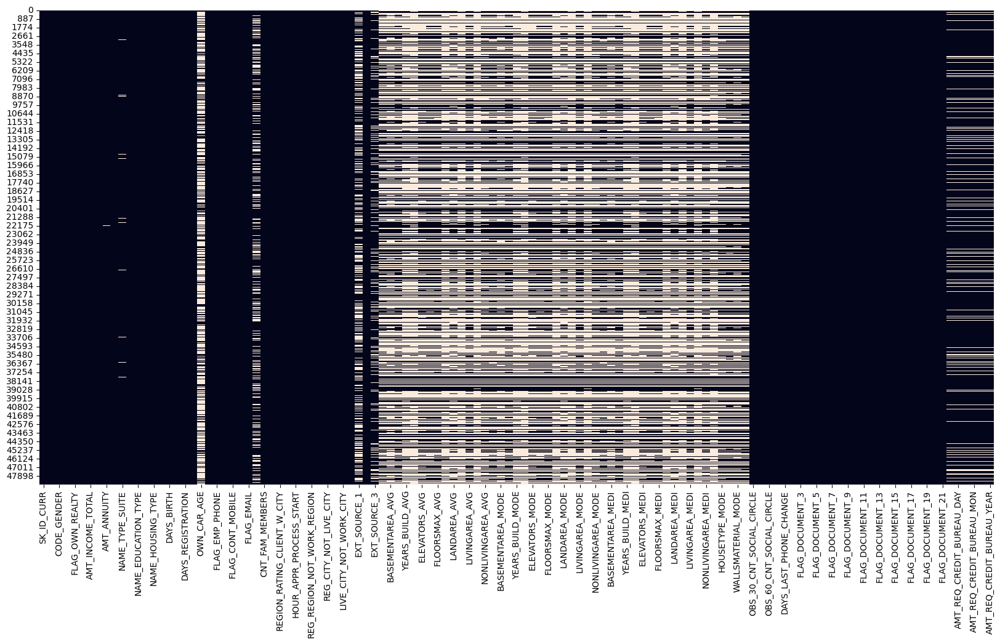

In [15]:
plt.figure(figsize=(20,10))
sns.heatmap(application_test.isna(), cbar=False)


In [393]:
messing_rate = (application_test.isna().sum()/application_test.shape[0]).sort_values(ascending = False)
messing_rate

COMMONAREA_AVG                  0.687161
COMMONAREA_MODE                 0.687161
COMMONAREA_MEDI                 0.687161
NONLIVINGAPARTMENTS_AVG         0.684125
NONLIVINGAPARTMENTS_MODE        0.684125
NONLIVINGAPARTMENTS_MEDI        0.684125
FONDKAPREMONT_MODE              0.672842
LIVINGAPARTMENTS_AVG            0.672493
LIVINGAPARTMENTS_MODE           0.672493
LIVINGAPARTMENTS_MEDI           0.672493
FLOORSMIN_MEDI                  0.666051
FLOORSMIN_AVG                   0.666051
FLOORSMIN_MODE                  0.666051
OWN_CAR_AGE                     0.662892
YEARS_BUILD_AVG                 0.652757
YEARS_BUILD_MEDI                0.652757
YEARS_BUILD_MODE                0.652757
LANDAREA_MEDI                   0.579641
LANDAREA_AVG                    0.579641
LANDAREA_MODE                   0.579641
BASEMENTAREA_MEDI               0.567065
BASEMENTAREA_AVG                0.567065
BASEMENTAREA_MODE               0.567065
NONLIVINGAREA_AVG               0.535122
NONLIVINGAREA_MO

In [394]:
for col in application_test.select_dtypes('object'):

    print(f'{col :-<50} {application_test[col].unique()}')
    print()

NAME_CONTRACT_TYPE-------------------------------- ['Cash loans' 'Revolving loans']

CODE_GENDER--------------------------------------- ['F' 'M']

FLAG_OWN_CAR-------------------------------------- ['N' 'Y']

FLAG_OWN_REALTY----------------------------------- ['Y' 'N']

NAME_TYPE_SUITE----------------------------------- ['Unaccompanied' nan 'Family' 'Spouse, partner' 'Group of people'
 'Other_B' 'Children' 'Other_A']

NAME_INCOME_TYPE---------------------------------- ['Working' 'State servant' 'Pensioner' 'Commercial associate'
 'Businessman' 'Student' 'Unemployed']

NAME_EDUCATION_TYPE------------------------------- ['Higher education' 'Secondary / secondary special' 'Incomplete higher'
 'Lower secondary' 'Academic degree']

NAME_FAMILY_STATUS-------------------------------- ['Married' 'Single / not married' 'Civil marriage' 'Widow' 'Separated']

NAME_HOUSING_TYPE--------------------------------- ['House / apartment' 'With parents' 'Rented apartment'
 'Municipal apartment' 'Office ap

### Analyse univariée:

**NAME_CONTRACT_TYPE**

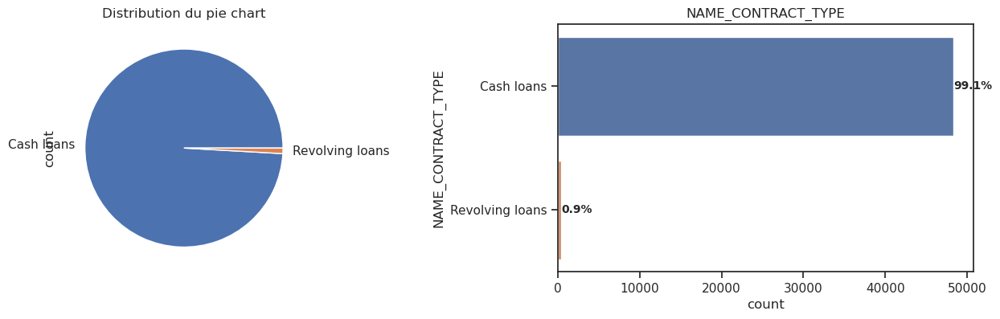

In [395]:
visualize_df(application_test, 'NAME_CONTRACT_TYPE', "NAME_CONTRACT_TYPE")

**CODE_GENDER**

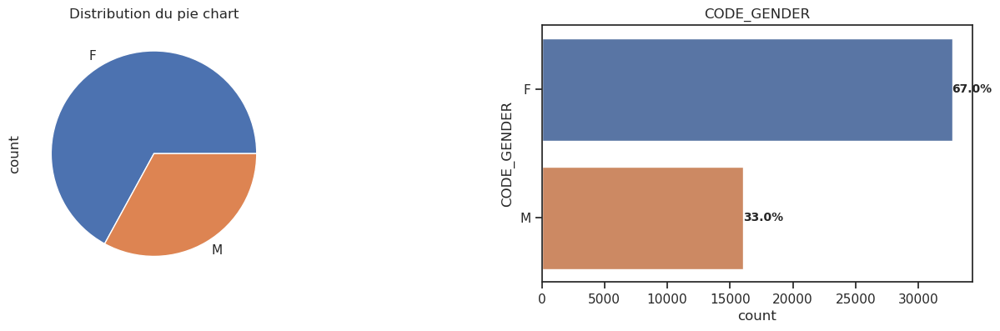

In [396]:
visualize_df(application_test, 'CODE_GENDER', "CODE_GENDER")

**FLAG_OWN_CAR**

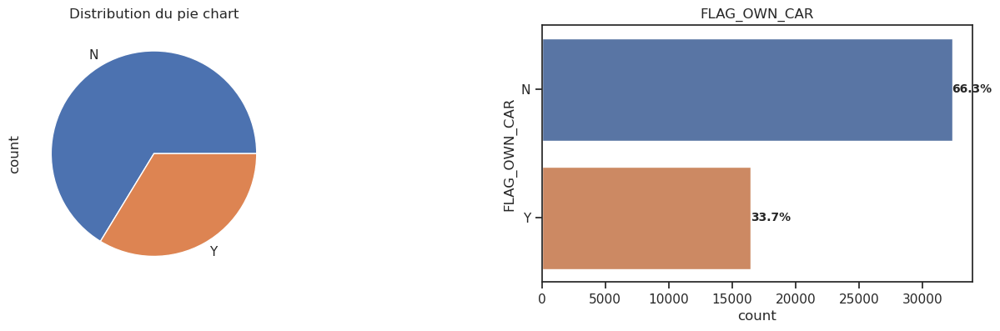

In [397]:
visualize_df(application_test, 'FLAG_OWN_CAR', "FLAG_OWN_CAR")

**FLAG_OWN_REALTY**

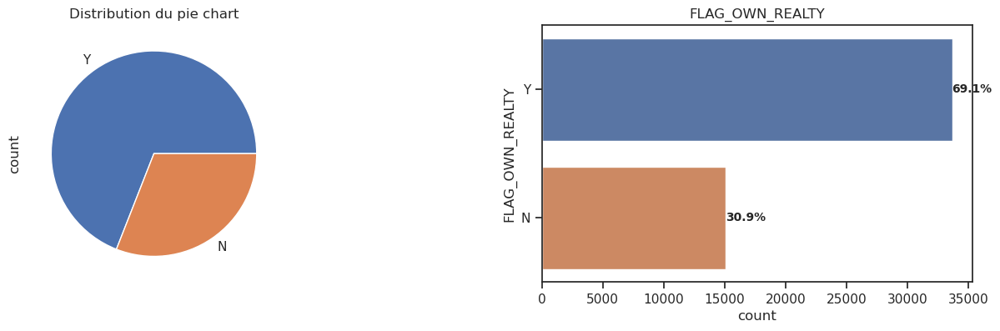

In [398]:
visualize_df(application_test, 'FLAG_OWN_REALTY', "FLAG_OWN_REALTY")

**NAME_TYPE_SUITE**

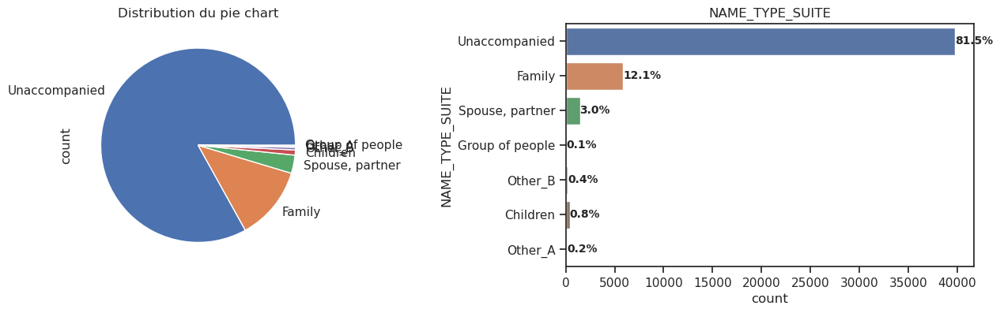

In [399]:
visualize_df(application_test, 'NAME_TYPE_SUITE', "NAME_TYPE_SUITE")

In [400]:
group_to_replace = { 'Unaccompanied':'Unaccompanied',
            'Family':'Family',
            'Spouse, partner':'spouse_partner',
            'Children':'Children',
            'Group of people':'others',
            'Other_B':'others',
            'Other_A':'others'
}
application_test['NAME_TYPE_SUITE'].replace(group_to_replace, inplace=True)

**NAME_INCOME_TYPE**

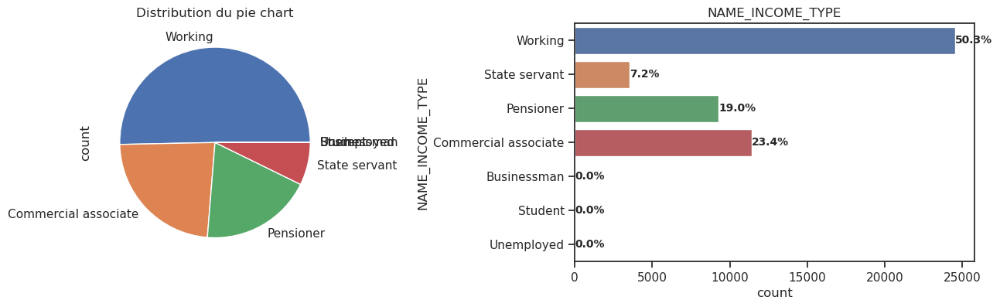

In [401]:
visualize_df(application_test, 'NAME_INCOME_TYPE', "NAME_INCOME_TYPE")

**NAME_EDUCATION_TYPE**

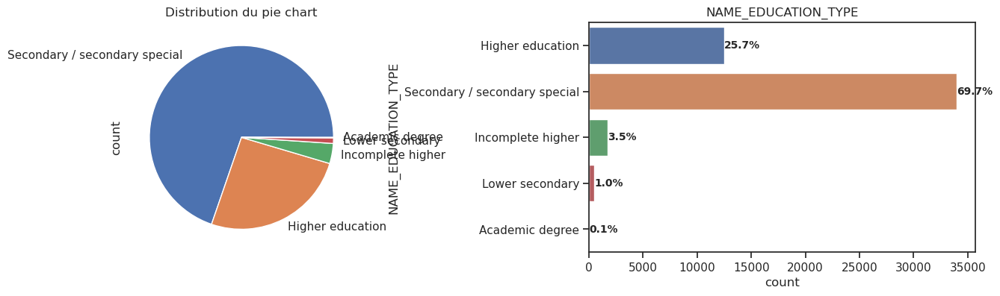

In [402]:
visualize_df(application_test, 'NAME_EDUCATION_TYPE', "NAME_EDUCATION_TYPE")

**NAME_FAMILY_STATUS**

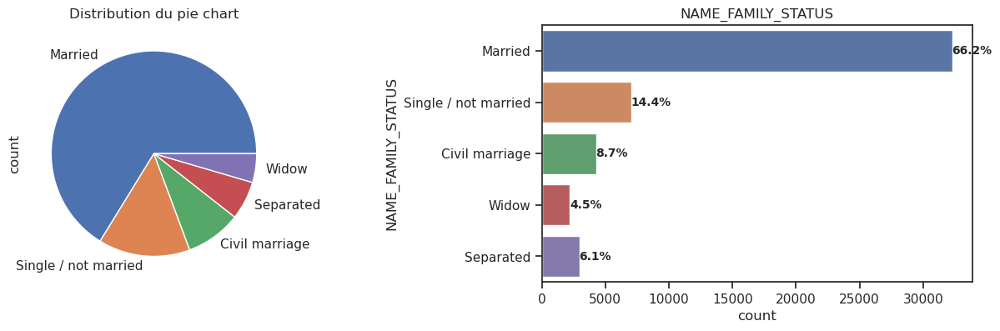

In [403]:
visualize_df(application_test, 'NAME_FAMILY_STATUS', "NAME_FAMILY_STATUS")

**NAME_HOUSING_TYPE**

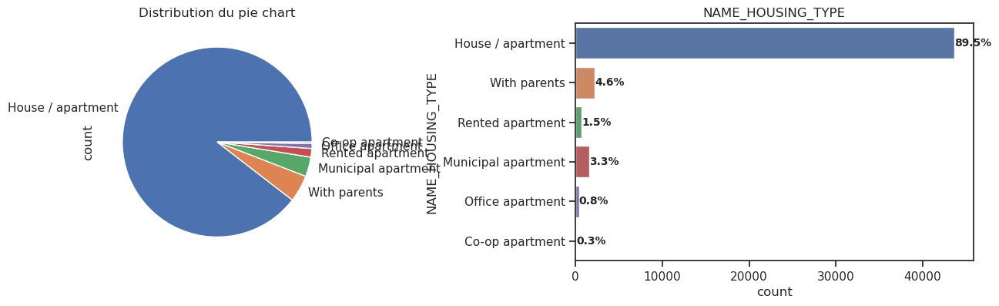

In [404]:
visualize_df(application_test, 'NAME_HOUSING_TYPE', "NAME_HOUSING_TYPE")

**OCCUPATION_TYPE**

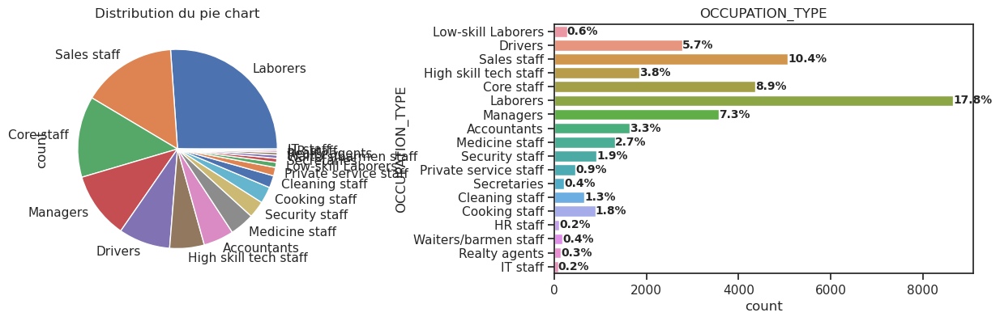

In [405]:
visualize_df(application_test, 'OCCUPATION_TYPE', "OCCUPATION_TYPE")

**WALLSMATERIAL_MODE**

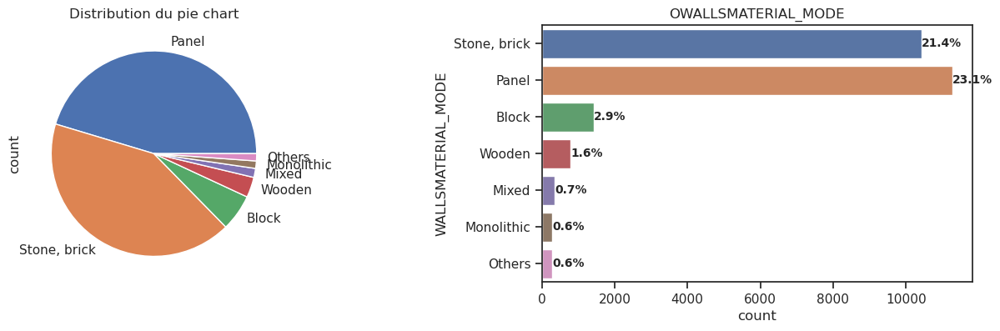

In [406]:
visualize_df(application_test, 'WALLSMATERIAL_MODE', "OWALLSMATERIAL_MODE")

**EMERGENCYSTATE_MODE**

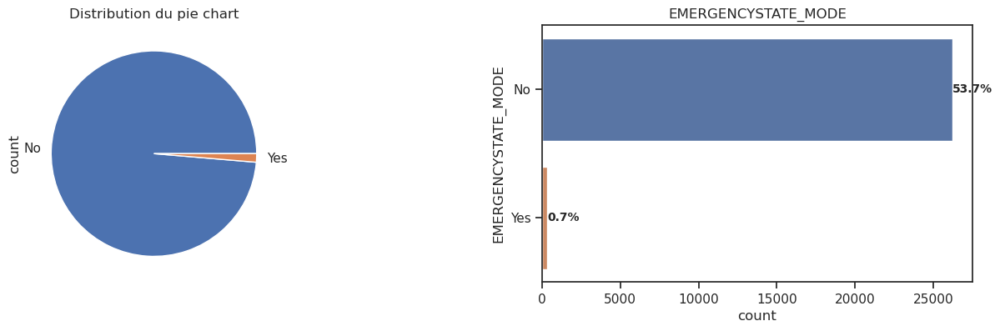

In [407]:
visualize_df(application_test, 'EMERGENCYSTATE_MODE', "EMERGENCYSTATE_MODE")

**FONDKAPREMONT_MODE**

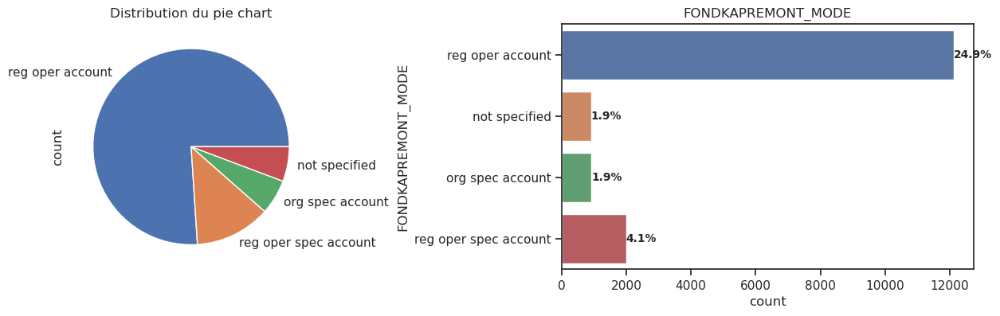

In [408]:
visualize_df(application_test, 'FONDKAPREMONT_MODE', "FONDKAPREMONT_MODE")

**ORGANIZATION_TYPE**

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57]),
 [Text(0, 0, 'Kindergarten'),
  Text(1, 0, 'Self-employed'),
  Text(2, 0, 'Transport: type 3'),
  Text(3, 0, 'Business Entity Type 3'),
  Text(4, 0, 'Government'),
  Text(5, 0, 'Industry: type 9'),
  Text(6, 0, 'School'),
  Text(7, 0, 'Trade: type 2'),
  Text(8, 0, 'XNA'),
  Text(9, 0, 'Services'),
  Text(10, 0, 'Bank'),
  Text(11, 0, 'Industry: type 3'),
  Text(12, 0, 'Other'),
  Text(13, 0, 'Trade: type 6'),
  Text(14, 0, 'Industry: type 12'),
  Text(15, 0, 'Trade: type 7'),
  Text(16, 0, 'Postal'),
  Text(17, 0, 'Medicine'),
  Text(18, 0, 'Housing'),
  Text(19, 0, 'Business Entity Type 2'),
  Text(20, 0, 'Construction'),
  Text(21, 0, 'Military'),
  Text(22, 0, 'Industry: type 4'),
  Text(23, 0, 'Trade: type 3'),
  Text(2

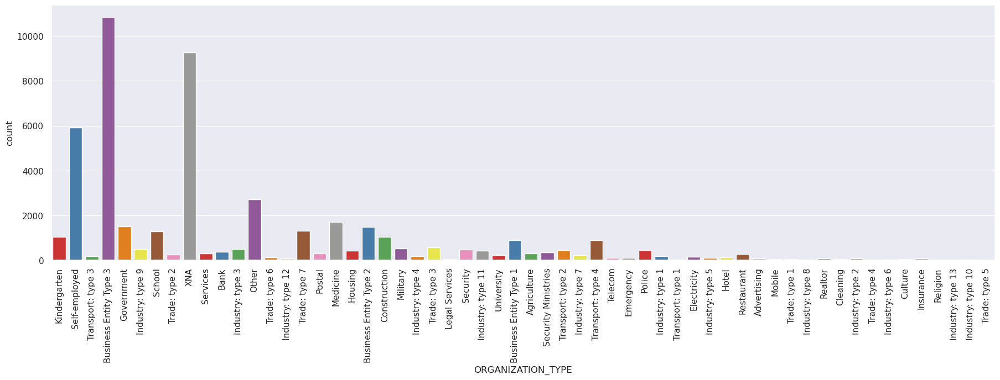

In [409]:
sns.set(style="darkgrid")  # Définissez le style du graphique
plt.figure(figsize=(22, 6))  # Réglez la taille de la figure

# Créez le graphique à barres pour la colonne 'Genre'
sns.countplot(x='ORGANIZATION_TYPE', data= application_test, palette="Set1")
plt.xticks(rotation= 90)


In [410]:
application_test['ORGANIZATION_TYPE'] = application_test['ORGANIZATION_TYPE'].replace({'XNA':application_test['ORGANIZATION_TYPE'].mode()[0]})

**HOUSETYPE_MODE**

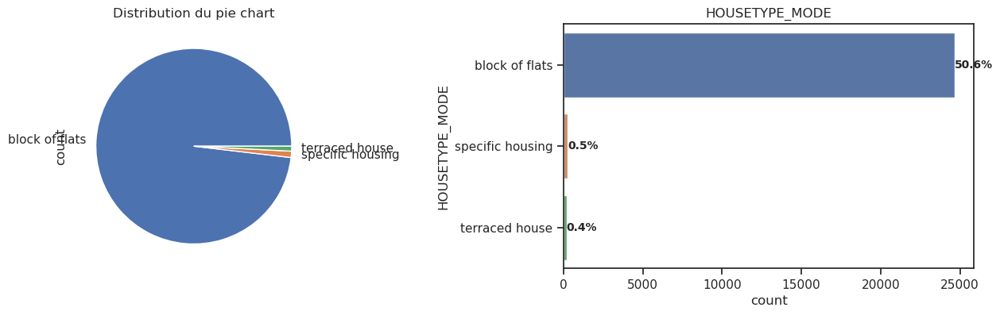

In [411]:
visualize_df(application_test, 'HOUSETYPE_MODE', "HOUSETYPE_MODE")

### variables numeriques entieres:

In [412]:
for col in application_test.select_dtypes('int64'):

    print(f'{col :-<50} {application_test[col].unique()}')
    print()

SK_ID_CURR---------------------------------------- [100001 100005 100013 ... 456223 456224 456250]

CNT_CHILDREN-------------------------------------- [ 0  2  1  3  8  4  6  5  7 20 11]

DAYS_BIRTH---------------------------------------- [-19241 -18064 -20038 ... -24168  -9192 -16019]

DAYS_EMPLOYED------------------------------------- [-2329 -4469 -4458 ... -7435 -7172 -6551]

DAYS_ID_PUBLISH----------------------------------- [ -812 -1623 -3503 ... -5384 -5228 -6120]

FLAG_MOBIL---------------------------------------- [1 0]

FLAG_EMP_PHONE------------------------------------ [1 0]

FLAG_WORK_PHONE----------------------------------- [0 1]

FLAG_CONT_MOBILE---------------------------------- [1 0]

FLAG_PHONE---------------------------------------- [0 1]

FLAG_EMAIL---------------------------------------- [1 0]

REGION_RATING_CLIENT------------------------------ [2 1 3]

REGION_RATING_CLIENT_W_CITY----------------------- [ 2  1  3 -1]

HOUR_APPR_PROCESS_START--------------------------- 

**CNT_CHILDREN**

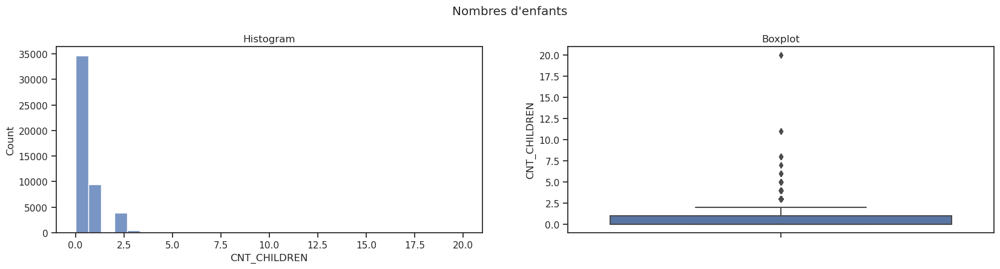

In [413]:
plot_hist(application_test, 'CNT_CHILDREN', "Nombres d'enfants")

In [414]:
# Appliquer la fonction pour créer une nouvelle colonne catégorisée
application_test['CNT_CHILDREN'] = application_test['CNT_CHILDREN'].apply(categorize_children)

In [415]:
application_test['CNT_CHILDREN'].unique()

array(['No_children', 'two_or_more', 'one_child'], dtype=object)

**DAYS_BIRTH**

In [416]:
application_test['DAYS_BIRTH'].describe()

count    48744.000000
mean    -16068.084605
std       4325.900393
min     -25195.000000
25%     -19637.000000
50%     -15785.000000
75%     -12496.000000
max      -7338.000000
Name: DAYS_BIRTH, dtype: float64

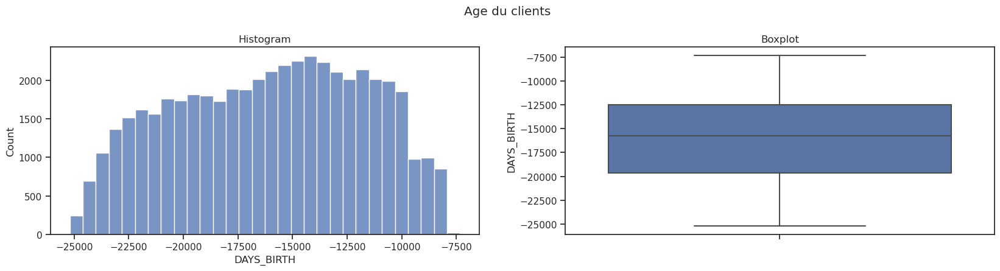

In [417]:
plot_hist(application_test,'DAYS_BIRTH',"Age du clients")

In [418]:
application_test['DAYS_BIRTH'] = abs(round(application_test['DAYS_BIRTH']/365,0))

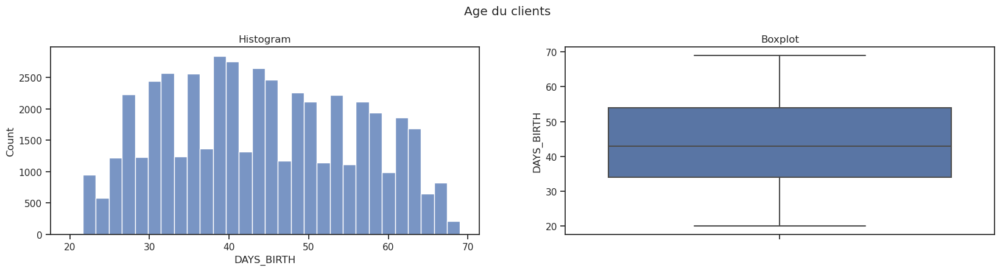

In [419]:
plot_hist(application_test,'DAYS_BIRTH',"Age du clients")

In [420]:
# application_test['age_client'] = pd.cut(application_test['DAYS_BIRTH'], bins= np.linspace(20 ,70 , num=6))
# application_test['age_client'].head(20)

In [153]:
# application_test['age_client'].fillna(application_test['age_client'].mode()[0],inplace = True)

In [154]:
# application_test['age_client'].unique()

[(50.0, 60.0], (40.0, 50.0], (30.0, 40.0], (20.0, 30.0], (60.0, 70.0]]
Categories (5, interval[float64, right]): [(20.0, 30.0] < (30.0, 40.0] < (40.0, 50.0] < (50.0, 60.0] < (60.0, 70.0]]

**DAYS_EMPLOYED**

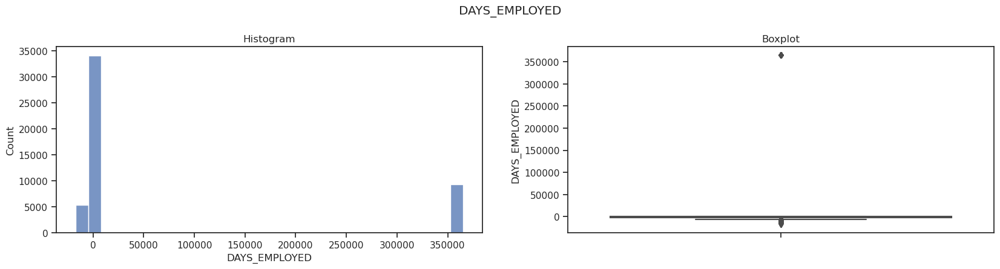

In [421]:
plot_hist(application_test,'DAYS_EMPLOYED',"DAYS_EMPLOYED")

In [422]:
application_test['DAYS_EMPLOYED'].describe()

count     48744.000000
mean      67485.366322
std      144348.507136
min      -17463.000000
25%       -2910.000000
50%       -1293.000000
75%        -296.000000
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64

In [423]:
# on cherche a savoir depuis combiens d'année le client est il employé dans son entreprise:
application_test['DAYS_EMPLOYED'] = abs(round(application_test['DAYS_EMPLOYED']/ 365,0))

**DAYS_ID_PUBLISH**

In [424]:
application_test['DAYS_ID_PUBLISH'].describe()

count    48744.000000
mean     -3051.712949
std       1569.276709
min      -6348.000000
25%      -4448.000000
50%      -3234.000000
75%      -1706.000000
max          0.000000
Name: DAYS_ID_PUBLISH, dtype: float64

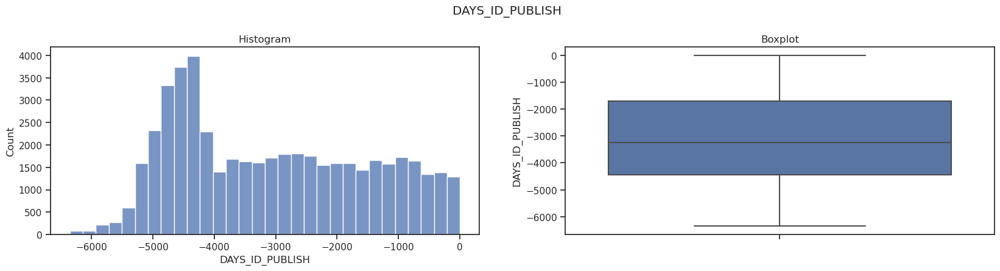

In [425]:
plot_hist(application_test,'DAYS_ID_PUBLISH',"DAYS_ID_PUBLISH")

In [426]:
application_test['DAYS_ID_PUBLISH'] = abs(round(application_test['DAYS_ID_PUBLISH']/365,0))


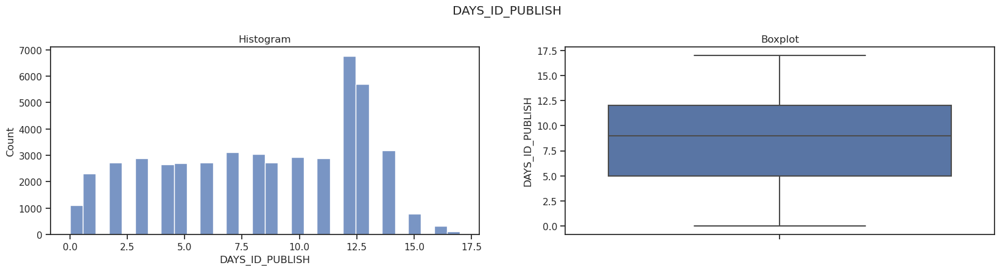

In [427]:
plot_hist(application_test,'DAYS_ID_PUBLISH','DAYS_ID_PUBLISH')

**DAYS_REGISTRATION**

In [429]:
application_test['DAYS_REGISTRATION'].describe()

count    48744.000000
mean     -4967.652716
std       3552.612035
min     -23722.000000
25%      -7459.250000
50%      -4490.000000
75%      -1901.000000
max          0.000000
Name: DAYS_REGISTRATION, dtype: float64

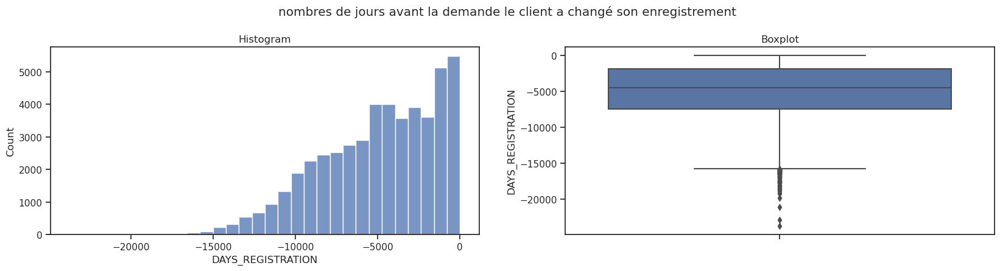

In [428]:
plot_hist(application_test,'DAYS_REGISTRATION',"nombres de jours avant la demande le client a changé son enregistrement")

In [430]:
application_test['DAYS_REGISTRATION'] = abs(application_test['DAYS_REGISTRATION'] / 365)

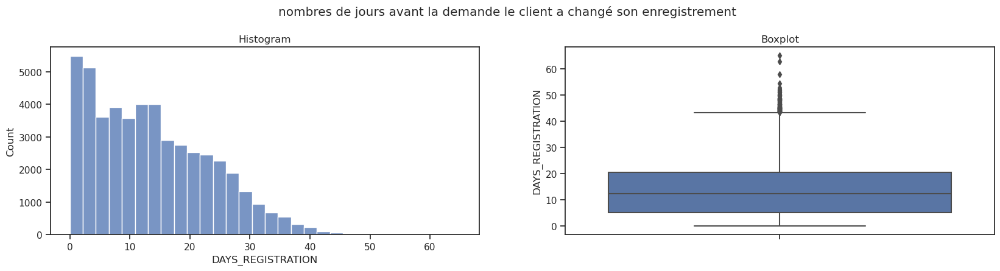

In [431]:
plot_hist(application_test,'DAYS_REGISTRATION',"nombres de jours avant la demande le client a changé son enregistrement")

In [165]:
# pd.qcut(application_test['DAYS_REGISTRATION'],q = 5).head(8)

0     (9.466, 14.866]
1    (22.592, 64.992]
2      (3.904, 9.466]
3      (3.904, 9.466]
4     (9.466, 14.866]
5    (14.866, 22.592]
6    (22.592, 64.992]
7     (9.466, 14.866]
Name: DAYS_REGISTRATION, dtype: category
Categories (5, interval[float64, right]): [(-0.001, 3.904] < (3.904, 9.466] < (9.466, 14.866] < (14.866, 22.592] < (22.592, 64.992]]

In [166]:
# labels = ['moins_5_ans', '5_a_9_ans', '10_a_14_ans',"15_a_22_ans", "23_au_plus"]
# application_test['years_REGISTRATION'] = pd.cut(application_test['DAYS_REGISTRATION'],bins = 5,  labels=labels)

# application_test.drop(columns = ['DAYS_REGISTRATION'],inplace = True,axis = 1)


**DAYS_LAST_PHONE_CHANGE**

In [432]:
application_test['DAYS_LAST_PHONE_CHANGE'].describe()

count    48744.000000
mean     -1077.766228
std        878.920740
min      -4361.000000
25%      -1766.250000
50%       -863.000000
75%       -363.000000
max          0.000000
Name: DAYS_LAST_PHONE_CHANGE, dtype: float64

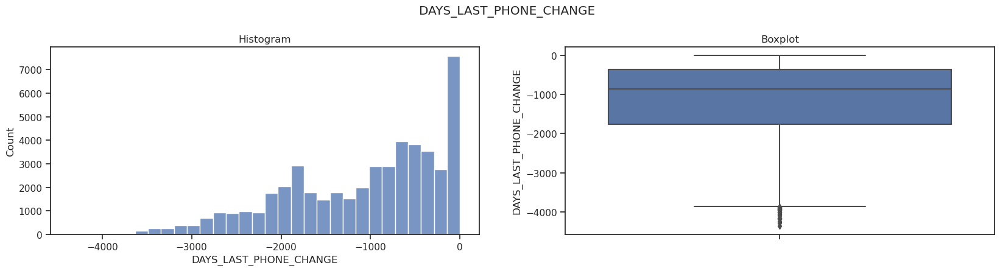

In [56]:
plot_hist(application_test,'DAYS_LAST_PHONE_CHANGE',"DAYS_LAST_PHONE_CHANGE")

In [433]:
application_test['DAYS_LAST_PHONE_CHANGE'] = application_test['DAYS_LAST_PHONE_CHANGE'] / -12

In [170]:
# pd.qcut(application_test['DAYS_LAST_PHONE_CHANGE'], q=5).head(7)

0      (95.0, 157.75]
1    (-0.001, 22.167]
2      (53.583, 95.0]
3      (95.0, 157.75]
4      (53.583, 95.0]
5      (95.0, 157.75]
6      (95.0, 157.75]
Name: DAYS_LAST_PHONE_CHANGE, dtype: category
Categories (5, interval[float64, right]): [(-0.001, 22.167] < (22.167, 53.583] < (53.583, 95.0] < (95.0, 157.75] < (157.75, 363.417]]

In [171]:
# labels = ['13 mois_et_demi', '14_a_45_mois', '46_a_88_mois', '89_a_143_mois', '144_a_358_mois']
# application_test['periode_phone_change'] = pd.qcut(application_test['DAYS_LAST_PHONE_CHANGE'],q= 5, labels=labels)


In [172]:
# # suppression de la colonneDAYS_LAST_PHONE_CHANGE:
# application_test.drop(columns = ['DAYS_LAST_PHONE_CHANGE'],axis = 1,inplace = True)
# application_test['periode_phone_change'].fillna(application_test['periode_phone_change'].mode()[0],inplace = True)


In [173]:
# application_test['periode_phone_change'].unique()

['89_a_143_mois', '13 mois_et_demi', '46_a_88_mois', '14_a_45_mois', '144_a_358_mois']
Categories (5, object): ['13 mois_et_demi' < '14_a_45_mois' < '46_a_88_mois' < '89_a_143_mois' < '144_a_358_mois']

**REGION_POPULATION_RELATIVE**

In [434]:
application_test['REGION_POPULATION_RELATIVE'].describe()

count    48744.000000
mean         0.021226
std          0.014428
min          0.000253
25%          0.010006
50%          0.018850
75%          0.028663
max          0.072508
Name: REGION_POPULATION_RELATIVE, dtype: float64

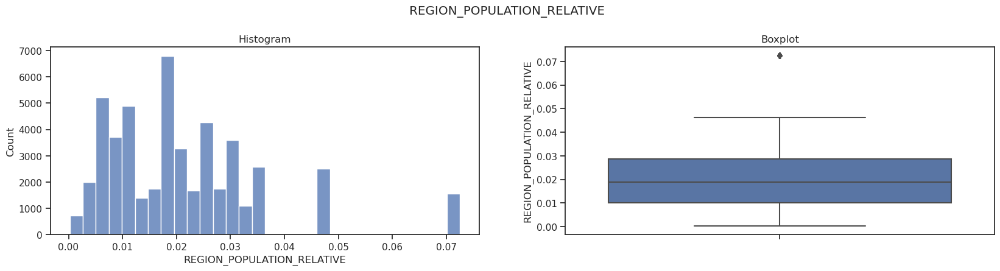

In [435]:
plot_hist(application_test,'REGION_POPULATION_RELATIVE','REGION_POPULATION_RELATIVE')

In [436]:
labels = ['F_Densité', 'M_Densité', 'H_Densité', 'Très_Haute_Densité']
quartiles = [0, 0.010006, 0.018850, 0.028663, 0.072508]
application_test['Population_Density'] = pd.cut(application_test['REGION_POPULATION_RELATIVE'], bins=quartiles, labels=labels)
application_test['Population_Density'].value_counts()
# suppresion la colonne 'REGION_POPULATION_RELATIVE':
application_test.drop(columns = ['REGION_POPULATION_RELATIVE'],inplace = True,axis = 1)

**REGION_RATING_CLIENT**

In [437]:
application_test['REGION_RATING_CLIENT'] = application_test['REGION_RATING_CLIENT'].replace({1:'Note_1',2:'Note_2',3:'Note_3'})

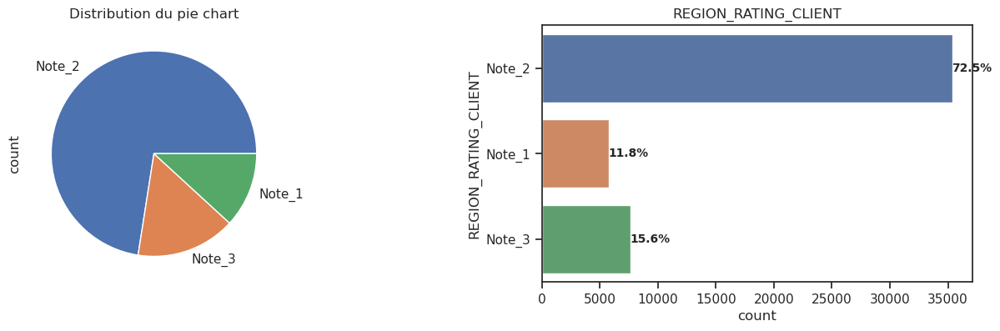

In [438]:
# application_train['REGION_RATING_CLIENT']
visualize_df(application_test, 'REGION_RATING_CLIENT', "REGION_RATING_CLIENT")

**REGION_RATING_CLIENT_W_CITY**

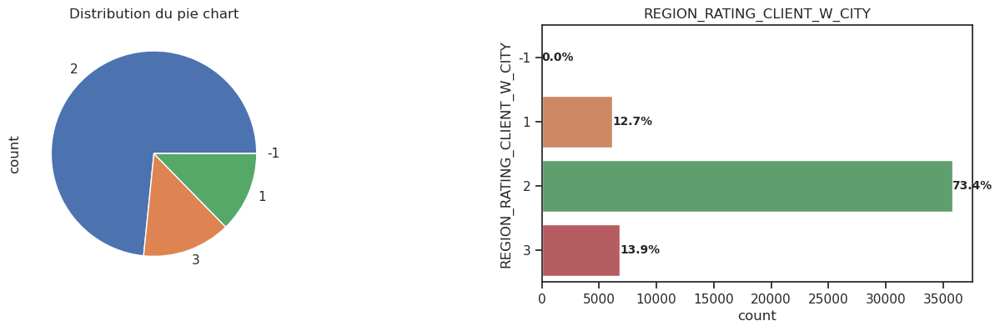

In [439]:
# application_test['REGION_RATING_CLIENT_W_CITY']
visualize_df(application_test, 'REGION_RATING_CLIENT_W_CITY', "REGION_RATING_CLIENT_W_CITY")

In [440]:
### je supprme la region -1 puisque dans le train y'on a que 1 et 2 et 3 d'apres la discription:
application_test['REGION_RATING_CLIENT_W_CITY'] = application_test.loc[application_test['REGION_RATING_CLIENT_W_CITY'] != -1, 'REGION_RATING_CLIENT_W_CITY']

In [441]:
application_test['REGION_RATING_CLIENT_W_CITY'] = application_test['REGION_RATING_CLIENT_W_CITY'].replace({1:'Note_1',2:'Note_2',3:'Note_3'})

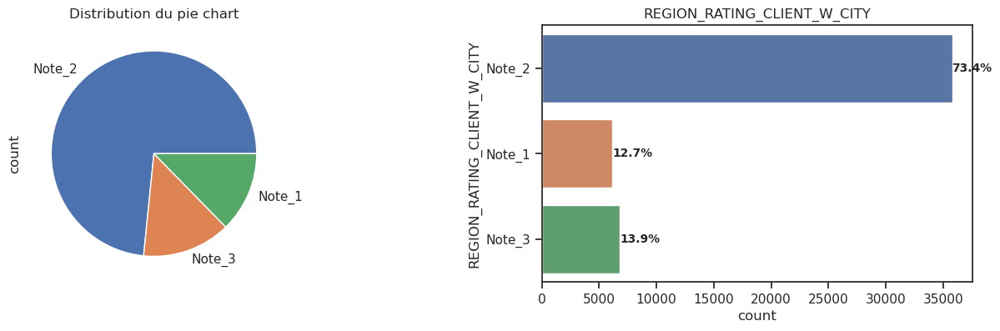

In [442]:
# application_test['REGION_RATING_CLIENT_W_CITY']
visualize_df(application_test, 'REGION_RATING_CLIENT_W_CITY', "REGION_RATING_CLIENT_W_CITY")

**HOUR_APPR_PROCESS_START**

In [443]:
application_test['HOUR_APPR_PROCESS_START'].describe()

count    48744.000000
mean        12.007365
std          3.278172
min          0.000000
25%         10.000000
50%         12.000000
75%         14.000000
max         23.000000
Name: HOUR_APPR_PROCESS_START, dtype: float64

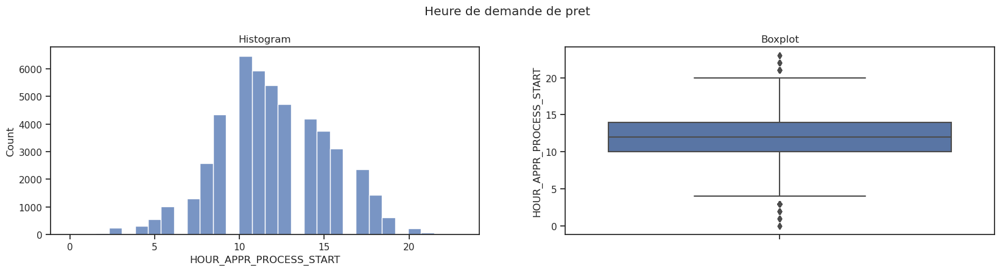

In [444]:
plot_hist(application_test,'HOUR_APPR_PROCESS_START',"Heure de demande de pret")

In [185]:
# # Définition des bin edges et des labels en fonction des fréquences
# bins = [0, 8, 16, 24] 
# labels = ['Matin', 'Après-midi', 'Soirée']
# application_test['Hour_Category'] = pd.cut(application_test['HOUR_APPR_PROCESS_START'], bins=bins, labels=labels)
# # supprimer la colonne'HOUR_APPR_PROCESS_START':
# application_test.drop(columns = ['HOUR_APPR_PROCESS_START'],inplace = True,axis = 1)

**REG_REGION_NOT_LIVE_REGION**

In [445]:
# 1 different at city live , 0 same at city live:
liste_region = ['REG_REGION_NOT_WORK_REGION','REG_REGION_NOT_LIVE_REGION','LIVE_REGION_NOT_WORK_REGION','REG_CITY_NOT_LIVE_CITY',
         'REG_CITY_NOT_WORK_CITY','LIVE_CITY_NOT_WORK_CITY']
application_test[liste_region] = application_test[liste_region].replace({1:'Different',0:'Same'})

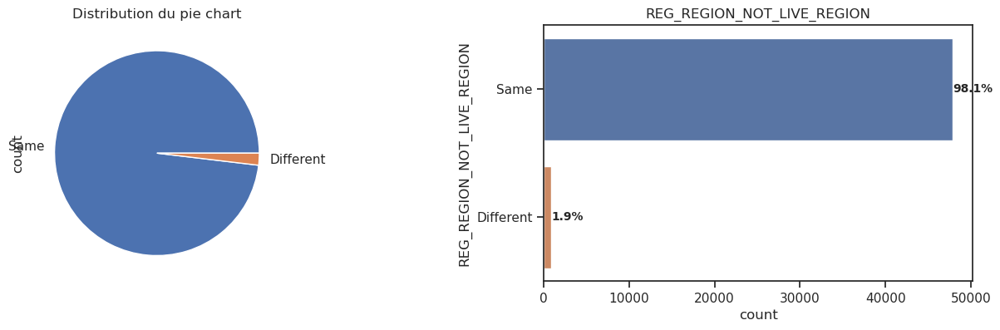

In [446]:
visualize_df(application_test, 'REG_REGION_NOT_LIVE_REGION', "REG_REGION_NOT_LIVE_REGION")

**REG_REGION_NOT_WORK_REGION**

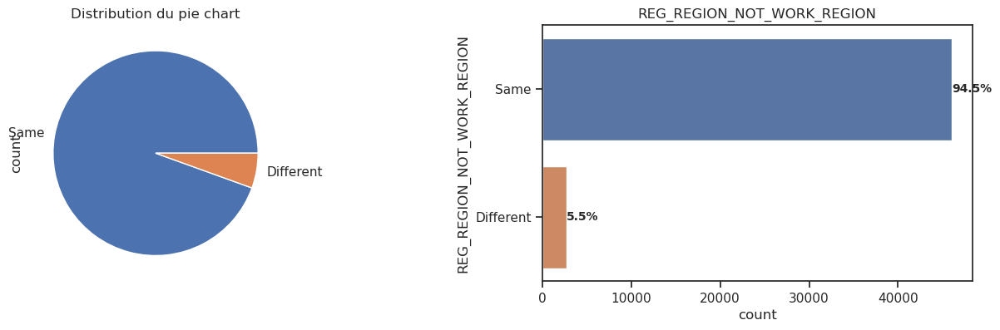

In [447]:
visualize_df(application_test, 'REG_REGION_NOT_WORK_REGION', "REG_REGION_NOT_WORK_REGION")

In [448]:
# je change 1 par yes et 0 par No comme indiquée sur la documentation:
liste_flag = ['FLAG_MOBIL','FLAG_EMP_PHONE','FLAG_WORK_PHONE','FLAG_CONT_MOBILE','FLAG_PHONE', 'FLAG_EMAIL',
         'FLAG_DOCUMENT_2','FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5','FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8',
       'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11','FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14',
       'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20','FLAG_DOCUMENT_21']

application_test[liste_flag] = application_test[liste_flag].replace({1:'Yes',0:'No'})

Text(0.5, 1.0, 'FLAG_DOCUMENT_21')

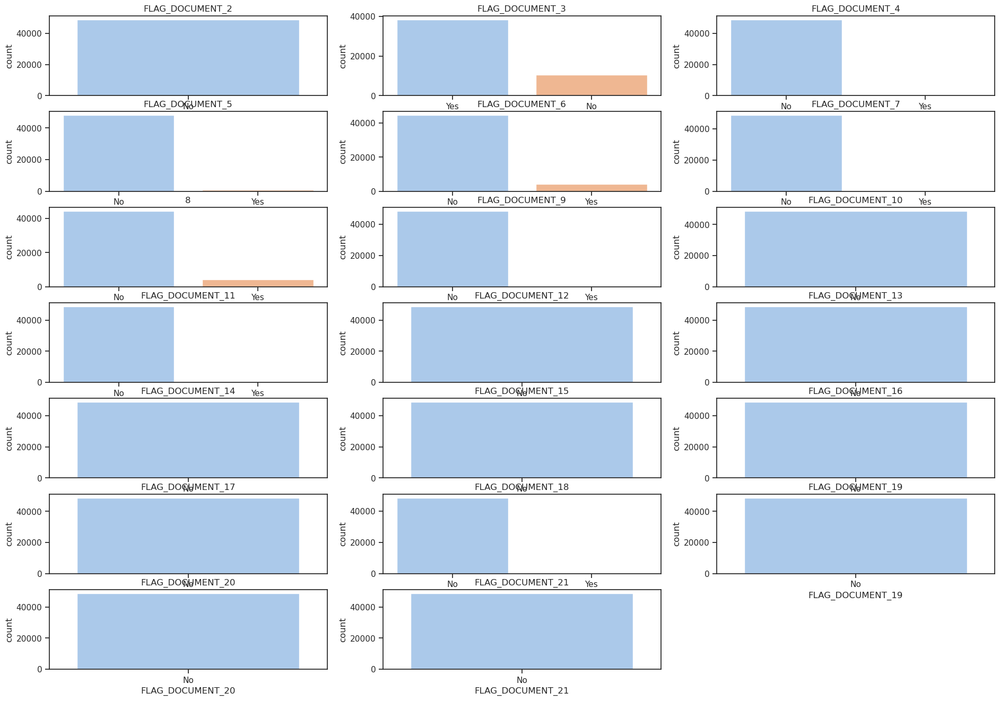

In [190]:
sns.set(style="ticks", rc = {'figure.figsize':(23,16 )})
   
plt.subplot(7, 3, 1)
sns.set_palette("pastel")
sns.countplot(data = application_test, x = 'FLAG_DOCUMENT_2', order=application_test['FLAG_DOCUMENT_2'].value_counts().index)
plt.title('FLAG_DOCUMENT_2')
 

plt.subplot(7, 3, 2)
sns.countplot(data = application_test, x = 'FLAG_DOCUMENT_3', order=application_test['FLAG_DOCUMENT_3'].value_counts().index)
plt.title('FLAG_DOCUMENT_3')


plt.subplot(7, 3, 3)
sns.countplot(data = application_test, x = 'FLAG_DOCUMENT_4', order=application_test['FLAG_DOCUMENT_4'].value_counts().index)
plt.title('FLAG_DOCUMENT_4')

plt.subplot(7, 3, 4)
sns.countplot(data = application_test, x = 'FLAG_DOCUMENT_5', order=application_test['FLAG_DOCUMENT_5'].value_counts().index)
plt.title('FLAG_DOCUMENT_5')


plt.subplot(7, 3, 5)
sns.countplot(data = application_test, x = 'FLAG_DOCUMENT_6', order=application_test['FLAG_DOCUMENT_6'].value_counts().index)
plt.title('FLAG_DOCUMENT_6')


plt.subplot(7, 3, 6)
sns.countplot(data = application_test, x = 'FLAG_DOCUMENT_7', order=application_test['FLAG_DOCUMENT_7'].value_counts().index)
plt.title('FLAG_DOCUMENT_7')

plt.subplot(7, 3, 7)
sns.countplot(data = application_test, x = 'FLAG_DOCUMENT_8', order=application_test['FLAG_DOCUMENT_8'].value_counts().index)
plt.title('8')

plt.subplot(7, 3, 8)
sns.countplot(data = application_test, x = 'FLAG_DOCUMENT_9', order=application_test['FLAG_DOCUMENT_9'].value_counts().index)
plt.title('FLAG_DOCUMENT_9')

plt.subplot(7, 3, 9)
sns.countplot(data = application_test, x = 'FLAG_DOCUMENT_10', order=application_test['FLAG_DOCUMENT_10'].value_counts().index)
plt.title('FLAG_DOCUMENT_10')

plt.subplot(7, 3, 10)
sns.countplot(data = application_test, x = 'FLAG_DOCUMENT_11', order=application_test['FLAG_DOCUMENT_11'].value_counts().index)
plt.title('FLAG_DOCUMENT_11')

plt.subplot(7, 3, 11)
sns.countplot(data = application_test, x = 'FLAG_DOCUMENT_12', order=application_test['FLAG_DOCUMENT_12'].value_counts().index)
plt.title('FLAG_DOCUMENT_12')

plt.subplot(7, 3, 12)
sns.countplot(data = application_test, x = 'FLAG_DOCUMENT_13', order=application_test['FLAG_DOCUMENT_13'].value_counts().index)
plt.title('FLAG_DOCUMENT_13')

plt.subplot(7, 3, 13)
sns.countplot(data = application_test, x = 'FLAG_DOCUMENT_14', order=application_test['FLAG_DOCUMENT_14'].value_counts().index)
plt.title('FLAG_DOCUMENT_14')

plt.subplot(7, 3, 14)
sns.countplot(data = application_test, x = 'FLAG_DOCUMENT_15', order=application_test['FLAG_DOCUMENT_15'].value_counts().index)
plt.title('FLAG_DOCUMENT_15')

plt.subplot(7, 3, 15)
sns.countplot(data = application_test, x = 'FLAG_DOCUMENT_16', order=application_test['FLAG_DOCUMENT_16'].value_counts().index)
plt.title('FLAG_DOCUMENT_16')

plt.subplot(7, 3, 16)
sns.countplot(data = application_test, x = 'FLAG_DOCUMENT_17', order=application_test['FLAG_DOCUMENT_17'].value_counts().index)
plt.title('FLAG_DOCUMENT_17')

plt.subplot(7, 3, 17)
sns.countplot(data = application_test, x = 'FLAG_DOCUMENT_18', order=application_test['FLAG_DOCUMENT_18'].value_counts().index)
plt.title('FLAG_DOCUMENT_18')

plt.subplot(7, 3, 18)
sns.countplot(data = application_test, x = 'FLAG_DOCUMENT_19', order=application_test['FLAG_DOCUMENT_19'].value_counts().index)
plt.title('FLAG_DOCUMENT_19')

plt.subplot(7, 3, 19)
sns.countplot(data = application_test, x = 'FLAG_DOCUMENT_20', order=application_test['FLAG_DOCUMENT_20'].value_counts().index)
plt.title('FLAG_DOCUMENT_20')

plt.subplot(7, 3, 20)
sns.countplot(data = application_test, x = 'FLAG_DOCUMENT_21', order=application_test['FLAG_DOCUMENT_21'].value_counts().index)
plt.title('FLAG_DOCUMENT_21')


* je supprime les colonnes qui contient qu'une seule variation par exemple 'FLAG_DOCUMENT_20' TOUS LES DONNÉS C'EST DE 0 alors ç ane sert a rien.

In [449]:
col_doc = ['FLAG_DOCUMENT_2','FLAG_DOCUMENT_10','FLAG_DOCUMENT_12','FLAG_DOCUMENT_13','FLAG_DOCUMENT_14','FLAG_DOCUMENT_15',
'FLAG_DOCUMENT_16','FLAG_DOCUMENT_17','FLAG_DOCUMENT_19','FLAG_DOCUMENT_20','FLAG_DOCUMENT_21','FLAG_MOBIL']
application_test.drop(columns = col_doc,inplace = True, axis = 1)

**AMT_INCOME_TOTAL**

In [450]:
application_test['AMT_INCOME_TOTAL'].describe()

count    4.874400e+04
mean     1.784318e+05
std      1.015226e+05
min      2.694150e+04
25%      1.125000e+05
50%      1.575000e+05
75%      2.250000e+05
max      4.410000e+06
Name: AMT_INCOME_TOTAL, dtype: float64

/tmp/ipykernel_56961/1296765921.py:6: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


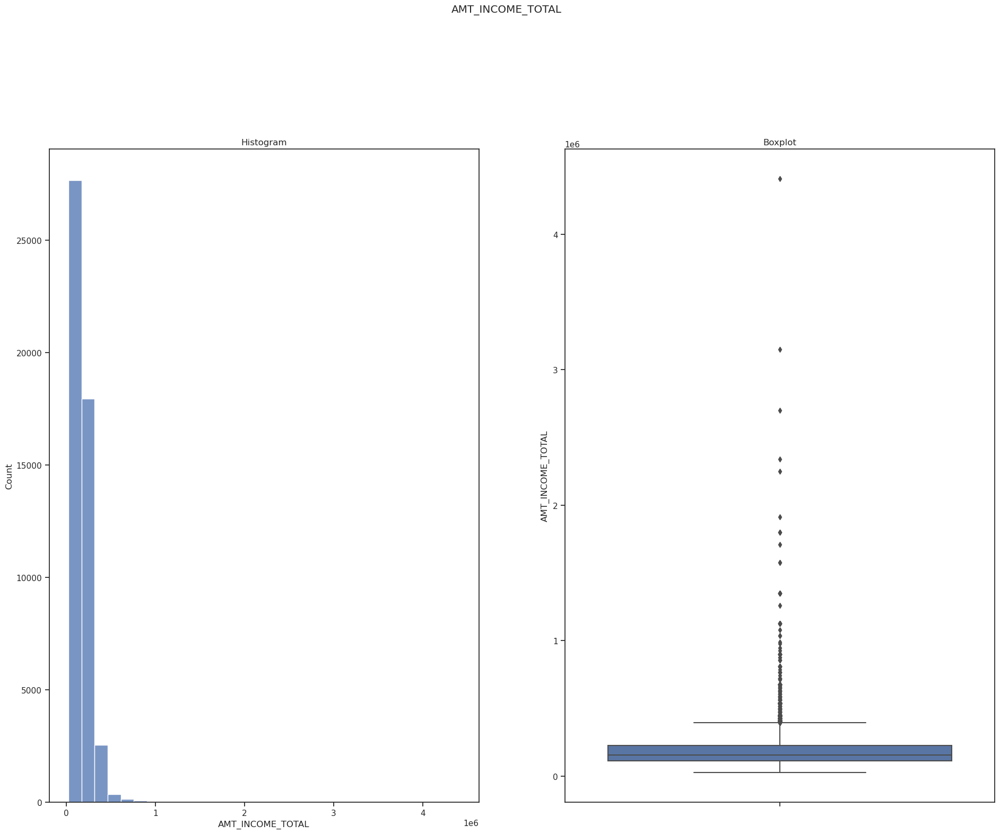

/tmp/ipykernel_56961/1296765921.py:6: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


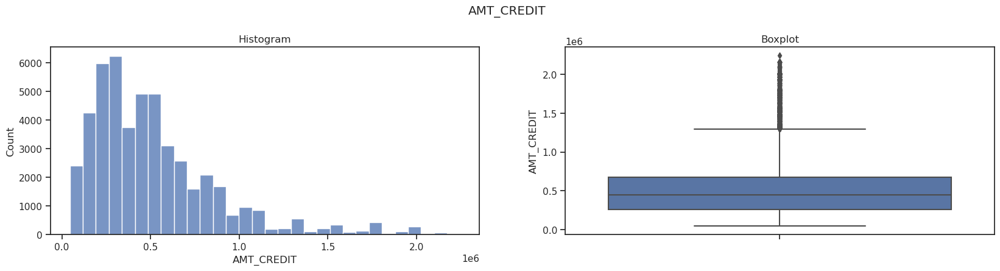

/tmp/ipykernel_56961/1296765921.py:11: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 2)


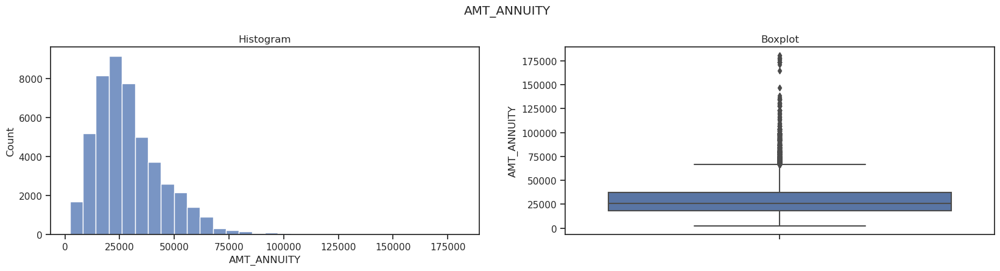

/tmp/ipykernel_56961/1296765921.py:6: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


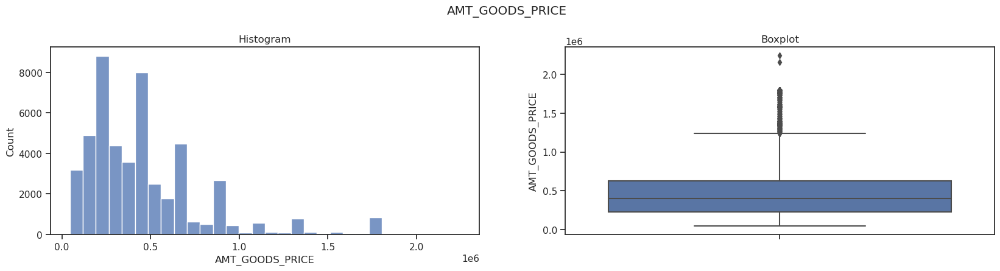

/tmp/ipykernel_56961/1296765921.py:6: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


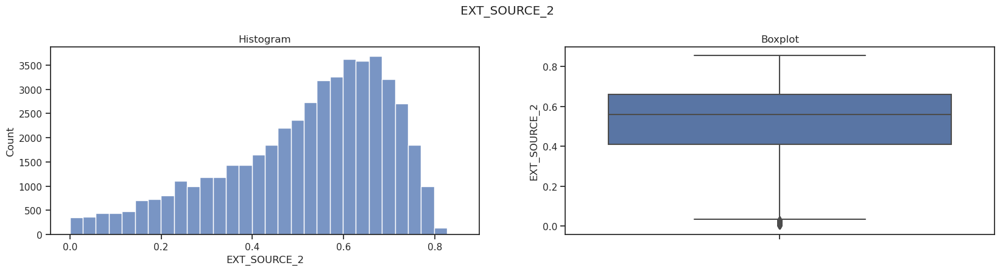

In [193]:
#plt.figure(figsize = (8,5))
plt.subplot(3,2,1)
plot_hist(application_test,'AMT_INCOME_TOTAL','AMT_INCOME_TOTAL')
plt.subplot(3,3,2)
plot_hist(application_test,'AMT_CREDIT','AMT_CREDIT')
plt.subplot(3,3,3)
plot_hist(application_test,'AMT_ANNUITY','AMT_ANNUITY')
plt.subplot(3,3,4)
plot_hist(application_test,'AMT_GOODS_PRICE','AMT_GOODS_PRICE')
plt.subplot(3,3,5)
plot_hist(application_test,'EXT_SOURCE_2','EXT_SOURCE_2')


**CNT_FAM_MEMBERS**

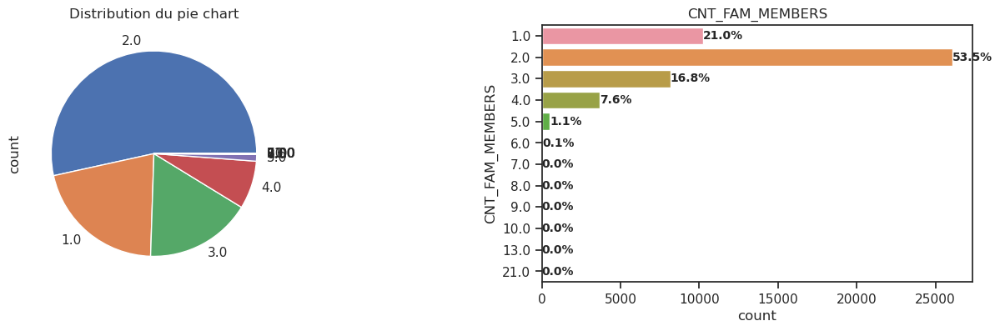

In [451]:
visualize_df(application_test, 'CNT_FAM_MEMBERS', "CNT_FAM_MEMBERS")

In [452]:
def categorize_family_members(count):
    "Function to categorize family members"

    if count == 1.0:
        return 'Single_person'
    elif count <= 4.0:
        return 'Small_family'
    elif count <= 6.0:
        return 'Medium_family'
    else:
        return 'Large_family'
# Apply the function to create a new categorized column
application_test['CNT_FAM_MEMBERS'] = application_test['CNT_FAM_MEMBERS'].apply(categorize_family_members)



### Nettoyages des données:

* Types catégoriels:

In [453]:
application_test.drop(columns = ['WALLSMATERIAL_MODE'], axis = 1,inplace = True)

In [455]:
# je remplace les valeurs manquantes pour occupation_type par le mode:
list_nan_cat = ['NAME_TYPE_SUITE','OCCUPATION_TYPE','EMERGENCYSTATE_MODE','HOUSETYPE_MODE','FONDKAPREMONT_MODE','REGION_RATING_CLIENT_W_CITY']
application_test[list_nan_cat] = application_test[list_nan_cat].fillna(application_test[list_nan_cat].mode().iloc[0])


* Types numeriques:

In [456]:
# je tente a remplacer les valeurs manquantes par la moyenne:pour les valeurs avec de nanW>60
messing_rate = application_test.columns[(application_test.isna().sum() / application_test.shape[0] >0.6)]
messing_rate

Index(['OWN_CAR_AGE', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'FLOORSMIN_AVG',
       'LIVINGAPARTMENTS_AVG', 'NONLIVINGAPARTMENTS_AVG', 'YEARS_BUILD_MODE',
       'COMMONAREA_MODE', 'FLOORSMIN_MODE', 'LIVINGAPARTMENTS_MODE',
       'NONLIVINGAPARTMENTS_MODE', 'YEARS_BUILD_MEDI', 'COMMONAREA_MEDI',
       'FLOORSMIN_MEDI', 'LIVINGAPARTMENTS_MEDI', 'NONLIVINGAPARTMENTS_MEDI'],
      dtype='object')

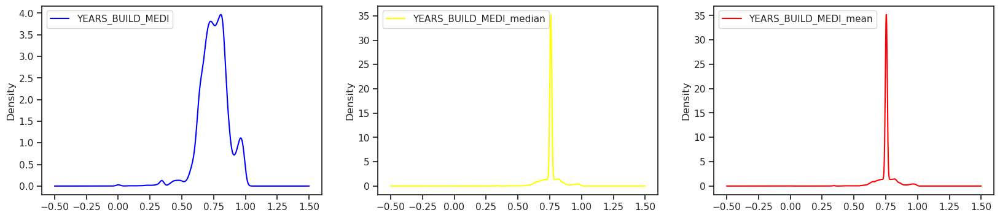

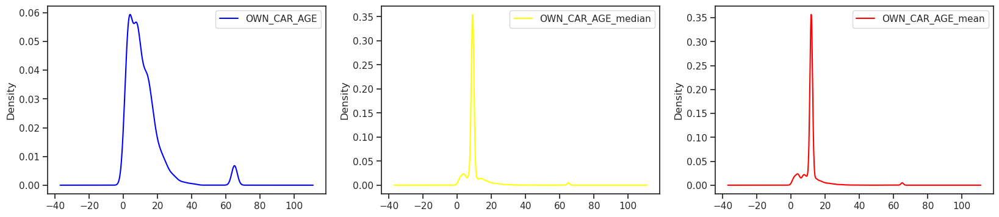

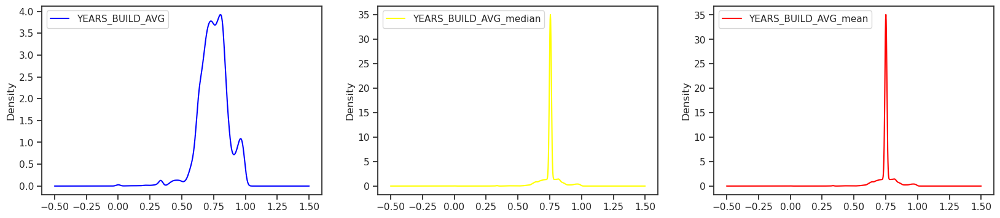

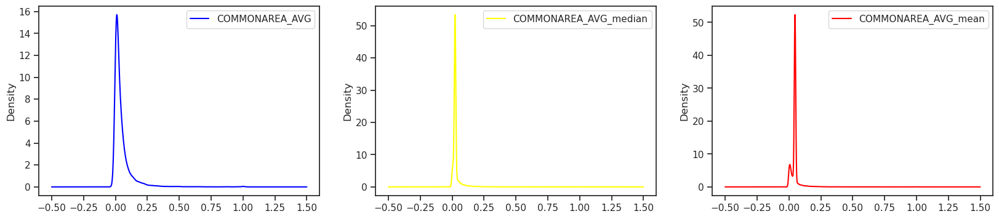

In [1422]:
# impultation par median
application_test['YEARS_BUILD_MEDI_median'] = application_test['YEARS_BUILD_MEDI'].fillna(application_test['YEARS_BUILD_MEDI'].median())
# impulation par mean
application_test['YEARS_BUILD_MEDI_mean'] = application_test['YEARS_BUILD_MEDI'].fillna(application_test['YEARS_BUILD_MEDI'].mean())

sns.set(style="ticks", rc = {'figure.figsize':(20, 4)})
# visualisation
plt.subplot(1, 3, 1)
application_test["YEARS_BUILD_MEDI"].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_test['YEARS_BUILD_MEDI_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_test['YEARS_BUILD_MEDI_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#--------------------------------------------------------
# impulation par mean
application_test['OWN_CAR_AGE_median'] = application_test['OWN_CAR_AGE'].fillna(application_test['OWN_CAR_AGE'].median())
# impulation par mean
application_test['OWN_CAR_AGE_mean'] = application_test['OWN_CAR_AGE'].fillna(application_test['OWN_CAR_AGE'].mean())

plt.subplot(1, 3, 1)
application_test['OWN_CAR_AGE'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_test['OWN_CAR_AGE_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_test['OWN_CAR_AGE_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#-------------------------------------------------------------

# impulation par mean
application_test['YEARS_BUILD_AVG_median'] = application_test['YEARS_BUILD_AVG'].fillna(application_test['YEARS_BUILD_AVG'].median())
# impulation par mean
application_test['YEARS_BUILD_AVG_mean'] = application_test['YEARS_BUILD_AVG'].fillna(application_test['YEARS_BUILD_AVG'].mean())

plt.subplot(1, 3, 1)
application_test['YEARS_BUILD_AVG'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_test['YEARS_BUILD_AVG_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_test['YEARS_BUILD_AVG_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()

#-------------------------------------------------------------------------
application_test['COMMONAREA_AVG_median'] = application_test['COMMONAREA_AVG'].fillna(application_test['COMMONAREA_AVG'].median())
# impulation par mean
application_test['COMMONAREA_AVG_mean'] = application_test['COMMONAREA_AVG'].fillna(application_test['COMMONAREA_AVG'].mean())

plt.subplot(1, 3, 1)
application_test['COMMONAREA_AVG'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_test['COMMONAREA_AVG_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_test['COMMONAREA_AVG_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()

* j'ai tester pour tout les colonnes avec des nan >0.4, l'impultation par la mediane et la moyenne pas posibles , ça change la distributiondes données d'origine du coup je vais les supprimer.

In [457]:
# les colonnes avec nana >0.4
messing_rate = application_test.columns[(application_test.isna().sum() / application_test.shape[0] >0.4)].tolist()
# les colonnes cree apres l'essaies de l'impultation par mean et mediane
columns_to_remove = [col for col in application_test.columns if col.endswith('_mean') or col.endswith('_median')]
# combinaison de deux liste:
list_to_remove = messing_rate + columns_to_remove
#  suppression de liste de colonne de la dataframe
application_test = application_test.drop(columns= list_to_remove, axis=1)

In [458]:
# je fais l'impultation des colonnes avec les nan <0.4
messing_rate = application_test.columns[(application_test.isna().sum() / application_test.shape[0] >0.0)].tolist()
messing_rate

['AMT_ANNUITY',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'AMT_REQ_CREDIT_BUREAU_HOUR',
 'AMT_REQ_CREDIT_BUREAU_DAY',
 'AMT_REQ_CREDIT_BUREAU_WEEK',
 'AMT_REQ_CREDIT_BUREAU_MON',
 'AMT_REQ_CREDIT_BUREAU_QRT',
 'AMT_REQ_CREDIT_BUREAU_YEAR']

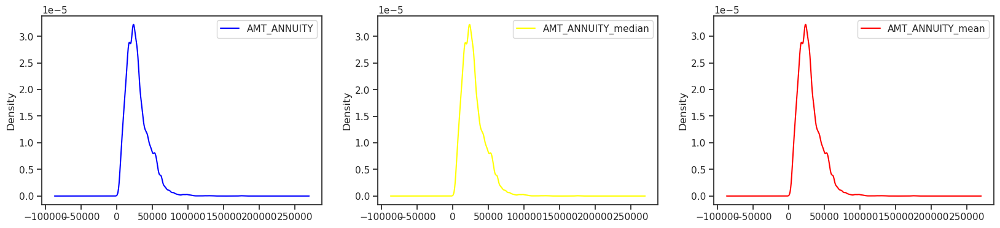

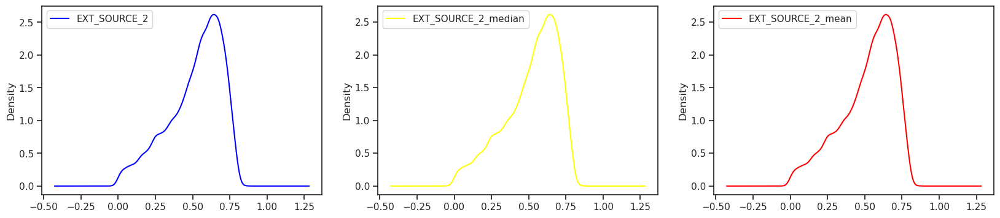

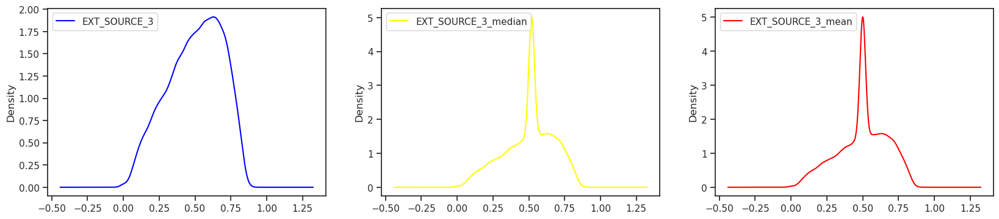

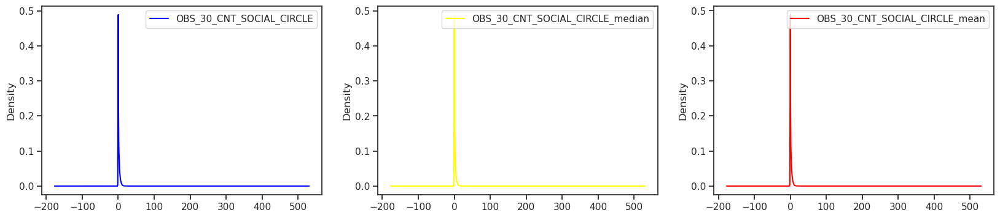

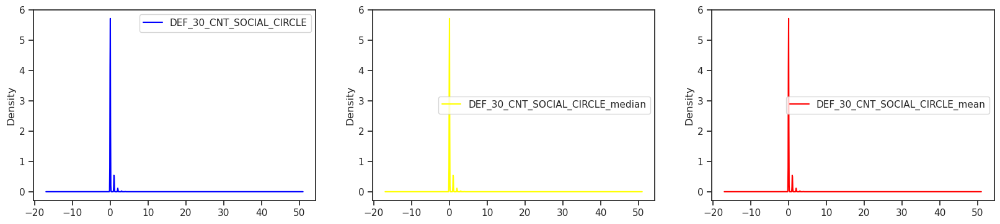

...

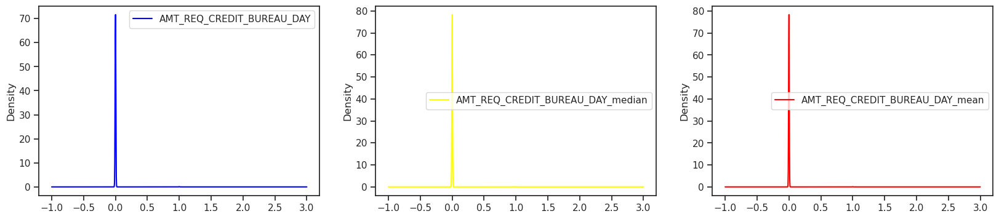

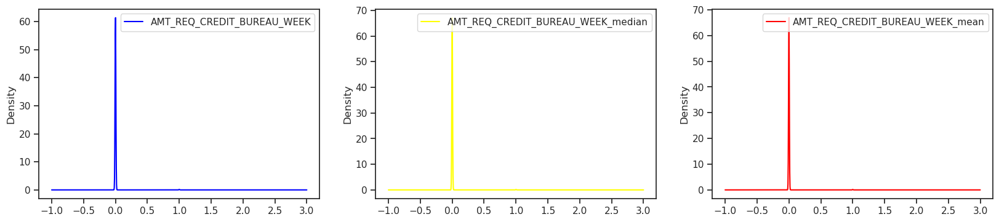

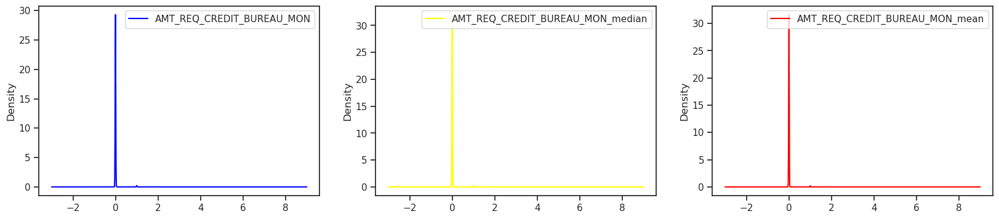

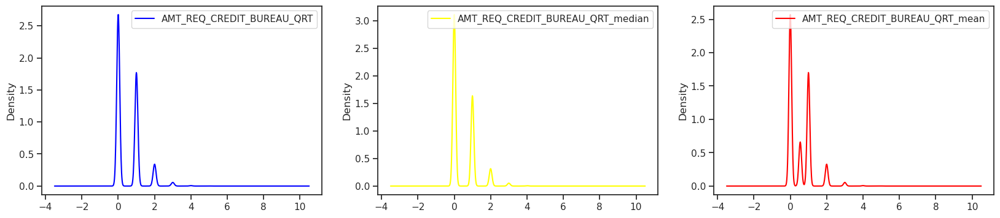

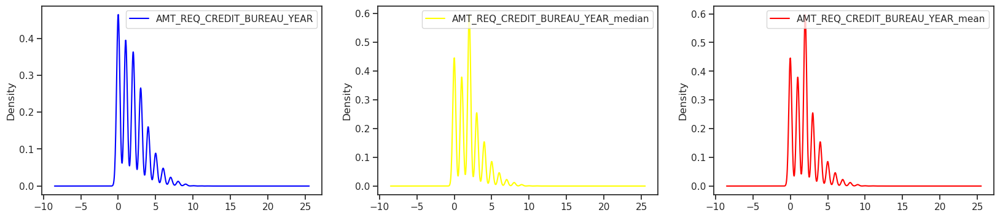

In [1425]:
# impultation par median
application_test['AMT_ANNUITY_median'] = application_test['AMT_ANNUITY'].fillna(application_test['AMT_ANNUITY'].median())
# impulation par mean
application_test['AMT_ANNUITY_mean'] = application_test['AMT_ANNUITY'].fillna(application_test['AMT_ANNUITY'].mean())

sns.set(style="ticks", rc = {'figure.figsize':(20, 4)})
# visualisation
plt.subplot(1, 3, 1)
application_test["AMT_ANNUITY"].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_test['AMT_ANNUITY_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_test['AMT_ANNUITY_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()

#-------------------------------------------------------------------------
application_test['EXT_SOURCE_2_median'] = application_test['EXT_SOURCE_2'].fillna(application_test['EXT_SOURCE_2'].median())
# impulation par mean
application_test['EXT_SOURCE_2_mean'] = application_test['EXT_SOURCE_2'].fillna(application_test['EXT_SOURCE_2'].mean())

plt.subplot(1, 3, 1)
application_test['EXT_SOURCE_2'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_test['EXT_SOURCE_2_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_test['EXT_SOURCE_2_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#------------------------------------------------------------------------------------
application_test['EXT_SOURCE_3_median'] = application_test['EXT_SOURCE_3'].fillna(application_test['EXT_SOURCE_3'].median())
# impulation par mean
application_test['EXT_SOURCE_3_mean'] = application_test['EXT_SOURCE_3'].fillna(application_test['EXT_SOURCE_3'].mean())

plt.subplot(1, 3, 1)
application_test['EXT_SOURCE_3'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_test['EXT_SOURCE_3_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_test['EXT_SOURCE_3_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#---------------------------------------------------------------------
application_test['OBS_30_CNT_SOCIAL_CIRCLE_median'] = application_test['OBS_30_CNT_SOCIAL_CIRCLE'].fillna(application_test['OBS_30_CNT_SOCIAL_CIRCLE'].median())
# impulation par mean
application_test['OBS_30_CNT_SOCIAL_CIRCLE_mean'] = application_test['OBS_30_CNT_SOCIAL_CIRCLE'].fillna(application_test['OBS_30_CNT_SOCIAL_CIRCLE'].mean())

plt.subplot(1, 3, 1)
application_test['OBS_30_CNT_SOCIAL_CIRCLE'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_test['OBS_30_CNT_SOCIAL_CIRCLE_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_test['OBS_30_CNT_SOCIAL_CIRCLE_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#--------------------------------------------------------------
application_test['DEF_30_CNT_SOCIAL_CIRCLE_median'] = application_test['DEF_30_CNT_SOCIAL_CIRCLE'].fillna(application_test['DEF_30_CNT_SOCIAL_CIRCLE'].median())
# impulation par mean
application_test['DEF_30_CNT_SOCIAL_CIRCLE_mean'] = application_test['DEF_30_CNT_SOCIAL_CIRCLE'].fillna(application_test['DEF_30_CNT_SOCIAL_CIRCLE'].mean())

plt.subplot(1, 3, 1)
application_test['DEF_30_CNT_SOCIAL_CIRCLE'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_test['DEF_30_CNT_SOCIAL_CIRCLE_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_test['DEF_30_CNT_SOCIAL_CIRCLE_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#---------------------------------------------------------------------------------
application_test['OBS_60_CNT_SOCIAL_CIRCLE_median'] = application_test['OBS_60_CNT_SOCIAL_CIRCLE'].fillna(application_test['OBS_60_CNT_SOCIAL_CIRCLE'].median())
# impulation par mean
application_test['OBS_60_CNT_SOCIAL_CIRCLE_mean'] = application_test['OBS_60_CNT_SOCIAL_CIRCLE'].fillna(application_test['OBS_60_CNT_SOCIAL_CIRCLE'].mean())

plt.subplot(1, 3, 1)
application_test['OBS_60_CNT_SOCIAL_CIRCLE'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_test['OBS_60_CNT_SOCIAL_CIRCLE_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_test['OBS_60_CNT_SOCIAL_CIRCLE_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#||||||||||||||||||||||||-----------------------------------------------------
application_test['DEF_60_CNT_SOCIAL_CIRCLE_median'] = application_test['DEF_60_CNT_SOCIAL_CIRCLE'].fillna(application_test['DEF_60_CNT_SOCIAL_CIRCLE'].median())
# impulation par mean
application_test['DEF_60_CNT_SOCIAL_CIRCLE_mean'] = application_test['DEF_60_CNT_SOCIAL_CIRCLE'].fillna(application_test['DEF_60_CNT_SOCIAL_CIRCLE'].mean())

plt.subplot(1, 3, 1)
application_test['DEF_60_CNT_SOCIAL_CIRCLE'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_test['DEF_60_CNT_SOCIAL_CIRCLE_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_test['DEF_60_CNT_SOCIAL_CIRCLE_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#----------------------------------------------------------------------------
application_test['AMT_REQ_CREDIT_BUREAU_HOUR_median'] = application_test['AMT_REQ_CREDIT_BUREAU_HOUR'].fillna(application_test['AMT_REQ_CREDIT_BUREAU_HOUR'].median())
# impulation par mean
application_test['AMT_REQ_CREDIT_BUREAU_HOUR_mean'] = application_test['AMT_REQ_CREDIT_BUREAU_HOUR'].fillna(application_test['AMT_REQ_CREDIT_BUREAU_HOUR'].mean())

plt.subplot(1, 3, 1)
application_test['AMT_REQ_CREDIT_BUREAU_HOUR'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_test['AMT_REQ_CREDIT_BUREAU_HOUR_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_test['AMT_REQ_CREDIT_BUREAU_HOUR_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#______________________________________________-------------------------
application_test['AMT_REQ_CREDIT_BUREAU_DAY_median'] = application_test['AMT_REQ_CREDIT_BUREAU_DAY'].fillna(application_test['AMT_REQ_CREDIT_BUREAU_DAY'].median())
# impulation par mean
application_test['AMT_REQ_CREDIT_BUREAU_DAY_mean'] = application_test['AMT_REQ_CREDIT_BUREAU_DAY'].fillna(application_test['AMT_REQ_CREDIT_BUREAU_DAY'].mean())

plt.subplot(1, 3, 1)
application_test['AMT_REQ_CREDIT_BUREAU_DAY'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_test['AMT_REQ_CREDIT_BUREAU_DAY_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_test['AMT_REQ_CREDIT_BUREAU_DAY_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#--------------------------------------------------------------------------

application_test['AMT_REQ_CREDIT_BUREAU_WEEK_median'] = application_test['AMT_REQ_CREDIT_BUREAU_WEEK'].fillna(application_test['AMT_REQ_CREDIT_BUREAU_WEEK'].median())
# impulation par mean
application_test['AMT_REQ_CREDIT_BUREAU_WEEK_mean'] = application_test['AMT_REQ_CREDIT_BUREAU_WEEK'].fillna(application_test['AMT_REQ_CREDIT_BUREAU_WEEK'].mean())

plt.subplot(1, 3, 1)
application_test['AMT_REQ_CREDIT_BUREAU_WEEK'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_test['AMT_REQ_CREDIT_BUREAU_WEEK_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_test['AMT_REQ_CREDIT_BUREAU_WEEK_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#---------------------------------------------------------------------
application_test['AMT_REQ_CREDIT_BUREAU_MON_median'] = application_test['AMT_REQ_CREDIT_BUREAU_MON'].fillna(application_test['AMT_REQ_CREDIT_BUREAU_MON'].median())
# impulation par mean
application_test['AMT_REQ_CREDIT_BUREAU_MON_mean'] = application_test['AMT_REQ_CREDIT_BUREAU_MON'].fillna(application_test['AMT_REQ_CREDIT_BUREAU_MON'].mean())

plt.subplot(1, 3, 1)
application_test['AMT_REQ_CREDIT_BUREAU_MON'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_test['AMT_REQ_CREDIT_BUREAU_MON_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_test['AMT_REQ_CREDIT_BUREAU_MON_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#-------------------------------------------------------------
application_test['AMT_REQ_CREDIT_BUREAU_QRT_median'] = application_test['AMT_REQ_CREDIT_BUREAU_QRT'].fillna(application_test['AMT_REQ_CREDIT_BUREAU_QRT'].median())
# impulation par mean
application_test['AMT_REQ_CREDIT_BUREAU_QRT_mean'] = application_test['AMT_REQ_CREDIT_BUREAU_QRT'].fillna(application_test['AMT_REQ_CREDIT_BUREAU_QRT'].mean())

plt.subplot(1, 3, 1)
application_test['AMT_REQ_CREDIT_BUREAU_QRT'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_test['AMT_REQ_CREDIT_BUREAU_QRT_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_test['AMT_REQ_CREDIT_BUREAU_QRT_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()
#--------------------------------------------------------------------------
application_test['AMT_REQ_CREDIT_BUREAU_YEAR_median'] = application_test['AMT_REQ_CREDIT_BUREAU_YEAR'].fillna(application_test['AMT_REQ_CREDIT_BUREAU_YEAR'].median())
# impulation par mean
application_test['AMT_REQ_CREDIT_BUREAU_YEAR_mean'] = application_test['AMT_REQ_CREDIT_BUREAU_YEAR'].fillna(application_test['AMT_REQ_CREDIT_BUREAU_YEAR'].mean())

plt.subplot(1, 3, 1)
application_test['AMT_REQ_CREDIT_BUREAU_YEAR'].plot(kind='kde',color='blue')
plt.legend()
plt.subplot(1, 3, 2)
application_test['AMT_REQ_CREDIT_BUREAU_YEAR_median'].plot(kind='kde',color='yellow')
plt.legend()
plt.subplot(1, 3, 3)
application_test['AMT_REQ_CREDIT_BUREAU_YEAR_mean'].plot(kind='kde',color='red')
plt.legend()
plt.show()

In [459]:
# la disribution de ces colonnes changes apres l'ipultation par la moyen eet la mediane paraport au données originale:
col_to_dropna = ['AMT_REQ_CREDIT_BUREAU_HOUR','AMT_REQ_CREDIT_BUREAU_DAY','AMT_REQ_CREDIT_BUREAU_WEEK',
 'AMT_REQ_CREDIT_BUREAU_MON','AMT_REQ_CREDIT_BUREAU_QRT','AMT_REQ_CREDIT_BUREAU_YEAR',
 'EXT_SOURCE_3']
# pour les autre features dans la liste col je vais supprimer les lignes vide vu que l'ipultation par la mediane ets imposible:
application_test = application_test.dropna(subset=col_to_dropna)

col_to_impute = ['AMT_ANNUITY','EXT_SOURCE_2','OBS_30_CNT_SOCIAL_CIRCLE',
                            'DEF_30_CNT_SOCIAL_CIRCLE','OBS_60_CNT_SOCIAL_CIRCLE','DEF_60_CNT_SOCIAL_CIRCLE']
# je fais l'impultation pour les colonne de la liste col_to_impute:
application_test[col_to_impute] = application_test[col_to_impute].fillna(application_test[col_to_impute].median())


### Analyse multivariée:

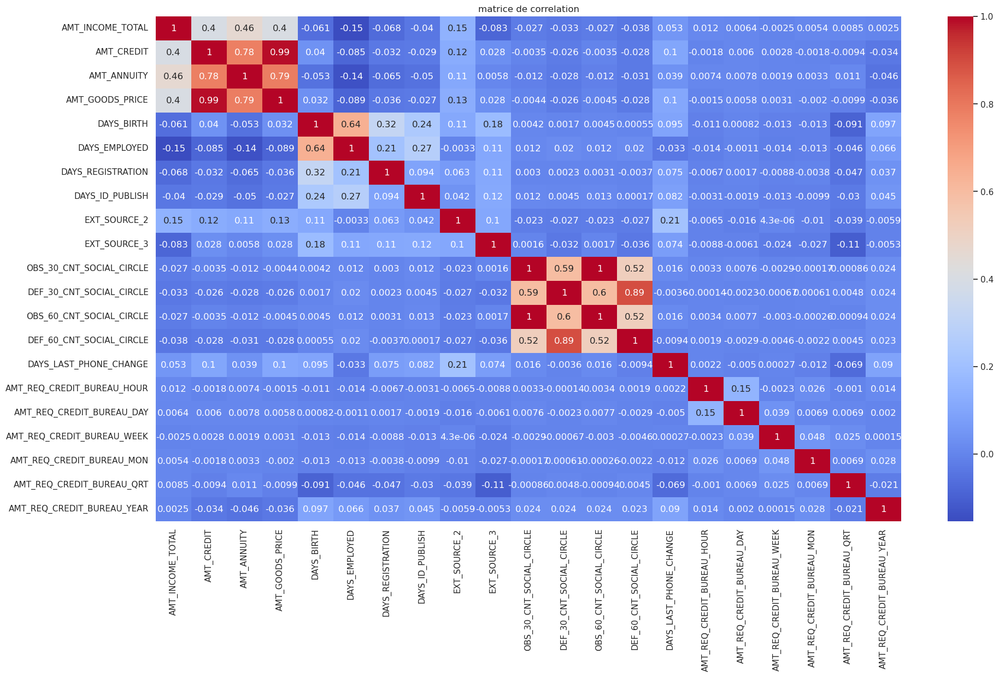

In [460]:
col = application_test.select_dtypes(include=['float64', 'float32']).columns
# col
df = application_test[col]
matrix = df.corr(method = 'pearson')
plt.figure(figsize = (22,12))
sns.heatmap(matrix, annot = True,cmap = 'coolwarm')
plt.title('matrice de correlation')
plt.show()


**d'apres la matrice de correlation:**

- correlation entre 'AMT_CREDIT' ET 'AMT_GOODS_PRICE'.  À 99%.
- OBS_30_CNT_SOCIAL_CIRCLE et OBS_60_CNT_SOCIAL_CIRCLE.à 100%.
* je supprime l'un de deux colonnes plus correle.

In [461]:
application_test.drop(columns = ['OBS_60_CNT_SOCIAL_CIRCLE','AMT_GOODS_PRICE'], inplace  = True, axis = 1)


In [462]:
#" creation des colonnes engenniring"
application_test['CREDIT_INCOME_PERCENT'] = application_test['AMT_CREDIT'] / application_test['AMT_INCOME_TOTAL']
application_test['ANNUITY_INCOME_PERCENT'] = application_test['AMT_ANNUITY'] / application_test['AMT_INCOME_TOTAL']
application_test['CREDIT_TERM'] = application_test['AMT_ANNUITY'] / application_test['AMT_CREDIT']

In [463]:
group_to_map = {

    'Working':'Working',
    'State servant':'State servant',
    'Commercial associate':'Commercial associate',
    'Pensioner':'Pensioner_Unemployed',
    'Unemployed':'Pensioner_Unemployed',
    'Student':'Pensioner_Unemployed',
    'Businessman':'Businessman',
    'Maternity leave':'Pensioner_Unemployed'
}

application_train['NAME_INCOME_TYPE'] = application_train['NAME_INCOME_TYPE'].replace(group_to_map)
application_test['NAME_INCOME_TYPE'] = application_test['NAME_INCOME_TYPE'].replace(group_to_map)

In [464]:
application_train['NAME_INCOME_TYPE'].unique()

array(['Working', 'State servant', 'Commercial associate',
       'Pensioner_Unemployed', 'Businessman'], dtype=object)

In [465]:
application_test['NAME_INCOME_TYPE'].unique()

array(['Working', 'State servant', 'Pensioner_Unemployed',
       'Commercial associate', 'Businessman'], dtype=object)

In [466]:
application_test.shape, application_train.shape

((40076, 64), (246541, 65))

In [467]:
liste1 = application_test.columns.to_list()
liste2 = application_train.columns.to_list()
len(liste1) , len(liste2)

(64, 65)

In [471]:
# application_test['NAME_INCOME_TYPE'].unique()

array(['Working', 'State servant', 'Pensioner_Unemployed',
       'Commercial associate', 'Businessman'], dtype=object)

In [ ]:
# data['NAME_INCOME_TYPE'].unique()

In [473]:
# application_train['NAME_INCOME_TYPE'].unique()

array(['Working', 'State servant', 'Commercial associate',
       'Pensioner_Unemployed', 'Businessman'], dtype=object)

In [1128]:
# application_test[application_test['NAME_INCOME_TYPE']=='Student']

In [468]:
application_test.to_csv('./pretraitements_data/application_test.csv', index = False)

In [469]:
application_train.to_csv('./pretraitements_data/application_train.csv',index = False)

In [470]:
# for col in application_test.columns:
#     # Vérification si 'XNA' ou 'XAP' sont présents dans la colonne
#     if 'XNA' in application_test[col].values or 'XAP' in application_test[col].values:
#         print(f"La colonne {col} contient 'XNA' ou 'XAP'")